<a href="https://colab.research.google.com/github/lorquez/real_estate_price_predictor/blob/main/real_estate_price_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

These are the modules we will need for this project

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import requests
import time
import json
import math
import os
import random

Let's import the databases and check it out

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Loading Idealista Dataset**

In [3]:
datasets_folder = '/content/drive/MyDrive/Kschool_TFM/datasets/'

In [4]:
idealista_df = pd.read_csv(f'{datasets_folder}idealista_dataset.csv')
idealista_df.sample(10)

,id,propertyType,title,locationId,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,...,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,featureTags,heatingType,interiorExterior,floor,area_name
1554,97942879,piso,piso en venta en plaza del campillo del mundo ...,0-EU-ES-28-07-001-079-01,358000,70.0,1,2,2,0,...,0,1,1,0,0,[],Calefacción individual,exterior,planta 1ª,Centro
8783,98475017,piso,piso en venta en calle de covarrubias,0-EU-ES-28-07-001-079-07,895000,144.0,0,4,2,0,...,0,1,1,0,0,['Lujo'],Calefacción central,exterior,entreplanta,Chamberí
16071,97837662,piso,piso en venta en gran vía del sureste,0-EU-ES-28-07-001-079-18,289900,123.0,1,2,2,1,...,1,1,1,0,0,[],Calefacción individual,exterior,planta 1ª,Villa de Vallecas
7471,96781198,piso,ático en venta en paseo del general martínez c...,0-EU-ES-28-07-001-079-07,1500000,180.0,0,4,3,0,...,0,1,1,0,0,['Lujo'],Calefacción central: Gas,exterior,planta 7ª,Chamberí
2841,97906973,piso,piso en venta en calle algorta,0-EU-ES-28-07-001-079-11,490000,148.0,1,4,2,1,...,1,1,1,0,0,[],no info,exterior,planta 2ª,Carabanchel
2537,95901926,piso,"piso en venta en calle de beasain, 28041",0-EU-ES-28-07-001-079-12,245000,90.0,1,2,2,1,...,1,1,1,0,0,[],Calefacción individual: Gas natural,exterior,planta 5ª,Usera
12855,97853287,chalet,chalet adosado en venta en peñagrande,0-EU-ES-28-07-001-079-08,975000,235.0,1,5,3,0,...,1,0,1,0,0,['Lujo'],Calefacción individual: Eléctrica,does not apply,does not apply,Fuencarral
12157,82717663,piso,piso en venta en ventas,0-EU-ES-28-07-001-079-15,347000,100.0,1,3,2,0,...,0,1,1,0,0,[],Calefacción individual: Gas natural,exterior,planta 1ª,Ciudad Lineal
9918,98288390,piso,piso en venta en goya,0-EU-ES-28-07-001-079-04,889000,95.0,0,3,3,0,...,0,1,1,0,0,['Lujo'],Calefacción central: Gas,exterior,planta 1ª,Barrio de Salamanca
6572,98371309,piso,piso en venta en los riojanos,0-EU-ES-28-07-001-079-13,204900,108.0,1,3,2,0,...,1,1,1,0,0,[],Calefacción individual: Gas natural,exterior,planta 3ª,Puente de Vallecas


In [5]:
print(idealista_df.shape)
idealista_df = idealista_df.drop_duplicates()
print(idealista_df.shape)

(16390, 21)
(16390, 21)


In [6]:
idealista_df.isna().any()

id                   False
propertyType         False
title                False
locationId           False
price                False
size                 False
hasParking           False
roomNumber           False
bathNumber           False
hasSwimmingPool      False
hasTerrace           False
hasGarden            False
hasLift              False
isGoodCondition      False
isNeedsRenovating    False
isNewDevelopment     False
featureTags          False
heatingType          False
interiorExterior     False
floor                False
area_name            False
dtype: bool

Looks like idealista dataset has no NaN value.

In [7]:
idealista_df.dtypes

id                     int64
propertyType          object
title                 object
locationId            object
price                  int64
size                 float64
hasParking             int64
roomNumber             int64
bathNumber             int64
hasSwimmingPool        int64
hasTerrace             int64
hasGarden              int64
hasLift                int64
isGoodCondition        int64
isNeedsRenovating      int64
isNewDevelopment       int64
featureTags           object
heatingType           object
interiorExterior      object
floor                 object
area_name             object
dtype: object

In [8]:
idealista_df['size'] = idealista_df['size'].astype(int)
idealista_df['id'] = idealista_df['id'].astype(str)

## **Loading Fotocasa Datasets**

In [9]:
fotocasa_df1 = pd.read_csv(f'{datasets_folder}fotocasa_dataset.csv')
fotocasa_df2 = pd.read_csv(f'{datasets_folder}fotocasa_dataset_madrid.csv')
fotocasa_df3 = pd.read_csv(f'{datasets_folder}fotocasa_dataset_madrid_2.csv')
fotocasa_df4 = pd.read_csv(f'{datasets_folder}fotocasa_dataset_madrid_3.csv')

fotocasa_df = pd.concat([fotocasa_df1,fotocasa_df2,fotocasa_df3,fotocasa_df4]).reset_index(drop=True)

fotocasa_df.head(10)

,origin,page,title,link,image_url,country,district,neighborhood,street,zipCode,...,surface,energyCertificate,hotWater,heating,conservationState,antiquity,floor,surfaceLand,otherFeatures,price
0,fotocasa,940,"Piso en venta en Calle de Fenelón, 11",https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,San Blas,Canillejas,"Calle de Fenelón, 11",28022,...,95,G,NaN,NaN,Muy bien,20 a 30 años,0,0,"{'2': 'Armarios', '3': 'Calefacción', '10': 'T...",190000
1,fotocasa,940,"Piso en venta en Calle de la Reina Mercedes, 13",https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Tetuán,Cuatro Caminos - Azca,"Calle de la Reina Mercedes, 13",28020,...,140,G,NaN,NaN,Muy bien,50 a 70 años,0,0,"{'2': 'Armarios', '3': 'Calefacción', '9': 'Pa...",720000
2,fotocasa,940,Piso en venta en Calle Polvoranca,https://www.fotocasa.es/es/comprar/vivienda/hu...,https://static.inmofactory.com/images/inmofact...,España,NaN,NaN,Calle Polvoranca,28970,...,100,G,Gas Natural,Gas Natural,Muy bien,10 a 20 años,10,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",200000
3,fotocasa,940,"Piso en venta en Calle Porto Lagos, 11",https://www.fotocasa.es/es/comprar/vivienda/al...,https://static.inmofactory.com/images/inmofact...,España,Parque Lisboa - La Paz,NaN,"Calle Porto Lagos, 11",28924,...,104,G,NaN,NaN,Bien,30 a 50 años,8,0,"{'10': 'Terraza', '28': 'Serv. portería'}",260000
4,fotocasa,940,Piso en venta en Calle del Hierro,https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Arganzuela,Legazpi,Calle del Hierro,28045,...,118,G,NaN,NaN,Bien,10 a 20 años,0,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",429999
5,fotocasa,940,"Piso en venta en Calle de Humanes, 4",https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Puente de Vallecas,Portazgo,"Calle de Humanes, 4",28038,...,81,G,NaN,NaN,Bien,30 a 50 años,0,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",201000
6,fotocasa,940,"Ático en venta en Calle Isabel Méndez, 2",https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Puente de Vallecas,Numancia,"Calle Isabel Méndez, 2",28038,...,105,E,NaN,NaN,Casi nuevo,10 a 20 años,0,0,"{'2': 'Armarios', '3': 'Calefacción', '10': 'T...",299999
7,fotocasa,940,"Dúplex en venta en Calle Águilas, 1",https://www.fotocasa.es/es/comprar/vivienda/ar...,https://static.fotocasa.es/images/anuncio/2022...,España,Zona el Caño,NaN,"Calle Águilas, 1",28939,...,214,G,NaN,NaN,Muy bien,5 a 10 años,0,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",365000
8,fotocasa,940,"Piso en venta en Calle Juan Sánchez, 3",https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Fuencarral - El Pardo,Peñagrande,"Calle Juan Sánchez, 3",28035,...,87,G,NaN,NaN,Bien,10 a 20 años,0,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",478000
9,fotocasa,940,Piso en venta en Calle de Gabriel Lobo,https://www.fotocasa.es/es/comprar/vivienda/ma...,https://static.fotocasa.es/images/anuncio/2022...,España,Chamartín,El Viso,Calle de Gabriel Lobo,28002,...,120,G,NaN,NaN,Muy bien,70 a 100 años,0,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",760000


In [10]:
fotocasa_df = fotocasa_df.drop(['page'], axis=1)

In [11]:
fotocasa_df.columns

Index(['origin', 'title', 'link', 'image_url', 'country', 'district',
       'neighborhood', 'street', 'zipCode', 'province', 'buildingType',
       'clientAlias', 'latitude', 'longitude', 'isNewConstruction', 'rooms',
       'bathrooms', 'parking', 'elevator', 'furnished', 'surface',
       'energyCertificate', 'hotWater', 'heating', 'conservationState',
       'antiquity', 'floor', 'surfaceLand', 'otherFeatures', 'price'],
      dtype='object')

In [12]:
print(fotocasa_df.shape)
fotocasa_df = fotocasa_df.drop_duplicates()
print(fotocasa_df.shape)

(75563, 30)
(27888, 30)


In [13]:
fotocasa_df.isna().any()

origin               False
title                False
link                 False
image_url            False
country              False
district              True
neighborhood          True
street                True
zipCode               True
province             False
buildingType         False
clientAlias           True
latitude             False
longitude            False
isNewConstruction    False
rooms                False
bathrooms            False
parking               True
elevator              True
furnished             True
surface              False
energyCertificate    False
hotWater              True
heating               True
conservationState     True
antiquity             True
floor                False
surfaceLand          False
otherFeatures        False
price                False
dtype: bool

Looks like fotocasa dataset has some NaN values that need to be cleaned out, so let's drop rows with all NaN values:

In [14]:
fotocasa_df = fotocasa_df.dropna(how="all")

In [15]:
fotocasa_df.isna().any()

origin               False
title                False
link                 False
image_url            False
country              False
district              True
neighborhood          True
street                True
zipCode               True
province             False
buildingType         False
clientAlias           True
latitude             False
longitude            False
isNewConstruction    False
rooms                False
bathrooms            False
parking               True
elevator              True
furnished             True
surface              False
energyCertificate    False
hotWater              True
heating               True
conservationState     True
antiquity             True
floor                False
surfaceLand          False
otherFeatures        False
price                False
dtype: bool

There are still some NaN values that can be checked later.

In [16]:
fotocasa_df.dtypes

origin               object
title                object
link                 object
image_url            object
country              object
district             object
neighborhood         object
street               object
zipCode              object
province             object
buildingType         object
clientAlias          object
latitude             object
longitude            object
isNewConstruction    object
rooms                object
bathrooms            object
parking              object
elevator             object
furnished            object
surface              object
energyCertificate    object
hotWater             object
heating              object
conservationState    object
antiquity            object
floor                object
surfaceLand          object
otherFeatures        object
price                 int64
dtype: object

## **Datasets Comparison**

Let's compare the two dataset's features

| # | idealista | fotocasa | comment |
| --- | --- | --- | --- |
| 01 | title | title | KEEP |
| 02 | id | link | transform fotocasa |
| 03 | locationId | / | drop |
| 04 | / | image_url | drop |
| 05 | / | country | drop |
| 06 | area_name | district | KEEP |
| 07 | / | neighborhood | drop |
| 08 | / | street | drop |
| 09 | / | zipCode | drop |
| 10 | / | province | drop |
| 11 | propertyType | buildingType | KEEP |
| 12 | / | clientAlias | drop |
| 13 | none | latitude | drop |
| 14 | none | longitude | drop |
| 15 | isNewDevelopment | isNewConstruction | KEEP |
| 16 | roomNumber | rooms | KEEP |
| 17 | bathNumber | bathrooms | KEEP |
| 18 | hasParking | parking | KEEP |
| 19 | hasLift | elevator | KEEP |
| 20 | hasGarden | / | drop |
| 21 | hasSwimmingPool | / | no info for fotocasa |
| 22 | hasTerrace | / | no info for fotocasa |
| 23 | interiorExterior | / | drop |
| 24 | / | furnished | drop |
| 25 | size | surface | KEEP |
| 26 | / | energyCertificate | drop |
| 27 | / | hotWater | drop |
| 28 | heatingType | heating | KEEP |
| 29 | isGoodCondition | conservationState | transform fotocasa |
| 30 | isNeedsRenovating | / | transform fotocasa |
| 31 | / | antiquity | drop |
| 32 | floor | floor | KEEP |
| 33 | / | surfaceLand | sum with surface |
| 34 | featureTags | otherFeatures | **dig deeper into this** |
| 35 | price | price | KEEP |


There are some hidden features in the "otherFeatures" column of the fotocasa dataset. Let's check them out.



In [17]:
fotocasa_df['otherFeatures'].unique()

array(["{'2': 'Armarios', '3': 'Calefacción', '10': 'Terraza'}",
       "{'2': 'Armarios', '3': 'Calefacción', '9': 'Parquet', '11': 'Trastero', '12': 'Z. Comunitaria', '109': 'Lavadero'}",
       "{'1': 'Aire acondicionado', '2': 'Armarios', '9': 'Parquet', '10': 'Terraza', '12': 'Z. Comunitaria', '18': 'Suite - con baño', '22': 'Horno', '52': 'Internet', '84': 'Puerta Blindada', '109': 'Lavadero', '131': 'Cocina Equipada'}",
       ...,
       "{'1': 'Aire acondicionado', '2': 'Armarios', '3': 'Calefacción', '6': 'Gres Cerámica', '9': 'Parquet', '10': 'Terraza', '15': 'Cocina Office', '18': 'Suite - con baño', '84': 'Puerta Blindada', '131': 'Cocina Equipada'}",
       "{'1': 'Aire acondicionado', '2': 'Armarios', '3': 'Calefacción', '10': 'Terraza', '11': 'Trastero', '18': 'Suite - con baño', '28': 'Serv. portería', '42': 'Gimnasio', '94': 'Piscina comunitaria', '131': 'Cocina Equipada'}",
       "{'1': 'Aire acondicionado', '2': 'Armarios', '3': 'Calefacción', '9': 'Parquet', '10':

It is necessary to extract all the features and see if there is any that can be of use

In [18]:
new_features = []
new_features_vector = fotocasa_df['otherFeatures'].str.replace(r"{|}|'[0-9][0-9]?[0-9]?': |'",'', regex=True).str.split(', ')
new_features_vector.apply(lambda x: [new_features.append(features) for features in x if features not in new_features and features != ''])
new_features

['Armarios',
 'Calefacción',
 'Terraza',
 'Parquet',
 'Trastero',
 'Z. Comunitaria',
 'Lavadero',
 'Aire acondicionado',
 'Suite - con baño',
 'Horno',
 'Internet',
 'Puerta Blindada',
 'Cocina Equipada',
 'Serv. portería',
 'Jardín Privado',
 'Videoportero',
 'Zona Infantil',
 'Piscina',
 'Balcón',
 'Zona Deportiva',
 'Patio',
 'Gres Cerámica',
 'Electrodomésticos',
 'Lavadora',
 'Microondas',
 'Nevera',
 'Piscina comunitaria',
 'Cocina Office',
 'TV',
 'Domótica',
 '^',
 'Ascensor interior',
 'Cuarto para el servicio',
 'Energía Solar',
 'Pista de Tenis',
 'Cuarto lavado plancha',
 'Jacuzzi',
 'Alarma',
 'Gimnasio',
 'Baño de huéspedes',
 'Porche cubierto',
 'Bodega',
 'Muebles de diseño',
 'Música ambiental',
 'Sauna',
 'Casa de invitados',
 'Sala de cine']

There is a weird ^ character that is used as a wildcard during scraping. It must be removed.

In [19]:
fotocasa_df[fotocasa_df['otherFeatures'].str.contains("\^")]

,origin,title,link,image_url,country,district,neighborhood,street,zipCode,province,...,surface,energyCertificate,hotWater,heating,conservationState,antiquity,floor,surfaceLand,otherFeatures,price
64,fotocasa,^,^,^,^,^,^,^,^,^,...,^,^,^,^,^,^,^,^,^,0


In [20]:
to_drop = fotocasa_df[fotocasa_df['otherFeatures'].str.contains("\^")].index
fotocasa_df = fotocasa_df.drop(to_drop)
del to_drop

There are some features that can be useful, such as "piscina/piscina comunitaria", "patio/jardin privado", "Terraza", which are present in Idealista as well

In [21]:
useful_features = {
    'hasSwimmingPool':['Piscina','Piscina comunitaria'],
    'hasGarden': ['Patio','Jardín Privado'],
    'hasTerrace':['Terraza']
    }

for key,value in useful_features.items():
  fotocasa_df[key] = fotocasa_df['otherFeatures'].str.contains('|'.join(value)).astype(int)

In [22]:
fotocasa_df[useful_features.keys()]

,hasSwimmingPool,hasGarden,hasTerrace
0,0,0,1
1,0,0,0
2,0,0,1
3,0,0,1
4,0,1,1
...,...,...,...
75447,0,0,0
75448,0,0,0
75449,0,0,0
75450,0,0,1


Idealista dataset also has a similar feature called "featureTags". Let's dig deeper into it:

In [23]:
idealista_df['featureTags'].unique()

array(["['Lujo']", '[]', "['Apartamento']", "['Lujo\\n\\n\\nVilla']",
       "['Villa']", "['Loft']", "['Casa baja']", "['Casa de piedra']",
       "['Buhardilla']", "['Lujo\\n\\n\\nApartamento']",
       "['Lujo\\n\\n\\nBuhardilla']", "['Lujo\\n\\n\\nLoft']"],
      dtype=object)

Apparently there is no new or interesting info into this feature.

Let's keep cleaning the fotocasa_df dataset, starting with the "link".
Fotocasa's links should all look like this, ending with "/d"

In [24]:
fotocasa_df['link'][0]

'https://www.fotocasa.es/es/comprar/vivienda/madrid-capital/calefaccion-terraza-ascensor/164109685/d'

As sanity check, let's see if there is any link that does not respect this rule

In [25]:
fotocasa_df[fotocasa_df['link'].str.endswith('/d')==False]

,origin,title,link,image_url,country,district,neighborhood,street,zipCode,province,...,heating,conservationState,antiquity,floor,surfaceLand,otherFeatures,price,hasSwimmingPool,hasGarden,hasTerrace


Apparently there is no issue in this colum so it can be transformed into a property id feature

In [26]:
fotocasa_df['id'] = fotocasa_df['link'].apply(lambda x: x.split('/')[-2])
fotocasa_df['id']

0        164109685
1        163938977
2        163368493
3        164116246
4        164075236
           ...    
75447    163776398
75448    145944918
75449    164939655
75450    163872099
75535    164782593
Name: id, Length: 27887, dtype: object

Fotocasa properties' size is separated into surface (representing the actual size of the house) and surfaceLand (the surface of the land on which the house is built on). To have the full size of the property, we need to sum them

In [27]:
fotocasa_df['size'] = fotocasa_df['surface'].astype(int) + fotocasa_df['surfaceLand'].astype(int)
fotocasa_df['size']

0         95
1        140
2        100
3        104
4        118
        ... 
75447    118
75448    220
75449     52
75450     40
75535     49
Name: size, Length: 27887, dtype: int64

Fotocasa dataset has one feature that informs us on whether the property is in good conditions or needs renovating. Idealista has this information already separated into two True/False features. Let's trasform Fotocasa dataset accordingly:

In [28]:
fotocasa_df['conservationState'].unique()

array(['Muy bien', 'Bien', 'Casi nuevo', nan, 'A reformar', 'Reformado'],
      dtype=object)

"A reformar" means the property needs renovating, while the rest of the values means the house is in good conditions

In [29]:
fotocasa_df['isGoodCondition'] = (fotocasa_df['conservationState']!='A reformar').astype(int)
fotocasa_df['isNeedsRenovating'] = (fotocasa_df['conservationState']=='A reformar').astype(int)

Let's compare idealista and fotocasa features again:

| # | idealista | fotocasa | comment |
| --- | --- | --- | --- |
| 01 | title | title | KEEP |
| 02 | / | link | drop |
| 03 | id | id | KEEP |
| 04 | locationId | / | drop |
| 05 | / | image_url | drop |
| 06 | / | country | drop |
| 07 | area_name | district | KEEP |
| 08 | / | neighborhood | drop |
| 09 | / | street | drop |
| 10 | / | zipCode | drop |
| 11 | / | province | drop |
| 12 | propertyType | buildingType | KEEP |
| 13 | / | clientAlias | drop |
| 14 | none | latitude | drop |
| 15 | none | longitude | drop |
| 16 | isNewDevelopment | isNewConstruction | KEEP |
| 17 | roomNumber | rooms | KEEP |
| 18 | bathNumber | bathrooms | KEEP |
| 19 | hasParking | parking | KEEP |
| 20 | hasLift | elevator | KEEP |
| 21 | hasGarden | hasGarden | KEEP |
| 22 | hasSwimmingPool | hasSwimmingPool | KEEP |
| 23 | hasTerrace | hasTerrace | KEEP |
| 24 | interiorExterior | / | drop |
| 25 | / | furnished | drop |
| 26 | size | size | KEEP |
| 27 | / | surface | drop |
| 28 | / | energyCertificate | drop |
| 29 | / | hotWater | drop |
| 30 | heatingType | heating | KEEP |
| 31 | / | conservationState | drop |
| 32 | isGoodCondition | isGoodCondition | KEEP |
| 33 | isNeedsRenovating | isNeedsRenovating | KEEP |
| 34 | / | antiquity | drop |
| 35 | floor | floor | KEEP |
| 36 | / | surfaceLand | drop |
| 37 | featureTags | otherFeatures | drop |
| 38 | price | price | KEEP |

## **Data Cleaning & Merging Datasets**

Having a selected features list now, it is necessary to check them one by one to see if some further data cleaning is needed.

In [30]:
fotocasa_df.isna().any()

origin               False
title                False
link                 False
image_url            False
country              False
district              True
neighborhood          True
street                True
zipCode               True
province             False
buildingType         False
clientAlias           True
latitude             False
longitude            False
isNewConstruction    False
rooms                False
bathrooms            False
parking               True
elevator              True
furnished             True
surface              False
energyCertificate    False
hotWater              True
heating               True
conservationState     True
antiquity             True
floor                False
surfaceLand          False
otherFeatures        False
price                False
hasSwimmingPool      False
hasGarden            False
hasTerrace           False
id                   False
size                 False
isGoodCondition      False
isNeedsRenovating    False
d

We can see that there are NaN values in district, neighborhood, street, zipCode, clientAlias, parking, elevator, furnished, hotWater, heating, conservationState and antiquity.

As many of the features we are going to eliminate, we are only concerned about the ones we are going to keep and have NaN values, such as district, parking, elevator and heating. Let's take a look at them.

In [31]:
len(fotocasa_df[fotocasa_df['district'].isna()])

1168

In [32]:
fotocasa_df[fotocasa_df['district'].isna()].head()

,origin,title,link,image_url,country,district,neighborhood,street,zipCode,province,...,surfaceLand,otherFeatures,price,hasSwimmingPool,hasGarden,hasTerrace,id,size,isGoodCondition,isNeedsRenovating
2,fotocasa,Piso en venta en Calle Polvoranca,https://www.fotocasa.es/es/comprar/vivienda/hu...,https://static.inmofactory.com/images/inmofact...,España,NaN,NaN,Calle Polvoranca,28970,Madrid,...,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",200000,0,0,1,163368493,100,1,0
17,fotocasa,Casa o chalet en venta en Avenida de la Cabrera,https://www.fotocasa.es/es/comprar/vivienda/la...,https://static.inmofactory.com/images/inmofact...,España,NaN,NaN,Avenida de la Cabrera,28751,Madrid,...,0,"{'2': 'Armarios', '6': 'Gres Cerámica', '7': '...",289000,1,1,1,164120295,164,1,0
25,fotocasa,"Casa o chalet en venta en Calle Real, 9",https://www.fotocasa.es/es/comprar/vivienda/po...,https://static.inmofactory.com/images/inmofact...,España,NaN,NaN,"Calle Real, 9",28813,Madrid,...,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",380000,0,1,1,162936565,380,1,0
45,fotocasa,Ático en venta en Calle Madrid,https://www.fotocasa.es/es/comprar/vivienda/hu...,https://static.fotocasa.es/images/anuncio/2021...,España,NaN,NaN,Calle Madrid,28970,Madrid,...,0,"{'1': 'Aire acondicionado', '2': 'Armarios', '...",250000,1,1,1,162032193,80,1,0
46,fotocasa,"Piso en venta en Calle Severo Ochoa, 2",https://www.fotocasa.es/es/comprar/vivienda/hu...,https://static.fotocasa.es/images/anuncio/2022...,España,NaN,NaN,"Calle Severo Ochoa, 2",28970,Madrid,...,0,{'9': 'Parquet'},190000,0,0,0,162571299,86,1,0


Properties without the district are outside the area of Madrid, which means that there are some houses that are not part of this municipality.
This can be checked using their zipcode.

In [33]:
madrid_zipcodes = {
    '28013':'Centro',
    '28045':'Arganzuela',
    '28007':'Retiro',
    '28001':'Salamanca',
    '28002':'Chamartin',
    '28020':'Tetuán',
    '28010':'Chamberí',
    '28029':'Fuencarral',
    '28008':'Moncloa',
    '28044':'Latina',
    '28025':'Carabanchel',
    '28026':'Usera',
    '28038':'Puente de Vallecas',
    '28030':'Moratalaz',
    '28037':'Ciudad Lineal',
    '28043':'Hortaleza',
    '28021':'Villaverde',
    '28031':'Villa de Vallecas',
    '28032':'Vicálvaro',
    '28022':'San Blas',
    '28042':'Barajas'
    }

fotocasa_df = fotocasa_df[fotocasa_df['zipCode'].isin(madrid_zipcodes.keys())]

In [34]:
fotocasa_df.shape

(9579, 37)

The two datasets are quite different. Fotocasa dataset is arguably the most complete an detailed. Still, there are several information we do not really need.

For example, since the project is geographically limited to Madrid area, we do not need several geolocation features that fotocasa provides.

In [35]:
fotocasa_df_clean = fotocasa_df.drop([
    'link',
    'image_url',
    'country',
    'neighborhood',
    'street',
    'zipCode',
    'province',
    'clientAlias',
    'latitude',
    'longitude',
    'furnished',
    'surface',
    'energyCertificate',
    'hotWater',
    'conservationState',
    'antiquity',
    'surfaceLand',
    'otherFeatures',
    'origin'
    ],axis=1)

In [36]:
idealista_df_clean = idealista_df.drop([
    'locationId',
    'interiorExterior',
    'featureTags'
],axis=1)

In [37]:
len(fotocasa_df_clean.columns)

18

In [38]:
len(idealista_df_clean.columns)

18

Now both datasets have the same features. It is necessary to make sure all column names match before merging them.

In [39]:
idealista_df_clean['district'] = idealista_df_clean['area_name']
idealista_df_clean = idealista_df_clean.drop(['area_name'],axis=1)

column_mapper = {
    'buildingType': 'propertyType',
    'isNewConstruction': 'isNewDevelopment',
    'rooms': 'roomNumber',
    'bathrooms': 'bathNumber',
    'parking': 'hasParking',
    'elevator': 'hasLift',
    'heating': 'heatingType'
}

for key,value in column_mapper.items():
  fotocasa_df_clean[value] = fotocasa_df_clean[key]

fotocasa_df_clean = fotocasa_df_clean.drop(column_mapper.keys(),axis=1)

In [40]:
idealista_df_clean['dataset'] = 'idealista'
fotocasa_df_clean['dataset'] = 'fotocasa'

In [41]:
df = pd.concat([idealista_df_clean,fotocasa_df_clean])

In [42]:
df.columns

Index(['id', 'propertyType', 'title', 'price', 'size', 'hasParking',
       'roomNumber', 'bathNumber', 'hasSwimmingPool', 'hasTerrace',
       'hasGarden', 'hasLift', 'isGoodCondition', 'isNeedsRenovating',
       'isNewDevelopment', 'heatingType', 'floor', 'district', 'dataset'],
      dtype='object')

In [43]:
df.dtypes

id                   object
propertyType         object
title                object
price                 int64
size                  int64
hasParking           object
roomNumber           object
bathNumber           object
hasSwimmingPool       int64
hasTerrace            int64
hasGarden             int64
hasLift              object
isGoodCondition       int64
isNeedsRenovating     int64
isNewDevelopment     object
heatingType          object
floor                object
district             object
dataset              object
dtype: object

In [44]:
df.sample(20)

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset
8346,98521478,piso,piso en venta en calle de la costa brava,480000,109,1,3,2,1,0,0,1,1,0,0,no info,planta 5ª,Fuencarral,idealista
56307,162829071,Flat,Planta baja en venta en Calle de la Cuesta,205000,80,NaN,2,2,0,0,1,NaN,0,1,False,NaN,0,Usera,fotocasa
45440,165090147,Flat,Dúplex en venta,494000,131,NaN,3,1,0,1,0,NaN,1,0,False,NaN,6,Tetuán,fotocasa
43602,161003176,Flat,"Piso en venta en Calle Timón, 14",404400,111,FEATURES.PARKING_PRIVATE,3,2,1,1,0,YES,1,0,False,Gas Natural,7,Barajas,fotocasa
14985,98346921,piso,piso en venta en chueca-justicia,300000,60,0,1,1,0,0,0,1,1,0,0,Calefacción individual: Eléctrica,planta 1ª,Centro,idealista
13367,98031719,piso,piso en venta en malasaña-universidad,791100,149,0,3,2,0,0,0,1,1,0,0,Calefacción individual: Gas natural,planta 2ª,Centro,idealista
8769,95979956,chalet,casa o chalet independiente en venta en valdez...,575000,224,0,2,2,0,1,1,0,0,1,0,Calefacción individual,does not apply,Moncloa,idealista
543,96241802,chalet,casa o chalet independiente en venta en aravaca,1825000,670,1,6,6,1,1,1,0,0,1,0,no info,does not apply,Moncloa,idealista
4621,97244625,piso,dúplex en venta en almagro,2300000,369,1,3,4,1,1,0,1,1,0,0,Calefacción central: Gas,planta 5ª,Chamberí,idealista
724,97573498,piso,piso en venta en calle de carrero juan ramón,312000,120,0,4,2,0,1,0,1,1,0,0,Calefacción individual,planta 2ª,Carabanchel,idealista


There are some columns that clearly need cleaning

In [45]:
# All these columns must be 1 or 0
cols_to_clean = ['hasParking','hasSwimmingPool','hasTerrace','hasGarden','hasLift','isGoodCondition','isNeedsRenovating','isNewDevelopment']
for col in cols_to_clean:
  df[col] = df[col].fillna('0').astype(str) != '0'
  df[col] = df[col].astype(int)
del cols_to_clean

# NaN means we have no heating info
df['heatingType'] = df['heatingType'].fillna('no info - heating')


# We only need the floor number
#df['floor'] = df['floor'].str.replace(r'planta|ª| ','')
df.loc[:,'floor'] = df['floor'].str.replace(r'planta|ª| ','', regex=True)
df.loc[:,'floor'] = df['floor'].str.replace(r'^sótano','-1', regex=True)
df.loc[:,'floor'] = df['floor'].str.replace(r'^bajo','0', regex=True)

In [46]:
df['floor'].unique()

array(['1', 'noinfo', '5', '3', '4', 'doesnotapply', '0', '6', '2', '14',
       '10', '9', '7', '8', 'entre', 'semi-sótano', '-1', '15', '20',
       '13', '12', '11', '16', '19', '18', '40', '17', '26', '21'],
      dtype=object)

In [47]:
df[df['floor'] == '40']

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset
6325,98520067,piso,piso en venta en avenida pablo neruda,388500,127,0,3,2,0,1,0,1,1,0,0,No dispone de calefacción,40,Puente de Vallecas,idealista


In [48]:
df['propertyType'].unique()

array(['piso', 'chalet', 'casa rural', 'Flat'], dtype=object)

Piso and flat are the same

In [49]:
df.loc[df['propertyType']=='Flat','propertyType'] = 'piso'

In [50]:
df['district'].unique()

array(['Tetuán', 'Puente de Vallecas', 'Centro', 'Barrio de Salamanca',
       'Chamberí', 'San Blas', 'Villaverde', 'Vicálvaro', 'Carabanchel',
       'Fuencarral', 'Retiro', 'Chamartín', 'Arganzuela', 'Moncloa',
       'Villa de Vallecas', 'Hortaleza', 'Latina', 'Ciudad Lineal',
       'Usera', 'Barajas', 'Moratalaz', 'Fuencarral - El Pardo',
       'Moncloa - Aravaca', nan], dtype=object)

"Fuencarral" and "Fuencarral - El Pardo" and "Moncloa" and "Moncloa - Aravaca" are the same too

In [51]:
df.loc[df['district'] == 'Fuencarral - El Pardo','district'] = 'Fuencarral'
df.loc[df['district'] == 'Moncloa - Aravaca','district'] = 'Moncloa'

In [52]:
df['heatingType'].unique()

array(['Calefacción individual: Gas natural', 'no info',
       'Calefacción individual: Eléctrica', 'Calefacción central',
       'No dispone de calefacción', 'Calefacción central: Gas',
       'Calefacción individual', 'Calefacción central: Gasoil',
       'Calefacción individual: Bomba de frío/calor',
       'Calefacción individual: Gas propano/butano',
       'Calefacción central: Gas natural', 'Calefacción individual: Gas',
       'Calefacción central: Gas propano/butano',
       'Calefacción individual: Gasoil', 'no info - heating',
       'Gas Natural', 'Electricidad', 'Gasóleo', 'Solar', 'Propano'],
      dtype=object)

We can improve the coding of the heating by matching the values of both datasets.

In [53]:
df.loc[:,'heatingType'] = df['heatingType'].str.replace(r'^Calefacci[óo]n.*:.','', regex=True)
df['heatingType'].unique()

array(['Gas natural', 'no info', 'Eléctrica', 'Calefacción central',
       'No dispone de calefacción', 'Gas', 'Calefacción individual',
       'Gasoil', 'Bomba de frío/calor', 'Gas propano/butano',
       'no info - heating', 'Gas Natural', 'Electricidad', 'Gasóleo',
       'Solar', 'Propano'], dtype=object)

In [54]:
df.loc[df['heatingType'].str.contains('Calefacción central|Calefacción individual', regex = True),'heatingType'] = 'no info - heating'
df.loc[df['heatingType'].str.contains('^no info$', regex = True), 'heatingType'] = 'no info - heating'
df.loc[df['heatingType'].str.contains('^Propano$', regex = True),'heatingType'] = 'Gas propano/butano'
df.loc[df['heatingType'].str.contains('^Gas Natural$', regex = True),'heatingType'] = 'Gas natural'
df.loc[df['heatingType'].str.contains('^Gasóleo$', regex = True),'heatingType'] = 'Gasoil'
df['heatingType'].unique()

array(['Gas natural', 'no info - heating', 'Eléctrica',
       'No dispone de calefacción', 'Gas', 'Gasoil',
       'Bomba de frío/calor', 'Gas propano/butano', 'Electricidad',
       'Solar'], dtype=object)

In [55]:
df.sample(20)

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset
1071,98285562,piso,piso en venta en calle de álvarez,205000,65,0,3,2,0,0,0,0,1,0,0,Gas natural,0,Tetuán,idealista
60527,165425971,piso,Piso en venta,218600,52,0,1,1,0,1,0,1,1,0,1,no info - heating,10,Villaverde,fotocasa
14274,98211090,piso,piso en venta en calle de lópez de hoyos,360000,61,0,2,1,0,0,0,1,1,0,0,no info - heating,3,Chamartín,idealista
3105,98140800,piso,piso en venta en lucero,124848,36,0,1,1,0,0,0,1,1,0,0,no info - heating,0,Latina,idealista
12320,98140904,piso,piso en venta en fontarrón,184000,69,0,3,1,0,1,0,0,1,0,0,no info - heating,3,Moratalaz,idealista
12503,98070015,piso,piso en venta en calle del príncipe de vergara,455000,87,0,3,1,0,0,0,1,0,1,0,Gas natural,5,Chamartín,idealista
107,90966672,piso,piso en venta en calle de embajadores,299000,85,0,3,1,0,0,0,1,0,1,0,Eléctrica,2,Arganzuela,idealista
11232,98225442,piso,piso en venta en calle del corregidor diego de...,195000,51,0,2,1,0,0,0,1,1,0,0,no info - heating,3,Moratalaz,idealista
12451,164735809,piso,Piso en venta en De César Pastor Llopis,225000,114,0,3,2,0,1,0,1,1,0,1,no info - heating,6,Villa de Vallecas,fotocasa
4282,98026498,piso,ático en venta en conde orgaz-piovera,1000000,150,1,3,3,1,1,1,1,1,0,0,Gas natural,5,Hortaleza,idealista


In [56]:
df.isna().any()

id                   False
propertyType         False
title                False
price                False
size                 False
hasParking           False
roomNumber           False
bathNumber           False
hasSwimmingPool      False
hasTerrace           False
hasGarden            False
hasLift              False
isGoodCondition      False
isNeedsRenovating    False
isNewDevelopment     False
heatingType          False
floor                False
district              True
dataset              False
dtype: bool

In [57]:
df = df[df['district'].isna() == False]

In [58]:
df.isna().any()

id                   False
propertyType         False
title                False
price                False
size                 False
hasParking           False
roomNumber           False
bathNumber           False
hasSwimmingPool      False
hasTerrace           False
hasGarden            False
hasLift              False
isGoodCondition      False
isNeedsRenovating    False
isNewDevelopment     False
heatingType          False
floor                False
district             False
dataset              False
dtype: bool

In [59]:
df.dtypes

id                   object
propertyType         object
title                object
price                 int64
size                  int64
hasParking            int64
roomNumber           object
bathNumber           object
hasSwimmingPool       int64
hasTerrace            int64
hasGarden             int64
hasLift               int64
isGoodCondition       int64
isNeedsRenovating     int64
isNewDevelopment      int64
heatingType          object
floor                object
district             object
dataset              object
dtype: object

In [60]:
df['roomNumber'] = df['roomNumber'].astype(int)
df['bathNumber'] = df['bathNumber'].astype(int)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [61]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,25966.0,592383.358045,755092.069822,0.0,182000.0,335000.0,695000.0,13000000.0
size,25966.0,125.624547,129.554724,0.0,64.0,90.0,135.0,2400.0
hasParking,25966.0,0.280136,0.449074,0.0,0.0,0.0,1.0,1.0
roomNumber,25966.0,2.748517,1.428086,0.0,2.0,3.0,3.0,25.0
bathNumber,25966.0,1.861434,1.235545,0.0,1.0,2.0,2.0,21.0
hasSwimmingPool,25966.0,0.163445,0.369778,0.0,0.0,0.0,0.0,1.0
hasTerrace,25966.0,0.362744,0.480801,0.0,0.0,0.0,1.0,1.0
hasGarden,25966.0,0.164869,0.371070,0.0,0.0,0.0,0.0,1.0
hasLift,25966.0,0.661788,0.473110,0.0,0.0,1.0,1.0,1.0
isGoodCondition,25966.0,0.829046,0.376476,0.0,1.0,1.0,1.0,1.0


Apparently there are houses having no price and no size. This must be an error in the data collection phase and such records have to be dropped.


In [62]:
df = df[(df['size']>0) & (df['price']>0)]

There are also properties with no rooms and no bathrooms. Those cannot be dropped just like that because they could be studio flats or lofts

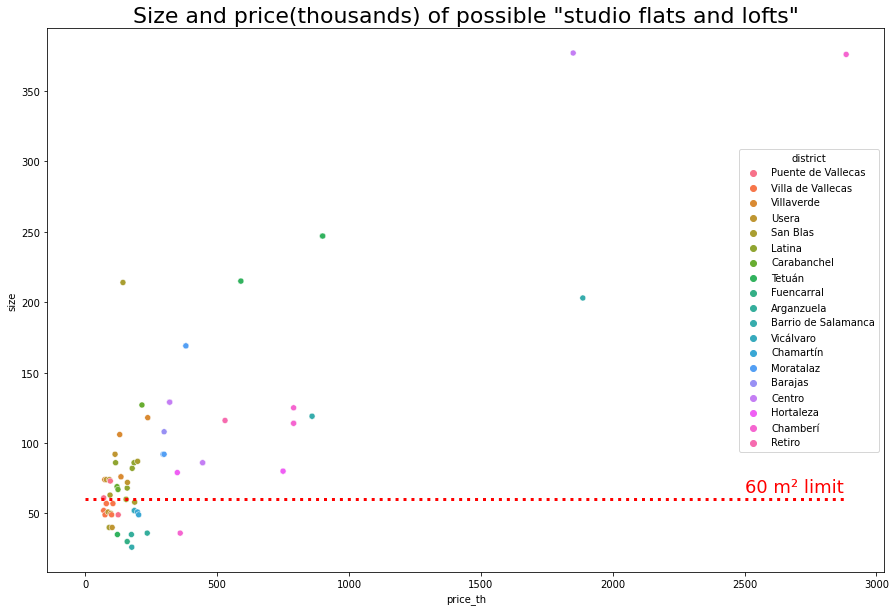

In [63]:
possible_studio_loft = df[(df['bathNumber']==0) & (df['roomNumber']==0)].sort_values('price').copy()
possible_studio_loft['price_th'] = possible_studio_loft['price']/1000
max_size_limit = np.array([[0,possible_studio_loft['price_th'].max()],[60,60]])

fig, ax = plt.subplots(1, 1, figsize=(15,10))
ax.set_title('Size and price(thousands) of possible "studio flats and lofts"', fontsize=22)
ax.plot(max_size_limit[0],max_size_limit[1],color='r', linestyle=':', linewidth=3)
ax.text(2500,65,"60 m² limit", fontsize=18, color='r')
sns.scatterplot(data=possible_studio_loft, x='price_th', y='size', hue='district', ax=ax);

The black dotted line marks the 60m2 limit. It's a completely arbitrary size limit above which it seems weird to us that a property can be defined as a studio but could be a loft.

Maybe the property title can tell us a bit more about the property type.

In [64]:
possible_studio_loft[['propertyType','title']]

,propertyType,title
32027,piso,Piso en venta en Sierra Meira
58105,piso,Estudio en venta en Villaverde a Vallecas
34769,piso,Estudio en venta en Villaverde a Vallecas
58078,piso,Piso en venta en Paterna
58090,piso,Planta baja en venta en Villaverde a Vallecas
...,...,...
75165,piso,Piso en venta en Orense
26587,piso,Piso en venta en Orense
12767,piso,"piso en venta en calle de sagasta, 20"
41983,piso,Piso en venta


Let's create a new feature for a more specific property type

In [65]:
df['propertyType_lvl2'] = np.nan
df.loc[df['title'].str.contains(r'loft|Loft'),'propertyType_lvl2'] = 'loft'
df.loc[df['title'].str.contains(r'Dúplex|dúplex|duplex|Duplex'),'propertyType_lvl2'] = 'duplex'
df.loc[df['title'].str.contains(r'estudio|Estudio'),'propertyType_lvl2'] = 'studio'

Let's also performe a sanity check

In [66]:
df.loc[df['title'].str.lower().str.match('^casa|chalet|villa\s+') & (df['propertyType']=='piso')]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2
577,163655014,piso,"Casa adosada en venta en Calle de la Colina, 23",435000,60,0,3,1,0,0,1,0,1,0,1,no info - heating,0,Moncloa,fotocasa,NaN
1024,163375893,piso,"Casa adosada en venta en Calle de la Rioja, 61",1200000,334,1,5,3,1,1,1,0,1,0,1,Gas natural,0,Barajas,fotocasa,NaN
1461,164887882,piso,Casa o chalet en venta,1400000,336,1,6,5,1,1,1,0,1,0,1,no info - heating,0,Hortaleza,fotocasa,NaN
1813,160701848,piso,Casa adosada en venta,1800000,634,1,7,6,1,1,1,0,1,0,1,Gas natural,0,Hortaleza,fotocasa,NaN
2026,163655101,piso,Casa adosada en venta en Calle de la Ribera de...,935000,170,0,3,2,0,1,1,0,1,0,1,Gas natural,0,Moncloa,fotocasa,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75036,165273275,piso,Casa o chalet en venta en Calle de Septiembre,629000,640,0,6,0,0,0,0,0,1,0,1,no info - heating,0,San Blas,fotocasa,NaN
75083,165312310,piso,Casa adosada en venta en Calle Gómeznarro,245000,80,0,2,2,0,0,0,0,0,1,1,no info - heating,0,Hortaleza,fotocasa,NaN
75086,164909632,piso,Casa o chalet en venta,121000,52,0,2,1,0,1,0,0,1,0,1,Electricidad,3,Puente de Vallecas,fotocasa,NaN
75127,162530735,piso,"Casa adosada en venta en Calle Saturno, 62",460000,214,1,8,2,0,1,1,0,1,0,1,Gas natural,0,Barajas,fotocasa,NaN


In [67]:
df.loc[df['title'].str.lower().str.match('^casa|chalet|villa\s+') & (df['propertyType']=='piso'),'propertyType'] = 'chalet'

In [68]:
df.loc[df['title'].str.lower().str.match('^piso|apartamento\s+') & (df['propertyType']!='piso')]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2


In [69]:
df['propertyType_lvl2'] = df['propertyType_lvl2'].fillna(df['propertyType'])

In [70]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,25927.0,592791.482817,754790.696818,11900.0,183300.0,335000.0,695000.0,13000000.0
size,25927.0,125.719366,129.568628,15.0,64.0,90.0,135.0,2400.0
hasParking,25927.0,0.280248,0.449129,0.0,0.0,0.0,1.0,1.0
roomNumber,25927.0,2.748640,1.428230,0.0,2.0,3.0,3.0,25.0
bathNumber,25927.0,1.861727,1.235005,0.0,1.0,2.0,2.0,21.0
hasSwimmingPool,25927.0,0.163536,0.369861,0.0,0.0,0.0,0.0,1.0
hasTerrace,25927.0,0.362981,0.480869,0.0,0.0,0.0,1.0,1.0
hasGarden,25927.0,0.164963,0.371154,0.0,0.0,0.0,0.0,1.0
hasLift,25927.0,0.662205,0.472967,0.0,0.0,1.0,1.0,1.0
isGoodCondition,25927.0,0.828981,0.376533,0.0,1.0,1.0,1.0,1.0


In [71]:
df = df.reset_index(drop=True)

Let's create the price per square meter (price_m2) feature. Of course it will not be used in the model but it will definetly be useful to analyse the dataset

In [72]:
df['price_m2'] = (df['price'] / df['size']).round(2)

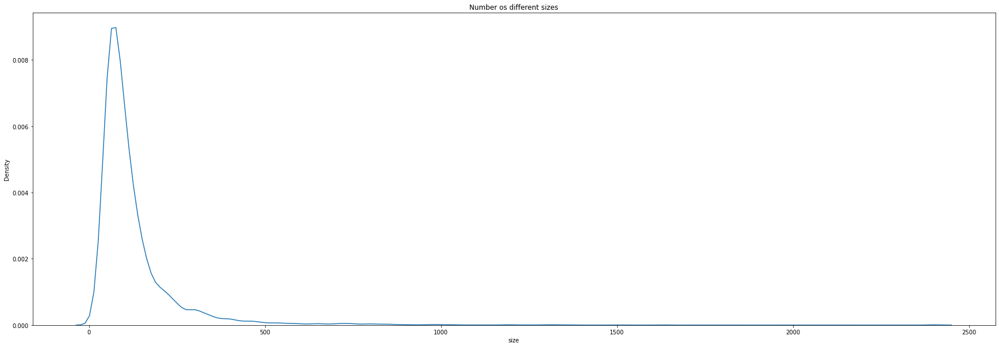

In [73]:
fig, ax = plt.subplots(1,1,figsize = (30,10))
ax.set_title('Number os different sizes' )
sns.kdeplot(data=df, x="size",ax=ax);

In [74]:
df[df['size'] < 20]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2
2247,97173611,piso,"piso en venta en urb. c/ tesoro, malasaña-univ...",144800,18,0,1,1,0,0,...,0,1,0,0,no info - heating,2,Centro,idealista,piso,8044.44
6440,98533789,piso,estudio en venta en calle de emilio carrere,149900,19,0,0,1,0,0,...,1,1,0,0,Eléctrica,entre,Chamberí,idealista,studio,7889.47
6576,97387321,piso,estudio en venta en calle de las islas cíes,100000,18,0,0,1,0,0,...,1,1,0,0,no info - heating,0,Fuencarral,idealista,studio,5555.56
7064,98139740,piso,estudio en venta en cuesta de santo domingo,140000,19,0,0,1,0,0,...,1,1,0,0,no info - heating,5,Centro,idealista,studio,7368.42
10791,98103321,piso,estudio en venta en sanz raso,55000,15,0,0,1,0,0,...,0,1,0,0,No dispone de calefacción,0,Puente de Vallecas,idealista,studio,3666.67
11369,93983245,piso,estudio en venta en lavapiés-embajadores,140000,18,0,0,1,0,0,...,0,1,0,0,Eléctrica,1,Centro,idealista,studio,7777.78
14124,98242252,piso,piso en venta en calle de los irlandeses,95000,19,0,1,1,0,0,...,0,0,1,0,No dispone de calefacción,0,Centro,idealista,piso,5000.00
14921,94194397,piso,"piso en venta en calle de rodas, 10",140000,18,0,1,1,0,0,...,0,0,1,0,no info - heating,1,Centro,idealista,piso,7777.78
21522,164590809,piso,Piso en venta en Calle de Oviedo,33000,15,0,1,1,0,0,...,0,1,0,1,no info - heating,3,Tetuán,fotocasa,piso,2200.00
23356,165272192,piso,Piso en venta en Calle de Oviedo,32000,15,0,1,1,0,0,...,0,1,0,1,no info - heating,3,Tetuán,fotocasa,piso,2133.33


## **Visualization & Analysis**

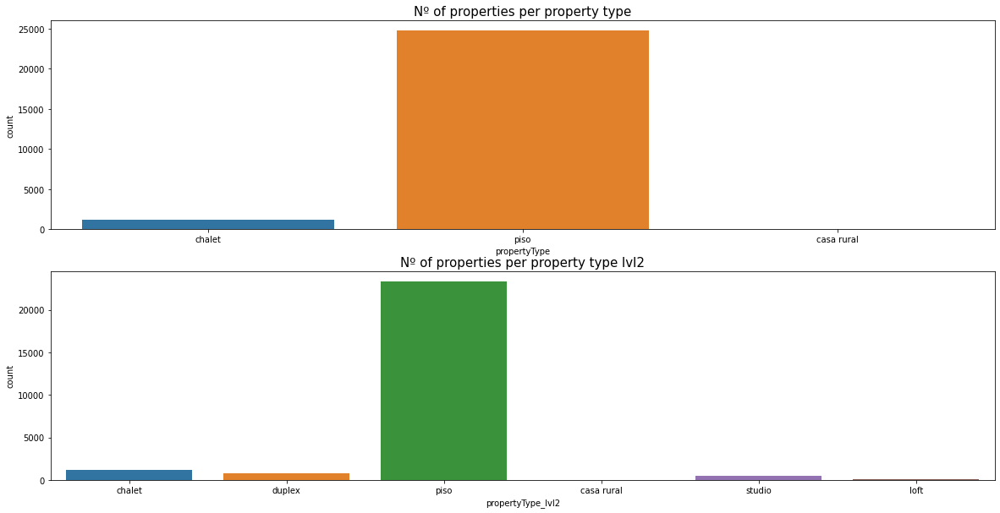

In [75]:
fig, axs = plt.subplots(2,1,figsize = (20,10))
axs[0].set_title('Nº of properties per property type',fontsize=15)
sns.countplot(data=df.sort_values('price', ascending=False), x="propertyType",ax=axs[0])
axs[1].set_title('Nº of properties per property type lvl2',fontsize=15)
sns.countplot(data=df.sort_values('price', ascending=False), x="propertyType_lvl2",ax=axs[1]);

We still cannot be sure that properties above 60 m² and not qualified as lofts are really lofts and not just properties submitted wrongly. The safest countermeasure is to drop them.

In [76]:
df[(df['propertyType']!='piso') & ((df['bathNumber']==0) | (df['roomNumber']==0))]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2
11582,93683829,chalet,casa o chalet independiente en venta en montec...,1300000,290,0,1,0,0,0,...,0,0,1,0,No dispone de calefacción,doesnotapply,Fuencarral,idealista,chalet,4482.76
16960,163114939,chalet,Casa adosada en venta en Calle del Estrecho de...,750000,80,1,0,0,0,0,...,0,0,1,1,no info - heating,0,Hortaleza,fotocasa,chalet,9375.00
18486,163114939,chalet,Casa adosada en venta en Calle del Estrecho de...,750000,80,1,0,0,0,0,...,0,0,1,1,no info - heating,0,Hortaleza,fotocasa,chalet,9375.00
18992,165200343,chalet,"Casa o chalet en venta en Calle Teruel, 18 - 3? E",74788,72,0,0,1,0,0,...,0,1,0,1,no info - heating,0,Retiro,fotocasa,chalet,1038.72
22540,163114939,chalet,Casa adosada en venta en Calle del Estrecho de...,750000,80,1,0,0,0,0,...,0,0,1,1,no info - heating,0,Hortaleza,fotocasa,chalet,9375.00
23788,165273275,chalet,Casa o chalet en venta en Calle de Septiembre,630000,640,0,6,0,0,0,...,0,1,0,1,no info - heating,0,San Blas,fotocasa,chalet,984.38
25825,165273275,chalet,Casa o chalet en venta en Calle de Septiembre,629000,640,0,6,0,0,0,...,0,1,0,1,no info - heating,0,San Blas,fotocasa,chalet,982.81


Surely houses must have at leas 1 bathroom and 1 bedroom

In [77]:
df = df.drop(df[(df['propertyType']!='piso') & ((df['bathNumber']==0) | (df['roomNumber']==0))].index)

In [78]:
df = df.drop(df[(df['bathNumber']==0) & (df['roomNumber']==0) & (df['size']>60)].index)

### **Cleaning duplicates**

Furthermore, since we are talking about Madrid municipality, it is weird to see that there are country houses in the dataset. We should take a look

In [79]:
df[df['propertyType']=='casa rural']

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2
8685,85925002,casa rural,finca rústica en venta en tiro a pichon,1600000,450,1,5,3,1,1,...,0,0,1,0,no info - heating,doesnotapply,Fuencarral,idealista,casa rural,3555.56
10056,37872723,casa rural,finca rústica en venta en el pardo,1600000,450,0,5,3,1,1,...,0,0,1,0,no info - heating,doesnotapply,Fuencarral,idealista,casa rural,3555.56


The data is suspiciously similar. These 2 records might belong to the same house being uploaded to Idealista by 2 different real estate agencies.

There might be more cases like this: properties of the same property type, price, size, and district being duplicated. Let's check it out.

In [80]:
checking_duplicated_properties = df.groupby(['propertyType','price','size','district','dataset'])['id'].apply(list).reset_index()
checking_duplicated_properties['id_count'] = checking_duplicated_properties['id'].apply(len)
checking_duplicated_properties = checking_duplicated_properties[checking_duplicated_properties['id_count']>1].sort_values('id_count',ascending=False)
checking_duplicated_properties

,propertyType,price,size,district,dataset,id,id_count
6003,piso,191000,106,San Blas,fotocasa,"[164934339, 164889707, 164881116, 164929452, 1...",36
16569,piso,889000,111,Barrio de Salamanca,idealista,"[97324554, 97418278, 98377390, 98061525, 97199...",32
12138,piso,415000,35,Barrio de Salamanca,fotocasa,"[163685133, 163707665, 163708273, 163643002, 1...",29
16409,piso,859000,166,Centro,idealista,"[97329096, 91582296, 94891392, 95931107, 96776...",26
16401,piso,859000,115,Centro,idealista,"[97672768, 98094650, 97639117, 98106782, 97626...",26
...,...,...,...,...,...,...,...
7092,piso,220000,80,San Blas,idealista,"[98346887, 97920135]",2
7097,piso,220000,81,Tetuán,fotocasa,"[164247723, 164247723]",2
7108,piso,220000,88,San Blas,fotocasa,"[165091375, 165091375]",2
7116,piso,220000,95,Latina,fotocasa,"[164175716, 164175716]",2


In [81]:
print(f"Dataset would be reduced by {checking_duplicated_properties[checking_duplicated_properties['dataset'] == 'fotocasa']['id_count'].sum() - checking_duplicated_properties[checking_duplicated_properties['dataset'] == 'fotocasa'].shape[0]} records from Fotocasa.")
print(f"Dataset would be reduced by {checking_duplicated_properties[checking_duplicated_properties['dataset'] == 'idealista']['id_count'].sum() - checking_duplicated_properties[checking_duplicated_properties['dataset'] == 'idealista'].shape[0]} records from Idealista.")
print(f"Dataset would be reduced by {checking_duplicated_properties['id_count'].sum() - checking_duplicated_properties.shape[0]} total records")

Dataset would be reduced by 3657 records from Fotocasa.
Dataset would be reduced by 3077 records from Idealista.
Dataset would be reduced by 6734 total records


For each property, we will keep the most complete record which will be the one with more characteristics

In [82]:
cols_to_sum = [col for col,dtype in df.dtypes.items() if dtype == 'int64' and col not in ['price','size']]

df['temp_score'] = df[cols_to_sum].sum(axis=1) + (df['heatingType']!='no info - heating').astype(int)
df['temp_score']

0        12
1         5
2         5
3         5
4         7
         ..
25922    11
25923     7
25924    10
25925     6
25926     6
Name: temp_score, Length: 25872, dtype: int64

In [83]:
df.sort_values('temp_score',ascending=False)

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
15838,94314377,piso,piso en venta en chueca-justicia,2590000,350,0,25,17,0,0,...,1,0,0,no info - heating,1,Centro,idealista,piso,7400.00,44
16246,97831813,chalet,chalet adosado en venta en el viso,7800000,882,0,18,14,1,1,...,1,0,0,no info - heating,doesnotapply,Chamartín,idealista,chalet,8843.54,36
3392,97460745,chalet,chalet adosado en venta en calle del tambre,7800000,882,0,18,14,1,1,...,1,0,0,no info - heating,doesnotapply,Chamartín,idealista,chalet,8843.54,35
13678,88980097,piso,piso en venta en sol,2300000,443,0,16,16,0,0,...,0,1,0,no info - heating,2,Centro,idealista,piso,5191.87,33
2406,98054975,chalet,casa o chalet independiente en venta en avenid...,13000000,1200,1,16,11,0,1,...,1,0,0,Gas natural,doesnotapply,Fuencarral,idealista,chalet,10833.33,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,97892805,piso,"estudio en venta en calle de trafalgar, 12",200000,38,0,0,1,0,0,...,1,0,0,no info - heating,0,Chamberí,idealista,studio,5263.16,2
4138,98079332,piso,estudio en venta en calle antimonio,94990,29,0,0,1,0,0,...,1,0,0,no info - heating,0,Villaverde,idealista,studio,3275.52,2
4691,27278996,piso,"estudio en venta en calle bustillo del oro, 16",105000,35,0,0,1,0,0,...,1,0,0,no info - heating,1,Tetuán,idealista,studio,3000.00,2
14247,98949640,piso,estudio en venta en calle de rodas,108000,20,0,0,1,0,0,...,1,0,0,no info - heating,0,Centro,idealista,studio,5400.00,2


In [84]:
ids = df.sort_values('temp_score',ascending=False).groupby(['propertyType','price','size','district','dataset'])['id'].apply(list).reset_index()['id']
ids = ids[ids.apply(len)>1]
ids = ids.apply(lambda x: x[:1])
ids

0         [85925002]
4         [98473971]
8        [164909632]
10        [97295802]
18        [94697606]
            ...     
19096    [151825652]
19099     [93646252]
19103     [98019412]
19117     [97972352]
19118     [94066219]
Name: id, Length: 3847, dtype: object

In [85]:
ids_index_list = ids.index.tolist()

In [86]:
df_best_temp_score = df[df.index.isin(ids_index_list)]
df_best_temp_score

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
0,98255270,piso,piso en venta en avenida del general perón,995000,179,0,4,5,0,0,...,1,0,0,Gas natural,1,Tetuán,idealista,piso,5558.66,12
4,97611862,piso,"piso en venta en calle de la povedilla, 4",574300,94,0,4,1,0,0,...,1,0,0,no info - heating,4,Barrio de Salamanca,idealista,piso,6109.57,7
8,96748272,piso,"piso en venta en calle de mayorazgo de duarte, 21",329000,95,1,2,2,1,1,...,1,0,0,Gas,0,Vicálvaro,idealista,piso,3463.16,11
10,97429011,piso,piso en venta en calle de ayala,889000,95,0,3,3,0,1,...,1,0,0,no info - heating,1,Barrio de Salamanca,idealista,piso,9357.89,9
18,98333010,piso,piso en venta en bernabéu-hispanoamérica,760000,130,0,3,2,0,1,...,0,1,0,no info - heating,14,Chamartín,idealista,piso,5846.15,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19096,164472437,piso,"Piso en venta en Calle el Rompedizo, 22",179500,84,1,2,1,0,0,...,1,0,1,no info - heating,0,Retiro,fotocasa,piso,2136.90,6
19099,164246339,piso,"Piso en venta en Calle de la Tacona, 35",260000,115,0,3,1,0,1,...,1,0,1,Gas natural,6,Moratalaz,fotocasa,piso,2260.87,9
19103,163851701,piso,"Piso en venta en Calle Rafael Finat, 73",136000,64,0,3,1,0,0,...,0,1,1,no info - heating,0,Latina,fotocasa,piso,2125.00,6
19117,161055464,piso,"Piso en venta en Calle de Lagasca, 68",757200,96,0,2,2,0,0,...,1,0,1,Gas natural,8,Barrio de Salamanca,fotocasa,piso,7887.50,8


In [87]:
temp = df.sort_values('temp_score',ascending=False).groupby(['propertyType','price','size','district','dataset'])['id'].apply(list).reset_index()
temp

,propertyType,price,size,district,dataset,id
0,casa rural,1600000,450,Fuencarral,idealista,"[85925002, 37872723]"
1,chalet,22000,120,Usera,fotocasa,[165001501]
2,chalet,61000,82,Puente de Vallecas,idealista,[96322586]
3,chalet,75000,33,Tetuán,idealista,[98408053]
4,chalet,75000,37,Tetuán,idealista,"[98473971, 98416062]"
...,...,...,...,...,...,...
19133,piso,9600000,712,Barrio de Salamanca,idealista,[96078409]
19134,piso,10000000,850,Retiro,idealista,[98305405]
19135,piso,11000000,600,Barrio de Salamanca,idealista,[97635664]
19136,piso,11200000,735,Barrio de Salamanca,idealista,[92113428]


In [88]:
# Backup de df
df_backup = df.copy()

In [89]:
#df_temp_score = df.copy()
def duplicate_properties_drop(ids):
  temp_df = df[df['id'].isin(ids)]

  try:
    max_score = max(temp_df['temp_score'])
    index_list = temp_df.index.tolist()
    best_index = int(*temp_df[temp_df['temp_score'] == max_score].head(1).index.tolist())

    index_list.remove(best_index)

    df.drop(index_list, inplace = True)
  except:
    print(f'Índices vacíos {temp_df.index} para los ids {ids}')
  

  return None

checking_duplicated_properties['id'].apply(lambda x: duplicate_properties_drop(x));

Índices vacíos Int64Index([], dtype='int64') para los ids ['157683594', '163213235', '157683594']
Índices vacíos Int64Index([], dtype='int64') para los ids ['164719428', '164764938', '164719428']
Índices vacíos Int64Index([], dtype='int64') para los ids ['164913142', '164913142']
Índices vacíos Int64Index([], dtype='int64') para los ids ['164501484', '164501484']
Índices vacíos Int64Index([], dtype='int64') para los ids ['164636773', '164636773']
Índices vacíos Int64Index([], dtype='int64') para los ids ['165116725', '165116725']


In [90]:
df_backup.shape

(25872, 22)

In [91]:
df.shape

(18862, 22)

In [92]:
checking_duplicated_properties2 = df.groupby(['propertyType','price','size','district','dataset'])['id'].apply(list).reset_index()
checking_duplicated_properties2['id_count'] = checking_duplicated_properties2['id'].apply(len)
checking_duplicated_properties2 = checking_duplicated_properties2[checking_duplicated_properties2['id_count']>1].sort_values('id_count',ascending=False)
checking_duplicated_properties2

,propertyType,price,size,district,dataset,id,id_count


Back at the propertyType distribution, we see that the majority of the properties are flats. Let's see if this has an influence on the price.

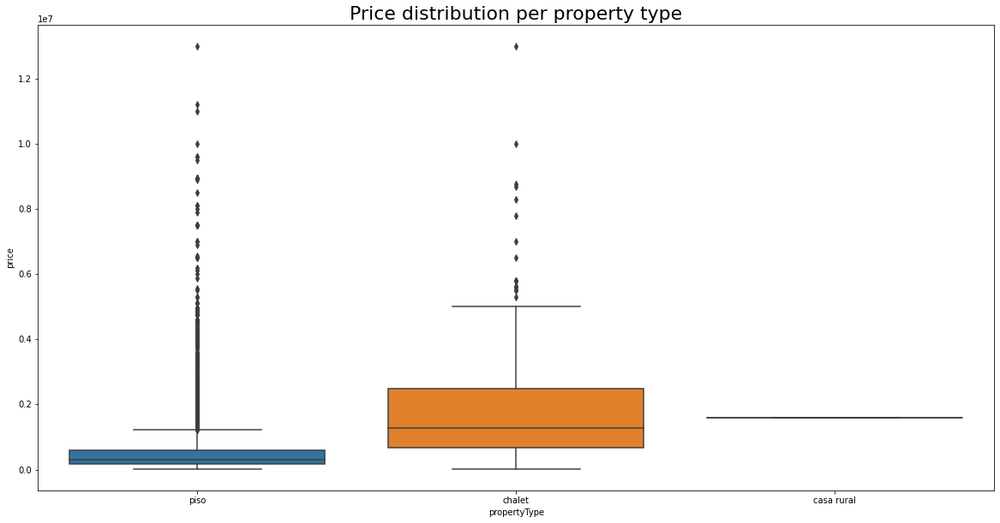

In [93]:
fig, ax = plt.subplots(1,1,figsize=(20,10))
ax.set_title('Price distribution per property type',fontsize=22)
sns.boxplot(data=df.sort_values('price', ascending=False), x="propertyType",y='price',ax=ax);

Let's see if there is any correlation among the different features

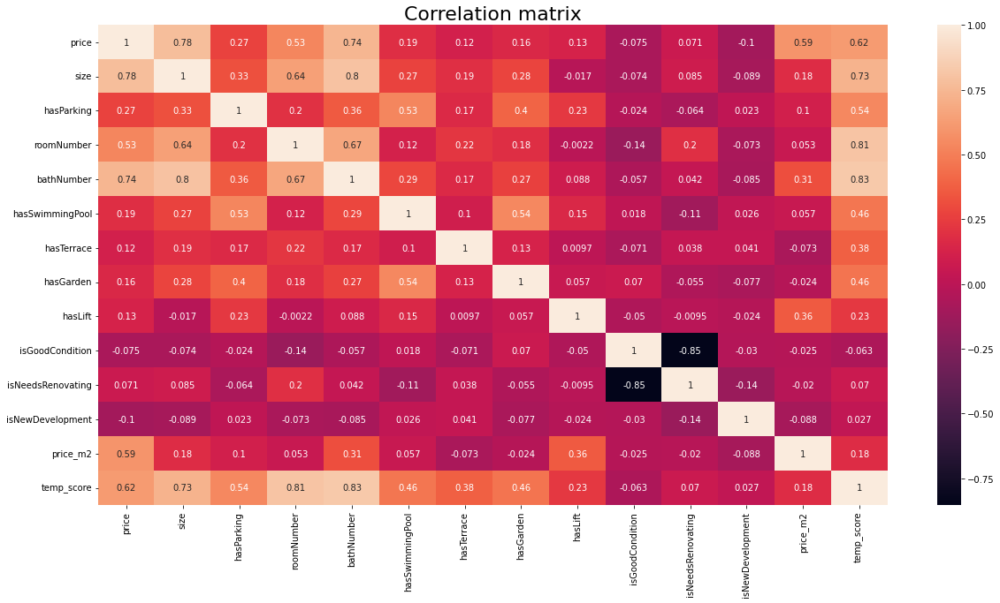

In [94]:
fig, ax = plt.subplots(1,1,figsize=(20,10))
ax.set_title('Correlation matrix',fontsize=22)
sns.heatmap(df.corr(),annot=True, ax=ax);

Needless to say there is correlation between price and size but also among size, roomNumber and bathNumber which might imply and intercorrelation.

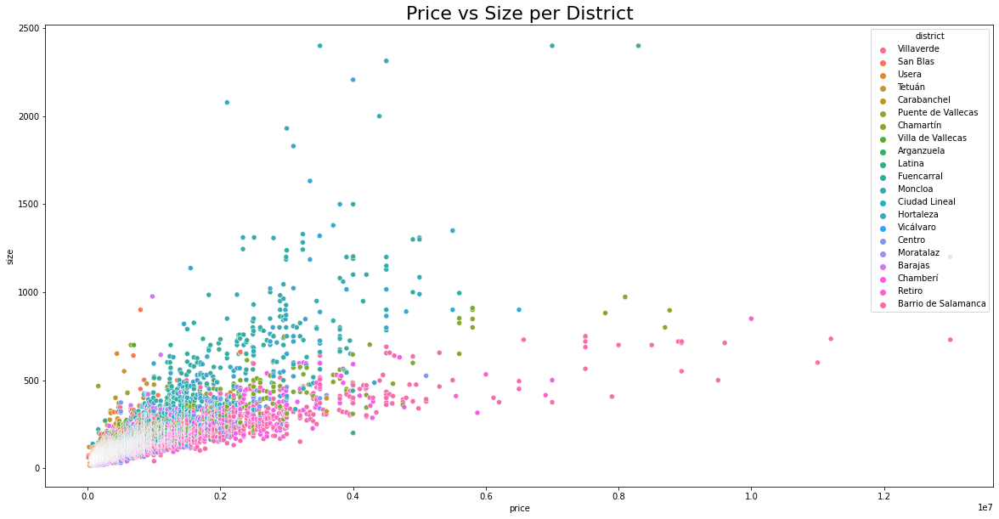

In [95]:
fig, ax = plt.subplots(1, 1, figsize = (20,10))
ax.set_title('Price vs Size per District',fontsize=22)
sns.scatterplot(data=df.sort_values('price', ascending=True), x='price', y='size', hue='district', ax=ax);

It appears to be a trade-off between size and price, which might be determined by the district that the property belongs to. We need to investigate more to know that for sure

Analyzing the district is a little bit more tricky. Let's see if there is a correlation between the district and the price

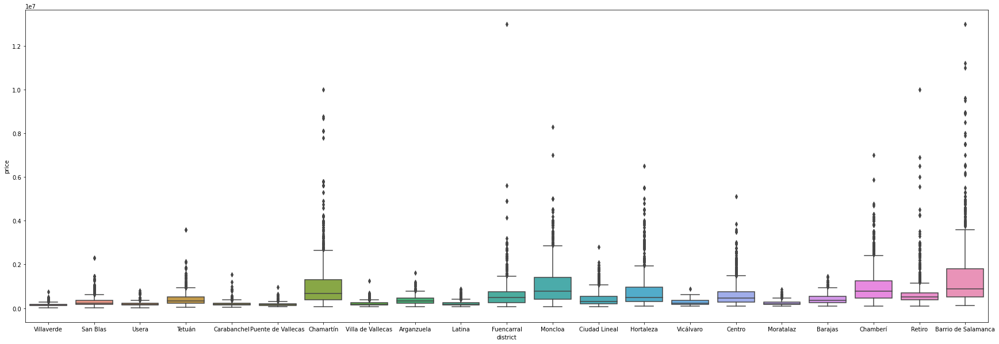

In [96]:
fig, ax = plt.subplots(1,1,figsize = (30,10))
sns.boxplot(data=df.sort_values('price',ascending=True), y='price',x='district',ax=ax);

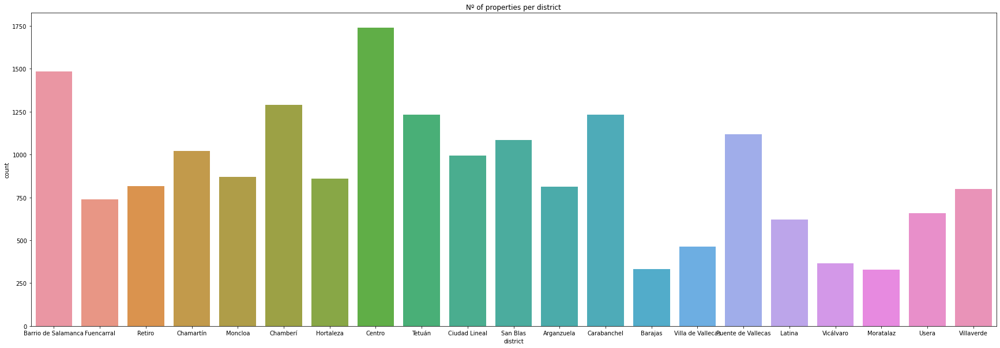

In [97]:
fig, ax = plt.subplots(1,1,figsize = (30,10))
ax.set_title('Nº of properties per district' )
sns.countplot(data=df.sort_values('price', ascending=False), x="district",ax=ax);

### Cleaning outliers

In [98]:
# https://becominghuman.ai/outlier-detection-in-real-estate-data-4e7375e2c8ba
# Echar un vistazo a la librería pyOD https://www.analyticsvidhya.com/blog/2019/02/outlier-detection-python-pyod/

In [99]:
df.corr()["price"].sort_values(ascending = False)

price                1.000000
size                 0.781634
bathNumber           0.742277
temp_score           0.622365
price_m2             0.591844
roomNumber           0.530119
hasParking           0.273073
hasSwimmingPool      0.185869
hasGarden            0.159455
hasLift              0.130150
hasTerrace           0.115776
isNeedsRenovating    0.070571
isGoodCondition     -0.075117
isNewDevelopment    -0.102631
Name: price, dtype: float64

In [100]:
df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns

Index(['propertyType', 'size', 'hasParking', 'roomNumber', 'bathNumber',
       'hasSwimmingPool', 'hasTerrace', 'hasGarden', 'hasLift',
       'isGoodCondition', 'isNeedsRenovating', 'isNewDevelopment',
       'heatingType', 'floor', 'district', 'propertyType_lvl2'],
      dtype='object')

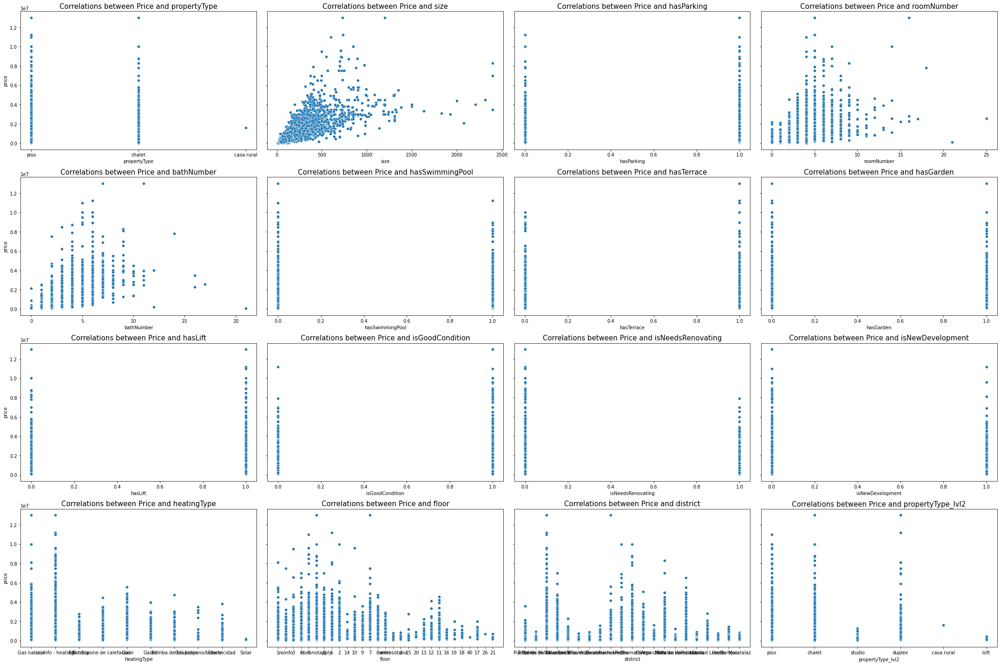

In [101]:
fig, axes = plt.subplots(4,4,figsize = (30,20), sharey=True)
fig.subplots_adjust(bottom=0.1)

for p, ax in enumerate(axes.flat):
  column = list(df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"Correlations between Price and {column}",fontsize=15) 
  sns.scatterplot(data=df, x=column, y='price',ax=ax)
  plt.tight_layout()

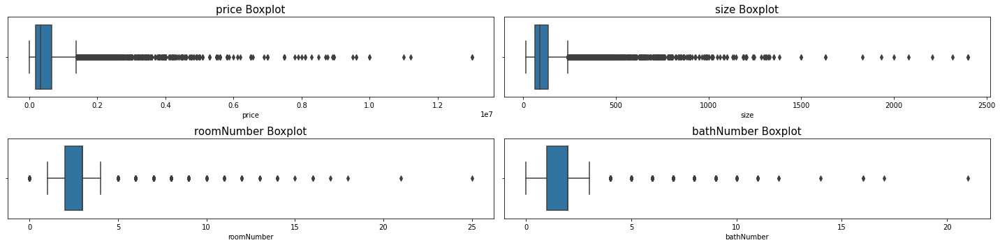

In [102]:
fig, axes = plt.subplots(2,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size','roomNumber','bathNumber']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"{column} Boxplot",fontsize=15) 
  sns.boxplot(x=df[column],ax=ax);
  plt.tight_layout()

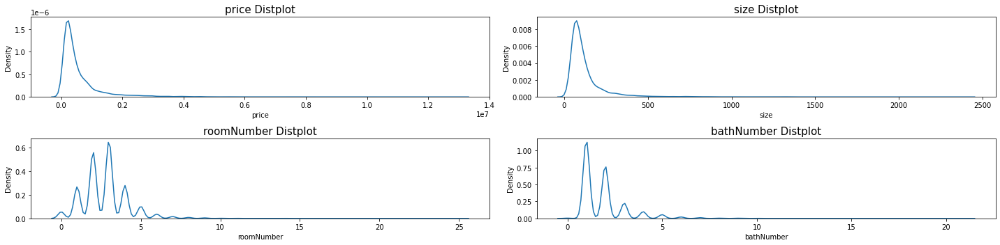

In [103]:
fig, axes = plt.subplots(2,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size','roomNumber','bathNumber']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"{column} Distplot",fontsize=15) 
  sns.kdeplot(x=df[column], ax=ax);
  plt.tight_layout()

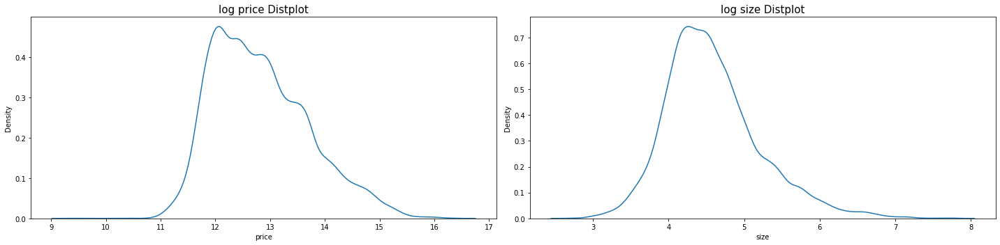

In [104]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df[column]), ax=ax);
  plt.tight_layout()

#### **IQR method**

In [105]:
def iqr_outliers(feature):
  q1 = np.percentile(feature,25,interpolation='midpoint')
  q3 = np.percentile(feature,75,interpolation='midpoint')

  iqr = q3-q1
  upper = q3+1.5*iqr
  lower = q1-1.5*iqr

  return {'upper_threshold': upper, 'lower_threshold': lower}

In [106]:
price_thresholds = iqr_outliers(df['price'])
size_thresholds = iqr_outliers(df['size'])
roomNumber_thresholds = iqr_outliers(df['roomNumber'])
bathNumber_thresholds = iqr_outliers(df['bathNumber'])

print(price_thresholds)
print(size_thresholds)
print(roomNumber_thresholds)
print(bathNumber_thresholds)

{'upper_threshold': 1385000.0, 'lower_threshold': -535000.0}
{'upper_threshold': 241.5, 'lower_threshold': -42.5}
{'upper_threshold': 4.5, 'lower_threshold': 0.5}
{'upper_threshold': 3.5, 'lower_threshold': -0.5}


In [107]:
len(df[(df['price'] >= price_thresholds['upper_threshold']) | (df['price'] <= price_thresholds['lower_threshold'])])

1718

In [108]:
len(df[(df['size'] >= size_thresholds['upper_threshold']) | (df['size'] <= size_thresholds['lower_threshold'])])

1687

In [109]:
len(df[(df['roomNumber'] >= roomNumber_thresholds['upper_threshold']) | (df['roomNumber'] <= roomNumber_thresholds['lower_threshold'])])

2136

In [110]:
len(df[(df['bathNumber'] >= bathNumber_thresholds['upper_threshold']) | (df['bathNumber'] <= bathNumber_thresholds['lower_threshold'])])

1569

In [111]:
df.shape

(18862, 22)

In [112]:
df_clean = df[((df['price'] < price_thresholds['upper_threshold']) & (df['price'] > price_thresholds['lower_threshold'])) & ((df['size'] < size_thresholds['upper_threshold']) & (df['size'] > size_thresholds['lower_threshold'])) & ((df['roomNumber'] < roomNumber_thresholds['upper_threshold']) & (df['roomNumber'] > roomNumber_thresholds['lower_threshold'])) & ((df['bathNumber'] < bathNumber_thresholds['upper_threshold']) & (df['bathNumber'] > bathNumber_thresholds['lower_threshold']))]
df_clean.shape

(15474, 22)

In [113]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
price,15474.0,364474.755008,254120.213933,11900.00,175000.000,280000.0,475000.0000,1380000.00
size,15474.0,90.262505,38.693041,15.00,62.000,82.0,111.0000,240.00
hasParking,15474.0,0.261083,0.439239,0.00,0.000,0.0,1.0000,1.00
roomNumber,15474.0,2.464198,0.909200,1.00,2.000,3.0,3.0000,4.00
bathNumber,15474.0,1.495670,0.616047,0.00,1.000,1.0,2.0000,3.00
hasSwimmingPool,15474.0,0.152708,0.359717,0.00,0.000,0.0,0.0000,1.00
hasTerrace,15474.0,0.362414,0.480713,0.00,0.000,0.0,1.0000,1.00
hasGarden,15474.0,0.159364,0.366027,0.00,0.000,0.0,0.0000,1.00
hasLift,15474.0,0.670544,0.470031,0.00,0.000,1.0,1.0000,1.00
isGoodCondition,15474.0,0.827776,0.377588,0.00,1.000,1.0,1.0000,1.00


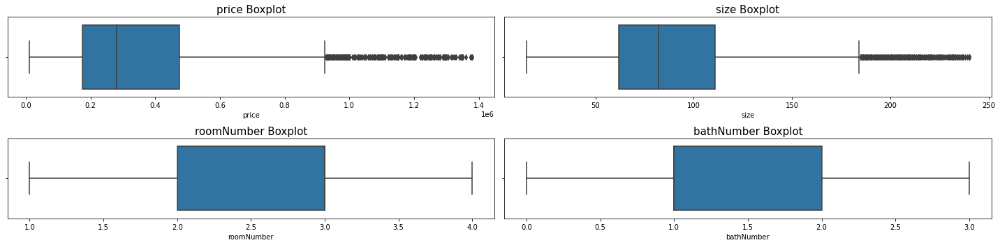

In [114]:
fig, axes = plt.subplots(2,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size','roomNumber','bathNumber']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"{column} Boxplot",fontsize=15) 
  sns.boxplot(x=df_clean[column],ax=ax);
  plt.tight_layout()

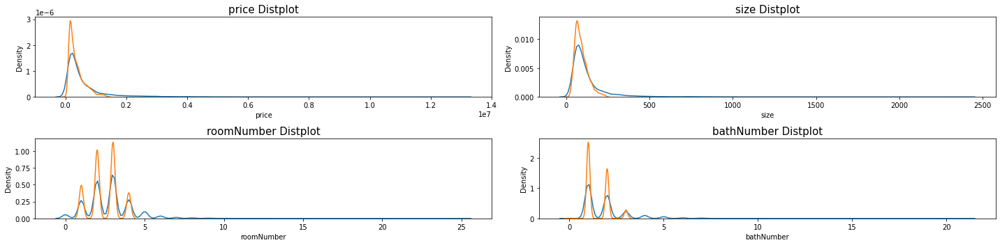

In [115]:
fig, axes = plt.subplots(2,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size','roomNumber','bathNumber']].columns)[p]
  ax.set_title(f"{column} Distplot",fontsize=15) 
  sns.kdeplot(x=df[column], ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size','roomNumber','bathNumber']].columns)[p]
  ax.set_title(f"{column} Distplot",fontsize=15) 
  sns.kdeplot(x=df_clean[column], ax=ax);
  plt.tight_layout()

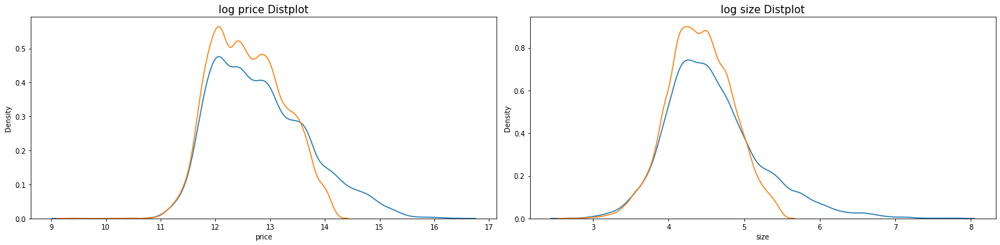

In [116]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df[column]), ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df_clean[column]), ax=ax);
  plt.tight_layout()

In [117]:
df_clean[['price','size','roomNumber','bathNumber']].describe().T

,count,mean,std,min,25%,50%,75%,max
price,15474.0,364474.755008,254120.213933,11900.0,175000.0,280000.0,475000.0,1380000.0
size,15474.0,90.262505,38.693041,15.0,62.0,82.0,111.0,240.0
roomNumber,15474.0,2.464198,0.909200,1.0,2.0,3.0,3.0,4.0
bathNumber,15474.0,1.495670,0.616047,0.0,1.0,1.0,2.0,3.0


In [118]:
#Segunda vuelta en precio y tamaño
price_thresholds = iqr_outliers(df_clean['price'])
size_thresholds = iqr_outliers(df_clean['size'])

print(price_thresholds)
print(size_thresholds)

{'upper_threshold': 925000.0, 'lower_threshold': -275000.0}
{'upper_threshold': 184.5, 'lower_threshold': -11.5}


In [119]:
df_clean = df_clean[((df_clean['price'] < price_thresholds['upper_threshold']) & (df_clean['price'] > price_thresholds['lower_threshold'])) & ((df_clean['size'] < size_thresholds['upper_threshold']) & (df_clean['size'] > size_thresholds['lower_threshold']))]
df_clean.shape

(14571, 22)

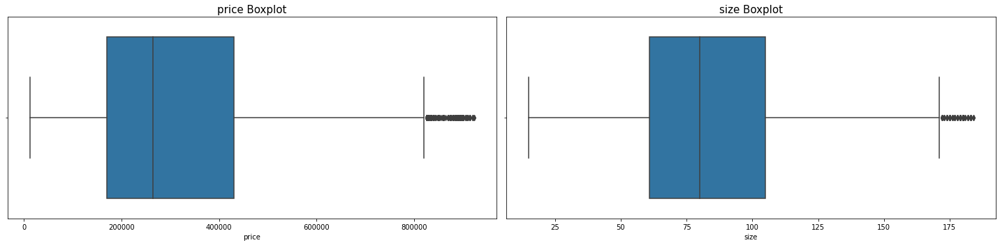

In [120]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"{column} Boxplot",fontsize=15) 
  sns.boxplot(x=df_clean[column],ax=ax);
  plt.tight_layout()

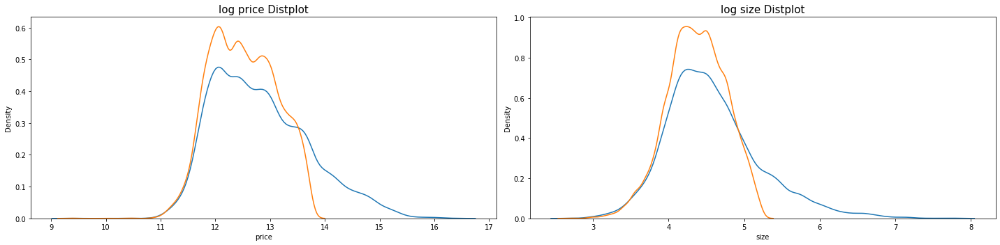

In [121]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df[column]), ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df_clean[column]), ax=ax);
  plt.tight_layout()

In [122]:
# Tercera vuelta
price_thresholds = iqr_outliers(df_clean['price'])
size_thresholds = iqr_outliers(df_clean['size'])

print(price_thresholds)
print(size_thresholds)

{'upper_threshold': 820150.0, 'lower_threshold': -220250.0}
{'upper_threshold': 171.0, 'lower_threshold': -5.0}


In [123]:
df_clean = df_clean[((df_clean['price'] < price_thresholds['upper_threshold']) & (df_clean['price'] > price_thresholds['lower_threshold'])) & ((df_clean['size'] < size_thresholds['upper_threshold']) & (df_clean['size'] > size_thresholds['lower_threshold']))]
df_clean.shape

(14130, 22)

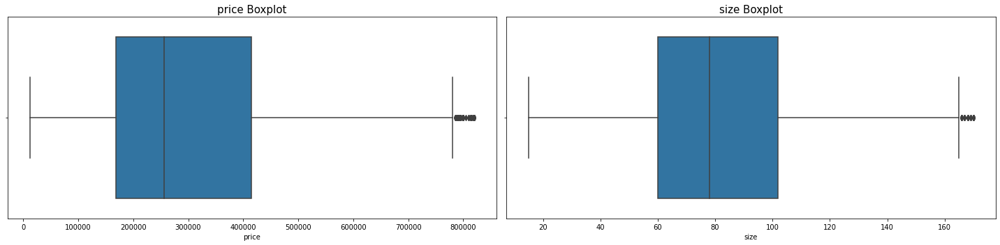

In [124]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"{column} Boxplot",fontsize=15) 
  sns.boxplot(x=df_clean[column],ax=ax);
  plt.tight_layout()

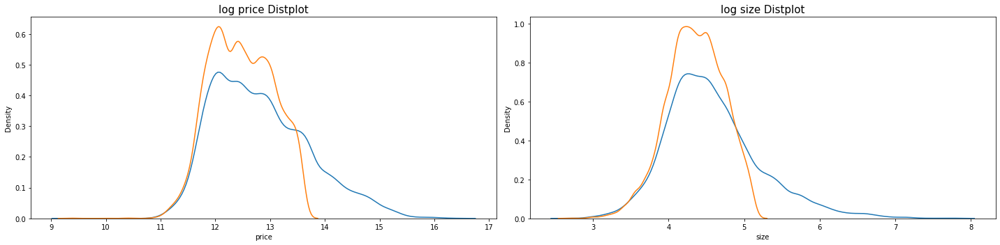

In [125]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df[column]), ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df_clean[column]), ax=ax);
  plt.tight_layout()

In [126]:
#df_clean = df_clean[df_clean['bathNumber'] > 0]

In [127]:
#df_clean[['price','size','roomNumber','bathNumber']].describe().T

In [128]:
#len(df_clean[df_clean['propertyType_lvl2'] == 'duplex'])

In [129]:
df_clean.corr()["price"].sort_values(ascending = False)

price                1.000000
price_m2             0.694530
size                 0.660772
bathNumber           0.571425
temp_score           0.488976
hasLift              0.457954
hasParking           0.303861
hasSwimmingPool      0.266355
roomNumber           0.259565
hasGarden            0.164516
hasTerrace           0.022169
isNeedsRenovating   -0.027512
isGoodCondition     -0.028994
isNewDevelopment    -0.063207
Name: price, dtype: float64

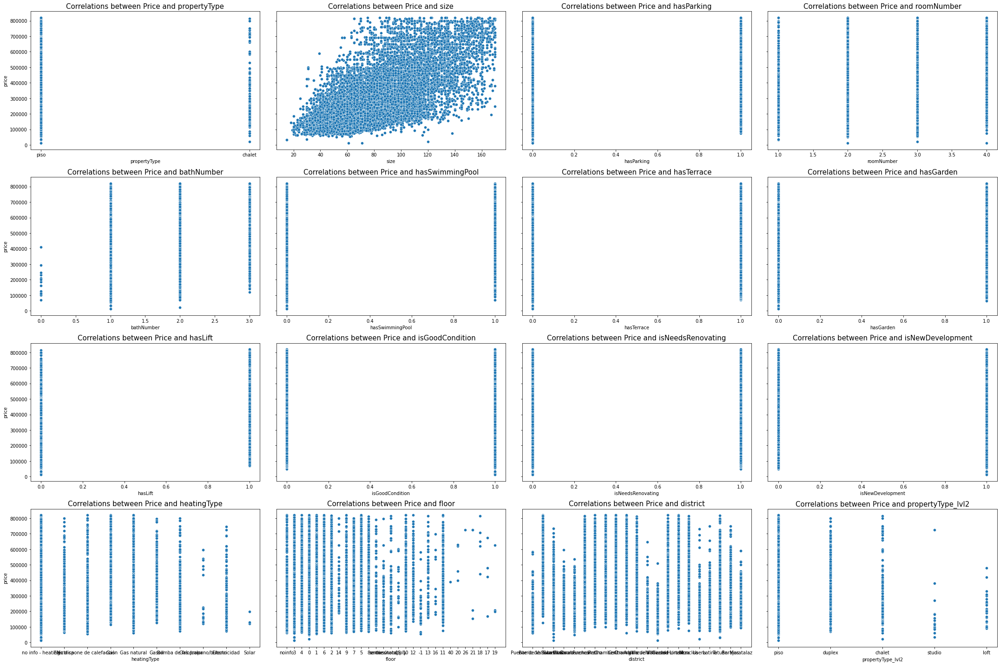

In [130]:
fig, axes = plt.subplots(4,4,figsize = (30,20), sharey=True)
fig.subplots_adjust(bottom=0.1)

for p, ax in enumerate(axes.flat):
  column = list(df_clean.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns)[p]
  ax.set_title(f"Correlations between Price and {column}",fontsize=15) 
  sns.scatterplot(data=df_clean, x=column, y='price',ax=ax)
  #  sns.scatterplot(data=df_clean[df_clean['propertyType_lvl2'] == 'piso'], x=column, y='price',ax=ax)
  plt.tight_layout()

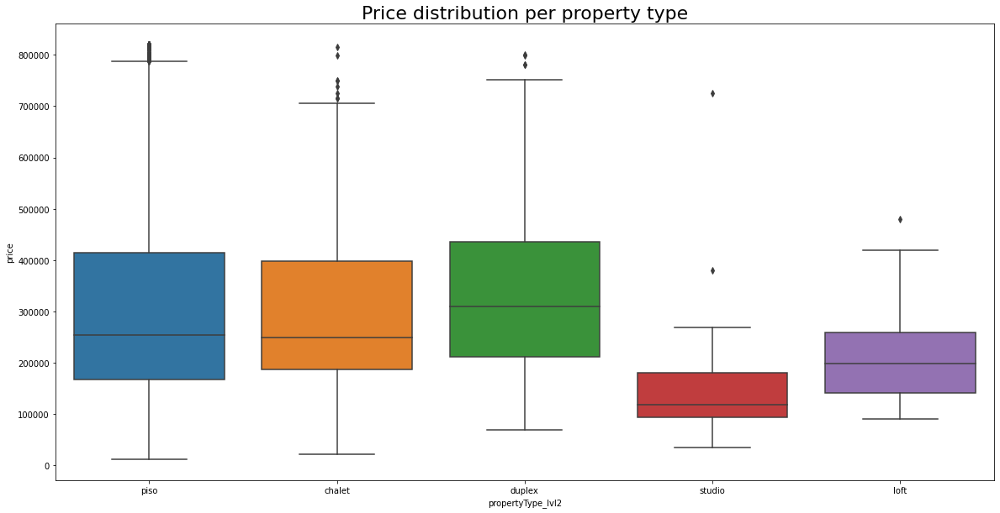

In [131]:
fig, ax = plt.subplots(1,1,figsize=(20,10))
ax.set_title('Price distribution per property type',fontsize=22)
sns.boxplot(data=df_clean.sort_values('price', ascending=False), x='propertyType_lvl2',y='price',ax=ax);

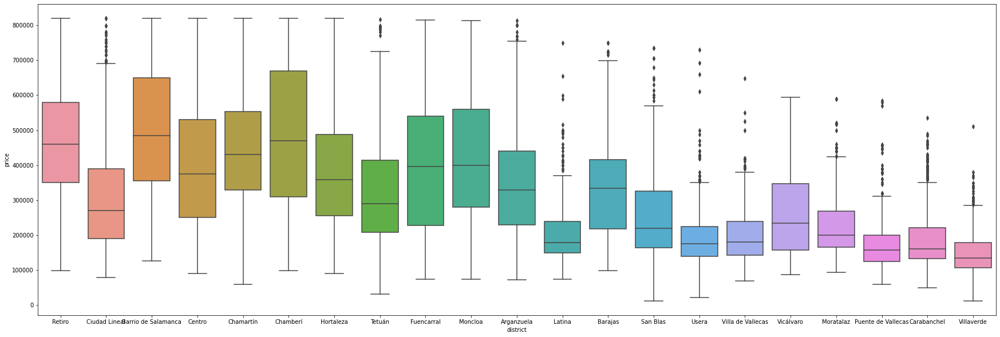

In [132]:
fig, ax = plt.subplots(1,1,figsize = (30,10))
sns.boxplot(data=df_clean.sort_values('price',ascending=False), y='price',x='district',ax=ax);

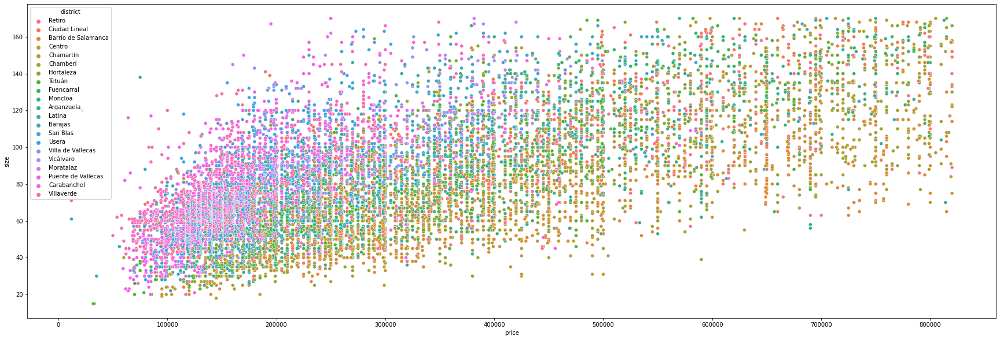

In [133]:
fig, ax = plt.subplots(1,1,figsize = (30,10))
sns.scatterplot(data=df_clean.sort_values('price', ascending=False), x='price', y='size',hue='district',ax=ax);

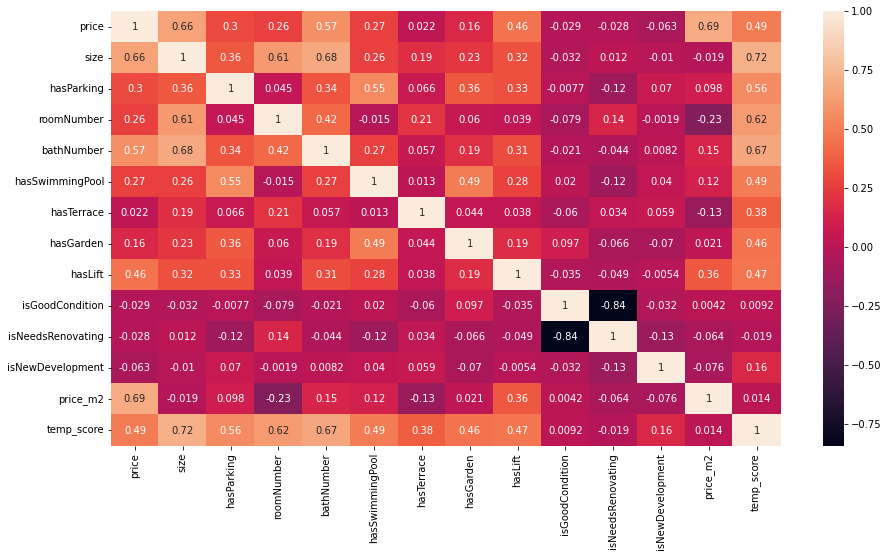

In [134]:
fig, ax = plt.subplots(1,1,figsize=(15,8))
sns.heatmap(df_clean.corr(),annot=True, ax=ax);

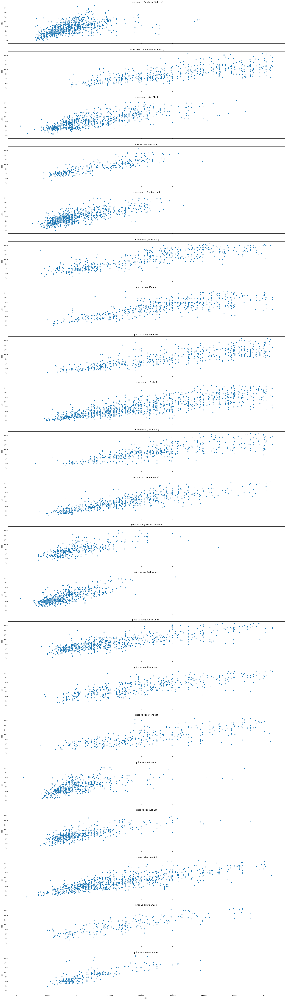

In [135]:
fig, axes = plt.subplots(len(df_clean['district'].unique()),1,figsize = (30,110), sharex=True, sharey=True)

for p, ax in enumerate(axes.flat):
  district_name = list(df_clean['district'].unique())[p]
  ax.set_title(f"price vs size ({district_name})")
  #ax.add_line()
  sns.scatterplot(data=df_clean[df_clean['district'] == district_name], x='price', y='size',ax=ax)

In [136]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14130.0,309460.881599,177675.482786,11900.00,168525.00,256750.00,415000.00,820000.00
size,14130.0,83.113022,30.254635,15.00,60.00,78.00,102.00,170.00
hasParking,14130.0,0.246568,0.431028,0.00,0.00,0.00,0.00,1.00
roomNumber,14130.0,2.399929,0.892597,1.00,2.00,2.00,3.00,4.00
bathNumber,14130.0,1.411111,0.548120,0.00,1.00,1.00,2.00,3.00
hasSwimmingPool,14130.0,0.146497,0.353616,0.00,0.00,0.00,0.00,1.00
hasTerrace,14130.0,0.354069,0.478247,0.00,0.00,0.00,1.00,1.00
hasGarden,14130.0,0.153928,0.360892,0.00,0.00,0.00,0.00,1.00
hasLift,14130.0,0.648266,0.477528,0.00,0.00,1.00,1.00,1.00
isGoodCondition,14130.0,0.833970,0.372120,0.00,1.00,1.00,1.00,1.00


## **Feature engineering**

In [137]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 700 kB/s 


In [138]:
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce
from sklearn.model_selection import train_test_split

#https://www.kaggle.com/code/subinium/11-categorical-encoders-and-benchmark
#https://towardsdatascience.com/how-catboost-encodes-categorical-variables-3866fb2ae640

In [139]:
df_clean.columns

Index(['id', 'propertyType', 'title', 'price', 'size', 'hasParking',
       'roomNumber', 'bathNumber', 'hasSwimmingPool', 'hasTerrace',
       'hasGarden', 'hasLift', 'isGoodCondition', 'isNeedsRenovating',
       'isNewDevelopment', 'heatingType', 'floor', 'district', 'dataset',
       'propertyType_lvl2', 'price_m2', 'temp_score'],
      dtype='object')

In [140]:
df_clean = df_clean.drop(['propertyType','title','dataset','temp_score','id','price_m2'],axis=1).reset_index(drop=True)

In [141]:
df_clean.columns

Index(['price', 'size', 'hasParking', 'roomNumber', 'bathNumber',
       'hasSwimmingPool', 'hasTerrace', 'hasGarden', 'hasLift',
       'isGoodCondition', 'isNeedsRenovating', 'isNewDevelopment',
       'heatingType', 'floor', 'district', 'propertyType_lvl2'],
      dtype='object')

In [142]:
df_clean.isna().any()

price                False
size                 False
hasParking           False
roomNumber           False
bathNumber           False
hasSwimmingPool      False
hasTerrace           False
hasGarden            False
hasLift              False
isGoodCondition      False
isNeedsRenovating    False
isNewDevelopment     False
heatingType          False
floor                False
district             False
propertyType_lvl2    False
dtype: bool

In [143]:
df_clean[df_clean['size'] < 35]

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,propertyType_lvl2
56,120000,24,0,1,1,0,0,0,0,0,1,0,no info - heating,0,Tetuán,piso
93,69999,26,0,1,1,0,0,0,0,1,0,0,no info - heating,semi-sótano,Tetuán,piso
99,82500,27,0,1,1,0,0,0,0,1,0,0,Bomba de frío/calor,3,Puente de Vallecas,piso
105,205000,33,0,1,1,0,0,0,0,1,0,0,Eléctrica,0,Centro,piso
176,69900,20,0,1,1,0,0,0,0,1,0,0,Eléctrica,0,Tetuán,duplex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14003,205000,34,0,1,1,1,0,0,1,1,0,1,no info - heating,6,Ciudad Lineal,piso
14014,210000,32,0,1,1,0,0,1,1,1,0,1,no info - heating,3,Chamberí,piso
14076,210000,33,0,1,1,0,0,0,0,1,0,1,no info - heating,0,Chamberí,piso
14091,95000,29,0,1,1,0,0,0,0,1,0,1,no info - heating,0,Carabanchel,piso


In [144]:
#df_clean = df_clean[df_clean['floor'] == 'noinfo'] == False

In [145]:
#df_clean[df_clean['floor'] == 'noinfo']

In [146]:
# Prueba de eliminación de outliers finales
#df_clean_test = df_clean[(df_clean['size'] < 180) & (df_clean['price'] < 900000)]

### **Price m2 from Fotocasa - Scraping**

In [147]:
import requests
from bs4 import BeautifulSoup

headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36'}
r = requests.get('https://www.fotocasa.es/indice-precio-vivienda/madrid-capital/todas-las-zonas', headers=headers)
soup = BeautifulSoup(r.content, 'html.parser')
elem = soup.find_all('table', class_='table-price')

In [148]:
price_m2_df = pd.DataFrame()
price_m2_df_final = pd.DataFrame()
price_m2_ls = [elem[0].find_all('td')[i].text for i,x in enumerate(elem[0].find_all('td'))]


for index,value in enumerate(price_m2_ls):
  if (index % 3 == 0 or index == 0):
      price_m2_df['district'] = [value]
      price_m2_df['price_m2_ft'] = price_m2_ls[index+1]
      price_m2_df['mean_price'] = price_m2_ls[index+2]
      price_m2_df_final = pd.concat([price_m2_df,price_m2_df_final])
    
price_m2_df_final.reset_index(drop=True)


,district,price_m2_ft,mean_price
0,Vicálvaro,17 €/m²,1.707 €
1,Barajas,3.304 €/m²,391.017 €
2,Villa de Vallecas,2.580 €/m²,198.128 €
3,Usera,2.279 €/m²,188.834 €
4,Fuencarral - El Pardo,3.841 €/m²,410.001 €
5,San Blas,2.903 €/m²,250.601 €
6,Puente de Vallecas,2.275 €/m²,160.102 €
7,Moncloa - Aravaca,4.760 €/m²,594.661 €
8,Retiro,5.199 €/m²,619.382 €
9,Villaverde,1.989 €/m²,155.438 €


In [149]:
price_m2_df_final.loc[:,'mean_price'] = price_m2_df_final['mean_price'].str.replace(r' €|\.','', regex=True).astype('float')
price_m2_df_final.loc[:,'price_m2_ft'] = price_m2_df_final['price_m2_ft'].str.replace(r' €/m²|\.','', regex=True).astype('float')
price_m2_df_final.loc[price_m2_df_final['district'] == 'Fuencarral - El Pardo','district'] = 'Fuencarral'
price_m2_df_final.loc[price_m2_df_final['district'] == 'Moncloa - Aravaca','district'] = 'Moncloa'

In [150]:
price_m2_df_final

,district,price_m2_ft,mean_price
0,Vicálvaro,17.0,1707.0
0,Barajas,3304.0,391017.0
0,Villa de Vallecas,2580.0,198128.0
0,Usera,2279.0,188834.0
0,Fuencarral,3841.0,410001.0
0,San Blas,2903.0,250601.0
0,Puente de Vallecas,2275.0,160102.0
0,Moncloa,4760.0,594661.0
0,Retiro,5199.0,619382.0
0,Villaverde,1989.0,155438.0


In [151]:
len(df_clean['district'].unique())

21

In [152]:
len(price_m2_df_final['district'].unique())

20

In [153]:
df_with_pricem2 = df_clean.merge(price_m2_df_final, how='left', on='district')

In [154]:
df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz']

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,propertyType_lvl2,price_m2_ft,mean_price
71,136000,64,0,3,1,0,0,0,0,0,1,0,No dispone de calefacción,3,Moratalaz,piso,NaN,NaN
185,170000,150,0,4,3,0,0,0,1,1,0,0,no info - heating,2,Moratalaz,duplex,NaN,NaN
284,230000,79,0,2,1,0,0,0,0,1,0,0,Gas,2,Moratalaz,piso,NaN,NaN
399,195000,73,0,3,1,0,0,0,0,1,0,0,Gasoil,3,Moratalaz,piso,NaN,NaN
412,225000,70,0,2,1,0,0,1,0,1,0,0,Gas natural,2,Moratalaz,piso,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14062,285000,90,0,3,2,0,0,0,1,1,0,1,no info - heating,12,Moratalaz,piso,NaN,NaN
14064,126000,77,0,2,1,0,0,0,1,1,0,1,Gas natural,0,Moratalaz,piso,NaN,NaN
14086,174000,65,0,2,1,0,1,0,0,1,0,1,no info - heating,8,Moratalaz,piso,NaN,NaN
14101,157000,59,0,2,1,0,0,0,0,1,0,1,Electricidad,6,Moratalaz,piso,NaN,NaN


In [155]:
mean_price_moratalaz = int(df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz']['price'].sum() / df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz'].shape[0])
mean_size_moratalaz = int(df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz']['size'].sum() / df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz'].shape[0])
price_m2_moratalaz = int(mean_price_moratalaz / mean_size_moratalaz)

In [156]:
df_with_pricem2.loc[df_with_pricem2['district'] == 'Moratalaz','price_m2_ft'] = price_m2_moratalaz
df_with_pricem2.loc[df_with_pricem2['district'] == 'Moratalaz','mean_price'] = mean_price_moratalaz

In [157]:
df_with_pricem2[df_with_pricem2['district'] == 'Moratalaz']

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,propertyType_lvl2,price_m2_ft,mean_price
71,136000,64,0,3,1,0,0,0,0,0,1,0,No dispone de calefacción,3,Moratalaz,piso,2802.0,235439.0
185,170000,150,0,4,3,0,0,0,1,1,0,0,no info - heating,2,Moratalaz,duplex,2802.0,235439.0
284,230000,79,0,2,1,0,0,0,0,1,0,0,Gas,2,Moratalaz,piso,2802.0,235439.0
399,195000,73,0,3,1,0,0,0,0,1,0,0,Gasoil,3,Moratalaz,piso,2802.0,235439.0
412,225000,70,0,2,1,0,0,1,0,1,0,0,Gas natural,2,Moratalaz,piso,2802.0,235439.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14062,285000,90,0,3,2,0,0,0,1,1,0,1,no info - heating,12,Moratalaz,piso,2802.0,235439.0
14064,126000,77,0,2,1,0,0,0,1,1,0,1,Gas natural,0,Moratalaz,piso,2802.0,235439.0
14086,174000,65,0,2,1,0,1,0,0,1,0,1,no info - heating,8,Moratalaz,piso,2802.0,235439.0
14101,157000,59,0,2,1,0,0,0,0,1,0,1,Electricidad,6,Moratalaz,piso,2802.0,235439.0


### **Target Encoding approximation**

In [158]:
categorical_columns = ['heatingType','floor','district','propertyType_lvl2']

In [159]:
te_encoder = ce.TargetEncoder()

/usr/local/lib/python3.7/dist-packages/category_encoders/target_encoder.py:124: FutureWarning: Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/category_encoders/target_encoder.py:129: FutureWarning: Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
  category=FutureWarning)


In [160]:
te_encoder.fit(df_clean[categorical_columns], df_clean['price'])
df_target_encoding = df_clean.join(te_encoder.transform(df_clean[categorical_columns]).add_suffix('_target')).drop(['heatingType','floor','district','propertyType_lvl2'],axis=1)

In [161]:
df_target_encoding.head()

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType_target,floor_target,district_target,propertyType_lvl2_target
0,99000,56,0,3,1,0,0,0,0,1,0,0,305311.488690,292922.124248,170554.984082,308902.186168
1,136000,55,0,2,1,0,0,0,0,1,0,0,231789.755639,291457.714041,170554.984082,308902.186168
2,574300,94,0,4,1,0,0,0,1,1,0,0,305311.488690,330822.788406,505504.061258,308902.186168
3,119000,52,0,3,1,0,0,0,0,1,0,0,225783.840256,292922.124248,249296.771282,308902.186168
4,329000,95,1,2,2,1,1,1,1,1,0,0,447946.914172,256464.865123,252452.381503,308902.186168


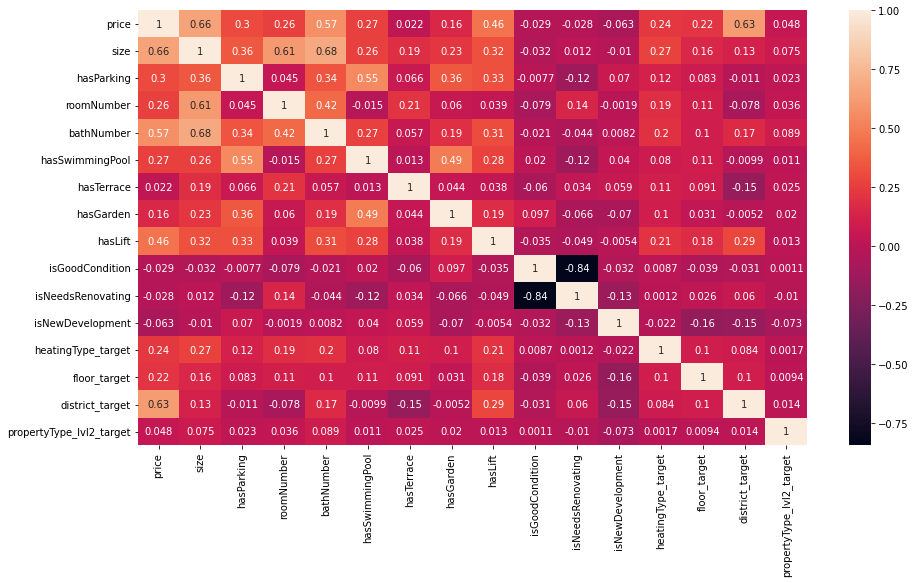

In [162]:
fig, ax = plt.subplots(1,1,figsize=(15,8))
sns.heatmap(df_target_encoding.corr(),annot=True, ax=ax);

### **Catboost Encoding approximation**

In [163]:
categorical_columns = ['heatingType','floor','district','propertyType_lvl2']

In [164]:
cbe_encoder = ce.cat_boost.CatBoostEncoder()

In [165]:
cbe_encoder.fit(df_clean[categorical_columns], df_clean['price'])
df_catboost_encoding = df_clean.join(cbe_encoder.transform(df_clean[categorical_columns]).add_suffix('_catboost')).drop(['heatingType','floor','district','propertyType_lvl2'],axis=1)

In [166]:
df_catboost_encoding.head()

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType_catboost,floor_catboost,district_catboost,propertyType_lvl2_catboost
0,99000,56,0,3,1,0,0,0,0,1,0,0,305312.044015,292955.201763,170684.924117,308902.227358
1,136000,55,0,2,1,0,0,0,0,1,0,0,231886.966060,291467.983960,170684.924117,308902.227358
2,574300,94,0,4,1,0,0,0,1,1,0,0,305312.044015,330802.168805,505180.022945,308902.227358
3,119000,52,0,3,1,0,0,0,0,1,0,0,225917.296462,292955.201763,249358.414838,308902.227358
4,329000,95,1,2,2,1,1,1,1,1,0,0,447671.045581,256482.909391,252616.671129,308902.227358


### **One Hot Encoding approximation**

In [167]:
df_clean.head()

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,propertyType_lvl2
0,99000,56,0,3,1,0,0,0,0,1,0,0,no info - heating,noinfo,Puente de Vallecas,piso
1,136000,55,0,2,1,0,0,0,0,1,0,0,Eléctrica,3,Puente de Vallecas,piso
2,574300,94,0,4,1,0,0,0,1,1,0,0,no info - heating,4,Barrio de Salamanca,piso
3,119000,52,0,3,1,0,0,0,0,1,0,0,No dispone de calefacción,noinfo,San Blas,piso
4,329000,95,1,2,2,1,1,1,1,1,0,0,Gas,0,Vicálvaro,piso


In [168]:
oneHotEncoder = OneHotEncoder()
feature_array = oneHotEncoder.fit_transform(df_clean[['heatingType','floor','propertyType_lvl2']]).toarray()
oneHotEncoder.fit_transform(df_clean[['heatingType','floor','propertyType_lvl2']]).toarray()

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [169]:
feature_labels = oneHotEncoder.categories_
feature_labels

[array(['Bomba de frío/calor', 'Electricidad', 'Eléctrica', 'Gas',
        'Gas natural', 'Gas propano/butano', 'Gasoil',
        'No dispone de calefacción', 'Solar', 'no info - heating'],
       dtype=object),
 array(['-1', '0', '1', '10', '11', '12', '13', '14', '15', '16', '17',
        '18', '19', '2', '20', '21', '26', '3', '4', '40', '5', '6', '7',
        '8', '9', 'doesnotapply', 'entre', 'noinfo', 'semi-sótano'],
       dtype=object),
 array(['chalet', 'duplex', 'loft', 'piso', 'studio'], dtype=object)]

In [170]:
feature_labels = np.array(np.hstack(feature_labels),dtype="object").flatten()
feature_labels

array(['Bomba de frío/calor', 'Electricidad', 'Eléctrica', 'Gas',
       'Gas natural', 'Gas propano/butano', 'Gasoil',
       'No dispone de calefacción', 'Solar', 'no info - heating', '-1',
       '0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18',
       '19', '2', '20', '21', '26', '3', '4', '40', '5', '6', '7', '8',
       '9', 'doesnotapply', 'entre', 'noinfo', 'semi-sótano', 'chalet',
       'duplex', 'loft', 'piso', 'studio'], dtype=object)

In [171]:
df_ohe = pd.DataFrame(feature_array, columns = feature_labels)
df_ohe

,Bomba de frío/calor,Electricidad,Eléctrica,Gas,Gas natural,Gas propano/butano,Gasoil,No dispone de calefacción,Solar,no info - heating,...,9,doesnotapply,entre,noinfo,semi-sótano,chalet,duplex,loft,piso,studio
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
14126,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
14127,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
14128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [172]:
df_onehot_encoding = pd.concat([df_clean,df_ohe],axis=1).drop(['heatingType','floor','propertyType_lvl2'], axis=1)
df_onehot_encoding.head()

,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,...,9,doesnotapply,entre,noinfo,semi-sótano,chalet,duplex,loft,piso,studio
0,99000,56,0,3,1,0,0,0,0,1,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,136000,55,0,2,1,0,0,0,0,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,574300,94,0,4,1,0,0,0,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,119000,52,0,3,1,0,0,0,0,1,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,329000,95,1,2,2,1,1,1,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [173]:
list(df_onehot_encoding.columns)

['price',
 'size',
 'hasParking',
 'roomNumber',
 'bathNumber',
 'hasSwimmingPool',
 'hasTerrace',
 'hasGarden',
 'hasLift',
 'isGoodCondition',
 'isNeedsRenovating',
 'isNewDevelopment',
 'district',
 'Bomba de frío/calor',
 'Electricidad',
 'Eléctrica',
 'Gas',
 'Gas natural',
 'Gas propano/butano',
 'Gasoil',
 'No dispone de calefacción',
 'Solar',
 'no info - heating',
 '-1',
 '0',
 '1',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '26',
 '3',
 '4',
 '40',
 '5',
 '6',
 '7',
 '8',
 '9',
 'doesnotapply',
 'entre',
 'noinfo',
 'semi-sótano',
 'chalet',
 'duplex',
 'loft',
 'piso',
 'studio']

## **Modeling**

In [174]:
!pip install scikeras[tensorflow]
!pip install catboost
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 99 kB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 569 kB 5.1 MB/s 


In [175]:
from sklearn.model_selection import cross_validate #como cross_val_score pero con múltiples métricas
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.model_selection import RepeatedKFold #https://machinelearningmastery.com/repeated-k-fold-cross-validation-with-python/
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from keras.models import Sequential
from keras.layers import Dense
from scikeras.wrappers import KerasRegressor
import shap
#https://towardsdatascience.com/explaining-scikit-learn-models-with-shap-61daff21b12a https://www.squeezethedata.com/explicabilidad-de-modelos-de-machine-learning-con-shap-2/
# https://www.simplilearn.com/tutorials/scikit-learn-tutorial/sklearn-regression-models

In [176]:
model_evaluations_df = pd.DataFrame()

In [177]:
def model_evaluation(test, prediction, model, params = None):
  # Interesante para entender las métricas: https://sitiobigdata.com/2018/08/27/machine-learning-metricas-regresion-mse/

  r2 = metrics.r2_score(test,prediction).round(4)
  mse = metrics.mean_squared_error(test,prediction).round(4)
  rmse = np.sqrt(metrics.mean_squared_error(test,prediction)).round(4)
  mae = metrics.mean_absolute_error(test,prediction).round(4)

  row = {'model': [model], 'r2': [r2], 'mse': [mse], 'rmse': [rmse], 'mae': [mae], 'hyperparameters': [params]}
  eval = pd.DataFrame(row, columns = ['model','r2','mse','rmse','mae','hyperparameters'])

  return eval

In [178]:
def cross_validate_models(X,y,model):
  #Validación cruzada con cross_validate
  cv = 5 #RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
  scores = cross_validate(model, X, y, scoring=('r2', 'neg_mean_squared_error','neg_mean_absolute_error'), cv=cv, n_jobs=-1)

  r2 = scores['test_r2'].mean().round(4)
  mse = abs(scores['test_neg_mean_squared_error']).mean().round(4)
  rmse = np.sqrt(abs(scores['test_neg_mean_squared_error']).mean().round(4))
  mae = abs(scores['test_neg_mean_absolute_error']).mean().round(4)

  row = {'model': [model], 'r2': [r2], 'mse': [mse], 'rmse': [rmse], 'mae': [mae]}
  eval = pd.DataFrame(row, columns = ['model','r2','mse','rmse','mae'])

  return eval

In [179]:
def grid_search_cv(X_train, y_train, model, parameters, cv=5, scoring='neg_mean_squared_error'):
  grid = GridSearchCV(model,
                        parameters,
                        cv = cv,
                        scoring = scoring,
                        n_jobs = -1,
                        verbose=True)

  grid.fit(X_train, y_train)

  return {'best_score (RMSE)': np.sqrt(abs(grid.best_score_)).round(4), 'best_params': grid.best_params_}

In [180]:
def test_model_predictions(df_model,model,index=-1):
  if index == -1:
    index = random.randint(1, len(df_model.index))
  real_price = df_model[df_model.index == index]['price'].values[0]

  try:
    predicted_price = model.predict(df_model[df_model.index == index].drop('price',axis=1)).astype('int64')
  except:
    predicted_price = model.predict(df_model[df_model.index == index]).astype('int64')

  diff = real_price - predicted_price

  row = {'index': index, 'real_price': real_price, 'predicted_price': predicted_price, 'difference': diff}
  test = pd.DataFrame(row, columns = ['index','real_price','predicted_price','difference'])

  return test


In [181]:
def plot_error(real_price,predicted_price):
  df_to_plot = pd.DataFrame({'real_price':real_price,'predicted_price':predicted_price})
  df_to_plot = df_to_plot.sort_values('real_price').reset_index()
  fig, ax = plt.subplots(1,1,figsize = (20,15))
  ax.plot(df_to_plot['real_price'],color='red',alpha=.7)
  ax.plot(df_to_plot['predicted_price'],color='blue',alpha=.4)
  ax.set_title('Real price vs. Price prediction', fontsize=20)
  ax.set(ylabel='price')

### **Train Test Split**

In [182]:
df_model = df_target_encoding #df_target_encoding, df_catboost_encoding, df_onehot_encoding

In [183]:
X = df_model.drop(['price'],axis=1)
y = df_model['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, test_size = 0.2, random_state = 32)

In [184]:
X_train.head(5)

,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,hasLift,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType_target,floor_target,district_target,propertyType_lvl2_target
3693,115,1,3,2,1,0,1,1,1,0,0,332388.639888,329015.006161,149672.659298,308902.186168
9235,81,0,1,1,0,0,0,1,1,0,0,225783.840256,259564.415584,505504.061258,308902.186168
4349,65,0,2,1,0,1,0,1,0,1,0,305311.488690,331740.517132,170554.984082,308902.186168
10532,82,1,3,1,0,1,0,1,1,0,1,332388.639888,299297.097257,149672.659298,308902.186168
6128,50,0,1,1,0,0,0,1,1,0,0,305311.488690,330822.788406,505504.061258,308902.186168


### **Linear Regression**

In [ ]:
#https://scikit-learn.org/stable/modules/model_evaluation.html

LR_model = LinearRegression()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'fit_intercept':[True,False], 
              'n_jobs': [-1]}

grid_search_cv(X_train, y_train, LR_model, parameters, cv)

Fitting 8 folds for each of 2 candidates, totalling 16 fits


{'best_score (RMSE)': 83748.1289,
 'best_params': {'fit_intercept': True, 'n_jobs': -1}}

In [ ]:
LR_model = LinearRegression(fit_intercept = True, n_jobs = -1)
LR_model.fit(X_train, y_train)

LinearRegression(n_jobs=-1)

In [ ]:
LR_c = LR_model.intercept_
LR_m = LR_model.coef_
print(f'Intercept = {LR_c}\nCoefficient = {LR_m}')

Intercept = -260166.75352073897
Coefficient = [ 2.89083740e+03  1.11726902e+04 -8.81737032e+03  3.27821549e+04
  3.66006971e+04 -5.41581302e+02 -1.04047933e+04  2.61334277e+04
 -4.56088459e+04 -6.57294344e+04  1.86240575e+03  7.42795178e-02
  2.69230205e-01  8.32856546e-01 -1.22219485e-01]


In [ ]:
cross_validate_models(X,y,LR_model)

,model,r2,mse,rmse,mae
0,LinearRegression(n_jobs=-1),0.7714,7.133598e+09,84460.627772,62854.2094


In [ ]:
LR_yhat = LR_model.predict(X_test)
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,LR_yhat,'Linear Regression')]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Linear Regression,0.7657,7.429933e+09,86197.0613,63342.6158,None


In [ ]:
from sklearn.feature_selection import RFECV

# create pipeline
rfe = RFECV(estimator=LR_model)
pipeline = Pipeline(steps=[('s',rfe),('m',LR_model)])
pipeline.fit(X_train, y_train)
LR_RFE_yhat = pipeline.predict(X_test)
model_evaluation(y_test,LR_RFE_yhat,'Linear Regression Pipeline RFE')

,model,r2,mse,rmse,mae,hyperparameters
0,Linear Regression Pipeline RFE,0.7657,7.429933e+09,86197.0613,63342.6158,None


Test predictions with random properties:

In [ ]:
test_model_predictions(df_model,LR_model)

X has feature names, but LinearRegression was fitted without feature names


,index,real_price,predicted_price,difference
0,3518,375000,307967,67033


Text(0.5, 1.0, 'Linear Regression - Matching predictions with actual price values')

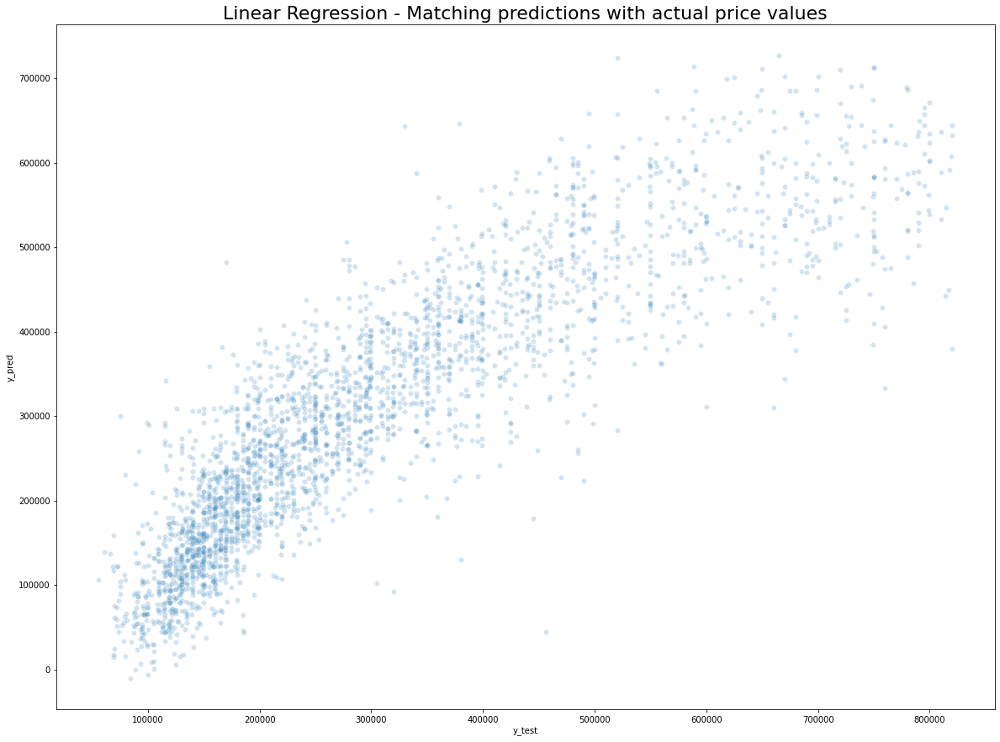

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=LR_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='y_pred')
ax.set_title('Linear Regression - Matching predictions with actual price values',fontsize=22)

[Text(0, 0.5, 'price')]

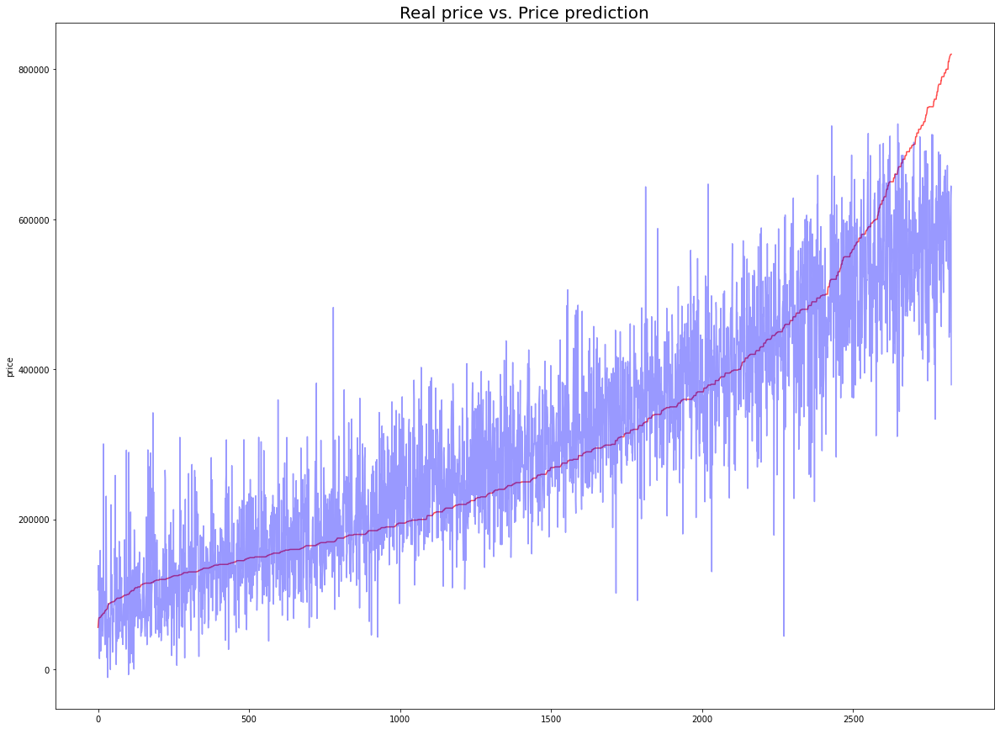

In [ ]:
plot_error(y_test,LR_yhat)

### **XGBoost Regressor**

In [ ]:
XGB_model = XGBRegressor()
cv = KFold(n_splits=4) #RepeatedKFold(n_splits=4, n_repeats=2, random_state=1)
parameters = {'objective':['reg:squarederror'],
              'learning_rate': [.02,.03,.1], 
              'max_depth': [2, 7, 8],
              #'min_child_weight': [4,5,8],
              #'silent': [True,False],
              #'subsample': [0.7],
              #'colsample_bytree': [0.7],
              'n_estimators': [200,350,500]}

grid_search_cv(X_train, y_train, XGB_model, parameters, cv)

Fitting 4 folds for each of 27 candidates, totalling 108 fits


{'best_score (RMSE)': 68645.5354,
 'best_params': {'learning_rate': 0.02,
  'max_depth': 7,
  'n_estimators': 500,
  'objective': 'reg:squarederror'}}

In [ ]:
#param = xgb_grid.best_params_

XGB_model = XGBRegressor(learning_rate = 0.02, max_depth = 7, n_estimators = 500, objective = 'reg:squarederror')
XGB_model.fit(X_train, y_train)

XGBRegressor(learning_rate=0.02, max_depth=7, n_estimators=500,
             objective='reg:squarederror')

In [ ]:
cross_validate_models(X,y,XGB_model)

,model,r2,mse,rmse,mae
0,"XGBRegressor(learning_rate=0.02, max_depth=7, ...",0.8514,4.629217e+09,68038.348287,46857.5476


In [ ]:
#Prediction
XGB_yhat = XGB_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,XGB_yhat, 'XGBoost Regression',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,0.8556,4.578648e+09,67665.7077,46502.0093,None


In [ ]:
test_model_predictions(df_model,XGB_model)

,index,real_price,predicted_price,difference
0,4220,329000,289746,39254


Text(0.5, 1.0, 'XGBoost Regression - Matching predictions with actual price values')

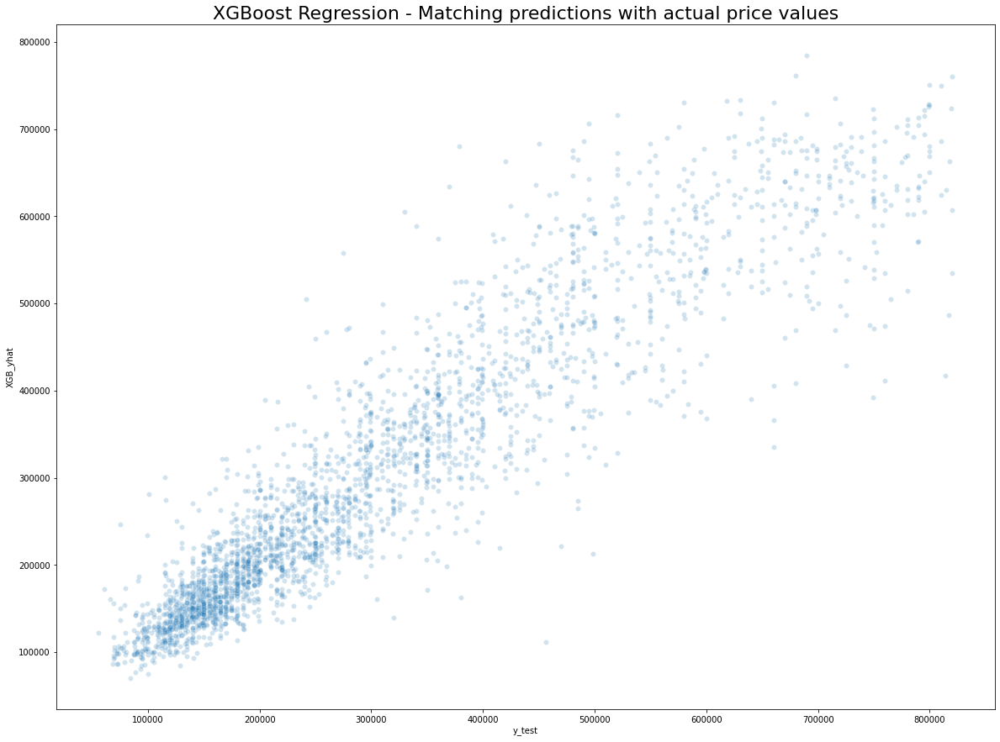

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=XGB_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='XGB_yhat')
ax.set_title('XGBoost Regression - Matching predictions with actual price values',fontsize=22)

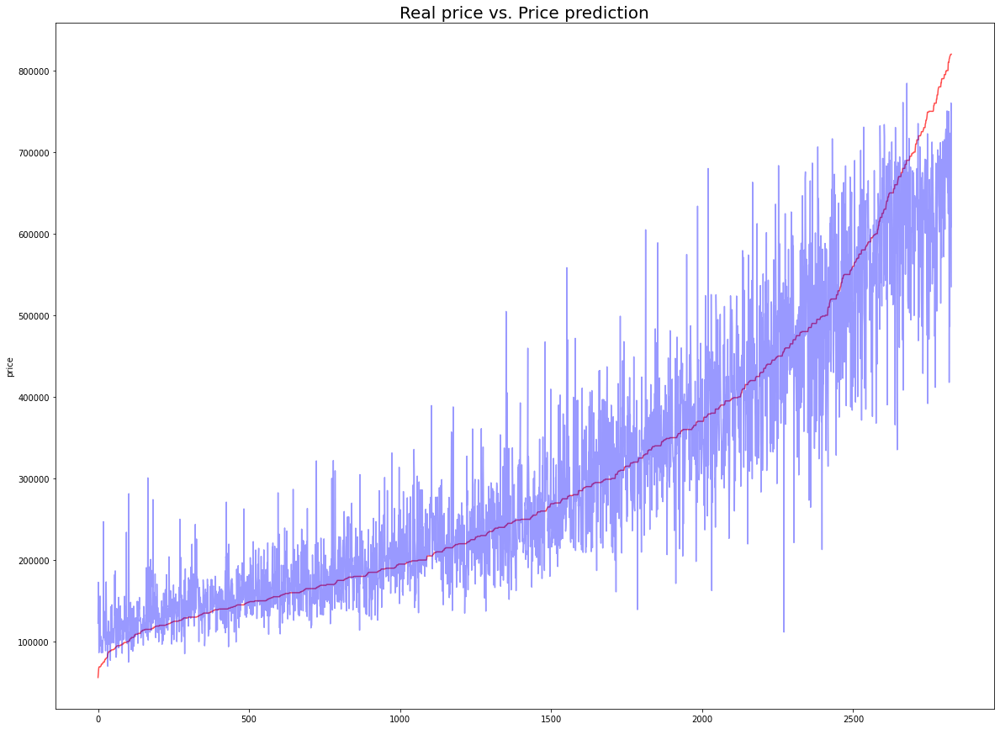

In [ ]:
plot_error(y_test,XGB_yhat)

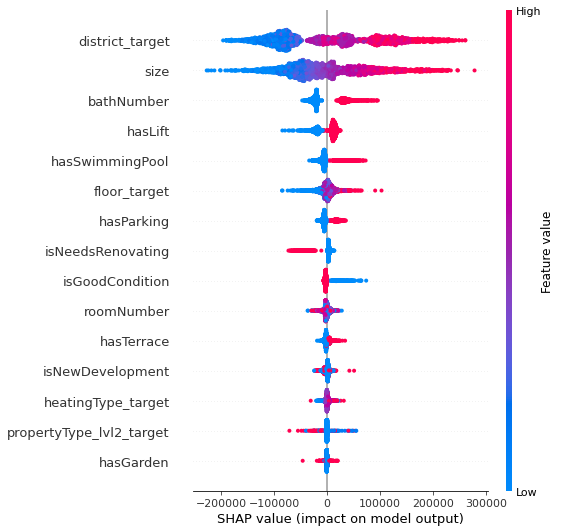

In [ ]:
# https://towardsdatascience.com/interpretable-machine-learning-using-shap-theory-and-applications-26c12f7a7f1a

sorted_feature_importance = XGB_model.feature_importances_.argsort()
explainer = shap.Explainer(XGB_model)
shap_test = explainer(X_test)
'''
imp_features = list(zip(shap_test.feature_names,sorted_feature_importance))
imp_features.sort(key = lambda e: e[1])
ordered_features = [x[0] for x in imp_features]
'''

shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_test)

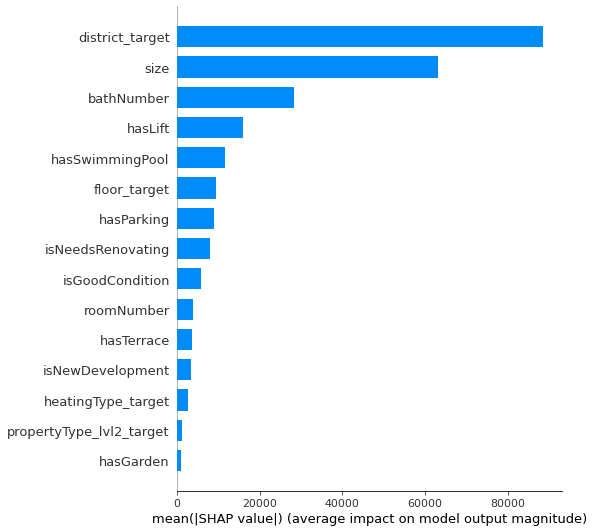

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
shap.initjs()
print(explainer.expected_value)
shap.force_plot(explainer.expected_value, shap_values[1,:], X.iloc[1,:])

311524.28


Los parámetros que están en rojo son los que hacen que la predicción tenga un valor más alto, mientras que los parámetros en azul hacen que la predicción tenga un valor más bajo.



### **CatBoost Regressor**

In [ ]:
CB_model = CatBoostRegressor()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=1)
parameters = {'iterations': [100, 150, 200],
              'learning_rate': [0.03, 0.1],
              'depth': [2, 4, 6, 8],
              'l2_leaf_reg': [0.2, 0.5, 1, 3],
              'loss_function': ['RMSE']}

grid_search_cv(X_train, y_train, CB_model, parameters, cv)

In [ ]:
CB_model = CatBoostRegressor(learning_rate = 0.05, depth = 6, loss_function = 'RMSE', l2_leaf_reg = 0.5, verbose = False)
CB_model.fit(X_train, y_train)

In [ ]:
cross_validate_models(X,y,CB_model)

In [ ]:
#Prediction
CB_yhat = CB_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,CB_yhat, 'CatBoost Regression',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,0.8556,4.578648e+09,67665.7077,46502.0093,None
1,CatBoost Regression,0.8543,4.618561e+09,67959.9939,47000.8862,None


In [ ]:
test_model_predictions(df_model,CB_model)

,index,real_price,predicted_price,difference
0,4037,430000,497654,-67654


Text(0.5, 1.0, 'CatBoost Regression - Matching predictions with actual price values')

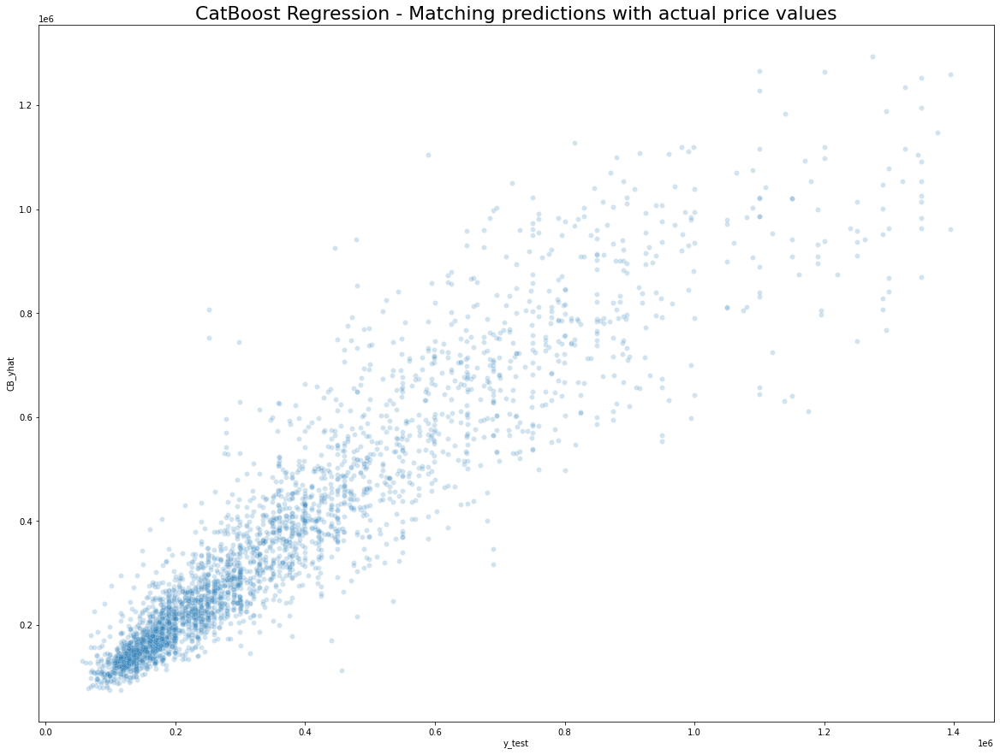

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=CB_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='CB_yhat')
ax.set_title('CatBoost Regression - Matching predictions with actual price values',fontsize=22)

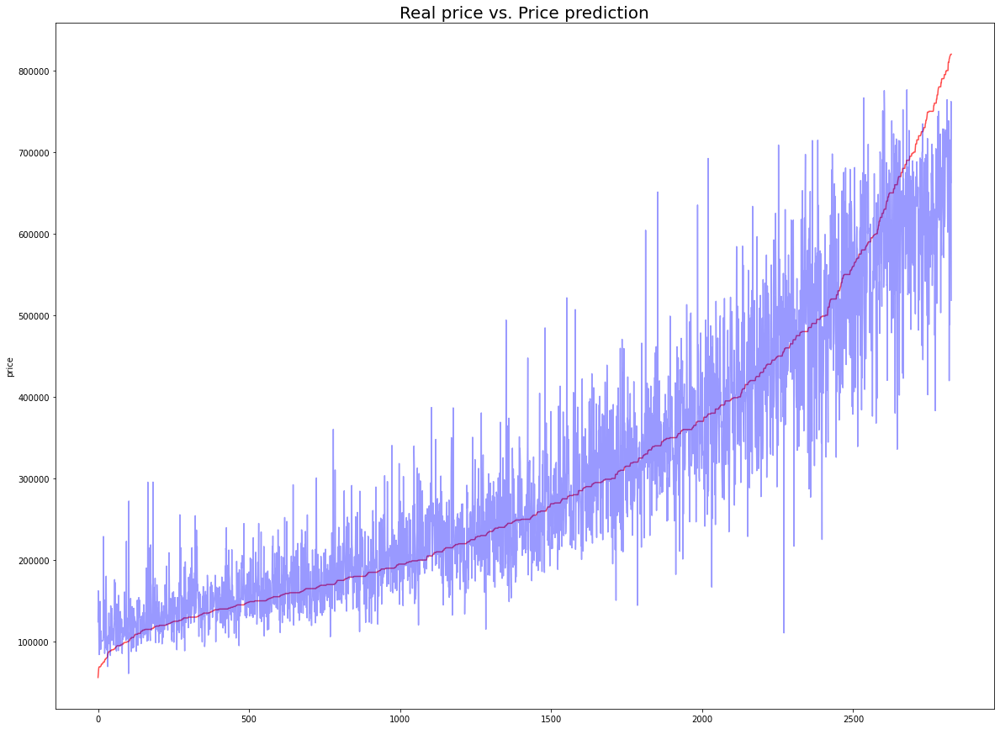

In [ ]:
plot_error(y_test,CB_yhat)

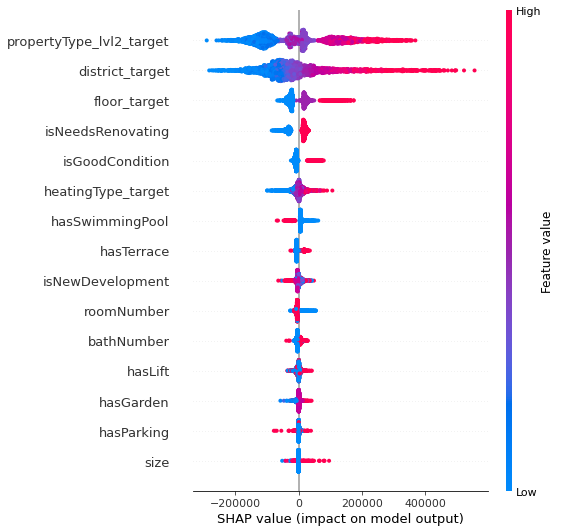

In [ ]:
explainer = shap.Explainer(CB_model)
shap_test = explainer(X_test)

shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_test)
#https://towardsdatascience.com/explain-any-models-with-the-shap-values-use-the-kernelexplainer-79de9464897a

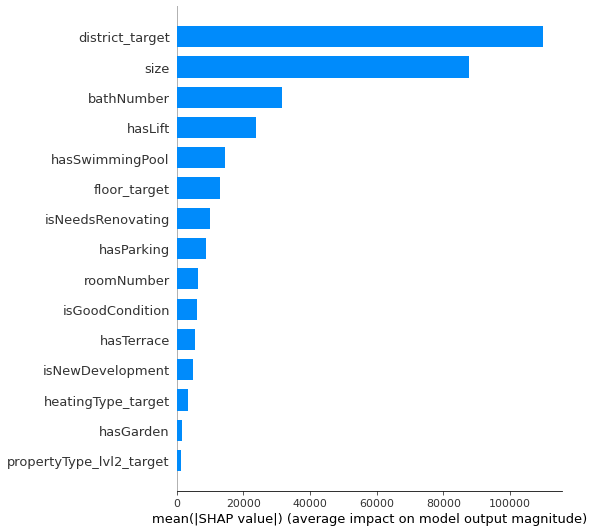

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1,:], X.iloc[1,:])

### **Gradient Boosting Regressor**

In [ ]:
GBR_model = GradientBoostingRegressor()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)

parameters = {'loss': ['squared_error'],
              'learning_rate': [.03, 0.05, .07, 1], 
              'max_depth': [5, 6, 7, 10],
              'n_estimators': [350,500,600,700,800]}

grid_search_cv(X_train, y_train, GBR_model, parameters)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


{'best_score (RMSE)': 68350.5508,
 'best_params': {'learning_rate': 0.07,
  'loss': 'squared_error',
  'max_depth': 5,
  'n_estimators': 350}}

In [ ]:
#param = GBR_grid.best_params_

GBR_model = GradientBoostingRegressor(learning_rate = 0.07, max_depth = 5, n_estimators = 350, loss = 'squared_error')
GBR_model.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.07, max_depth=5, n_estimators=350)

In [ ]:
cross_validate_models(X,y,GBR_model)

In [ ]:
#Prediction
GBR_yhat = GBR_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,GBR_yhat,'Gradient Boosting Regressor',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,0.8556,4.578648e+09,67665.7077,46502.0093,None
1,CatBoost Regression,0.8543,4.618561e+09,67959.9939,47000.8862,None
2,Gradient Boosting Regressor,0.8526,4.674228e+09,68368.3294,47177.9383,None


In [ ]:
from sklearn.feature_selection import RFECV

# create pipeline
rfe = RFECV(estimator=GBR_model)
pipeline = Pipeline(steps=[('s',rfe),('m',GBR_model)])
pipeline.fit(X_train, y_train)
GBR_RFE_yhat = pipeline.predict(X_test)
model_evaluation(y_test,GBR_RFE_yhat,'Gradient Boosting Pipeline RFE')


REGRESSION EVALUATION METRICS
R2 Score: 0.8574
Mean squared error (MSE): 9269783095.0098
Root Mean squared error (RMSE): 96279.7128
Mean absolute error (MAE): 61587.0635


,model,r2,mse,rmse,mae,hyperparameters
0,Gradient Boosting Pipeline RFE,0.8574,9.269783e+09,96279.7128,61587.0635,None


In [ ]:
test_model_predictions(df_model,GBR_model)

,index,real_price,predicted_price,difference
0,1892,270000,236788,33212


Text(0.5, 1.0, 'Gradient Boosting Regressor - Matching predictions with actual price values')

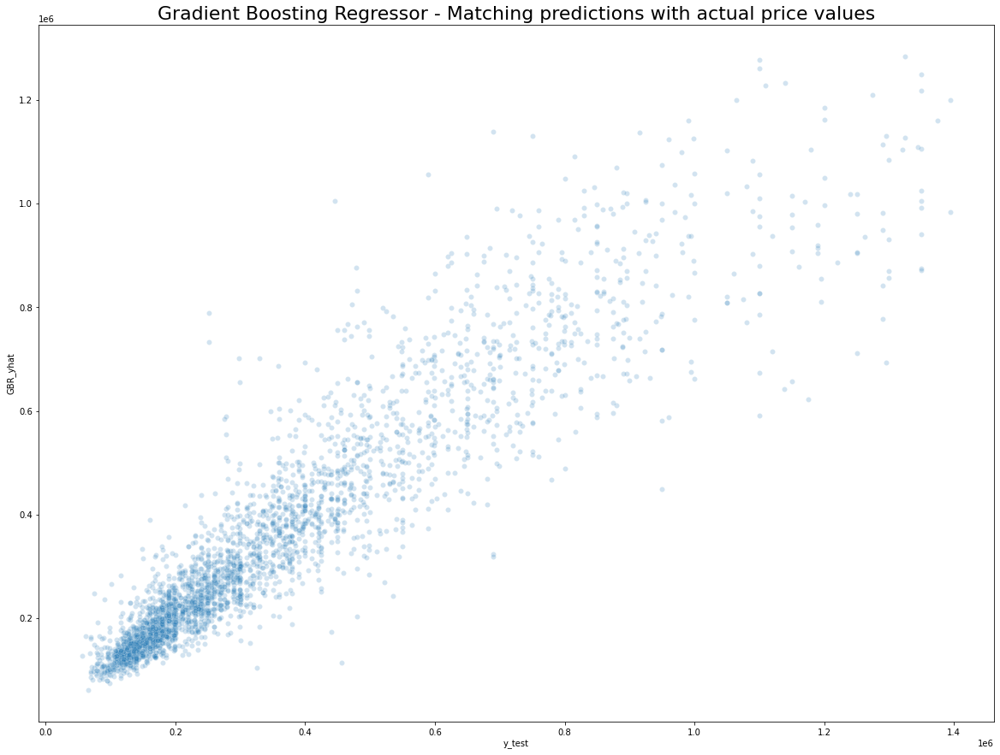

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=GBR_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='GBR_yhat')
ax.set_title('Gradient Boosting Regressor - Matching predictions with actual price values',fontsize=22)

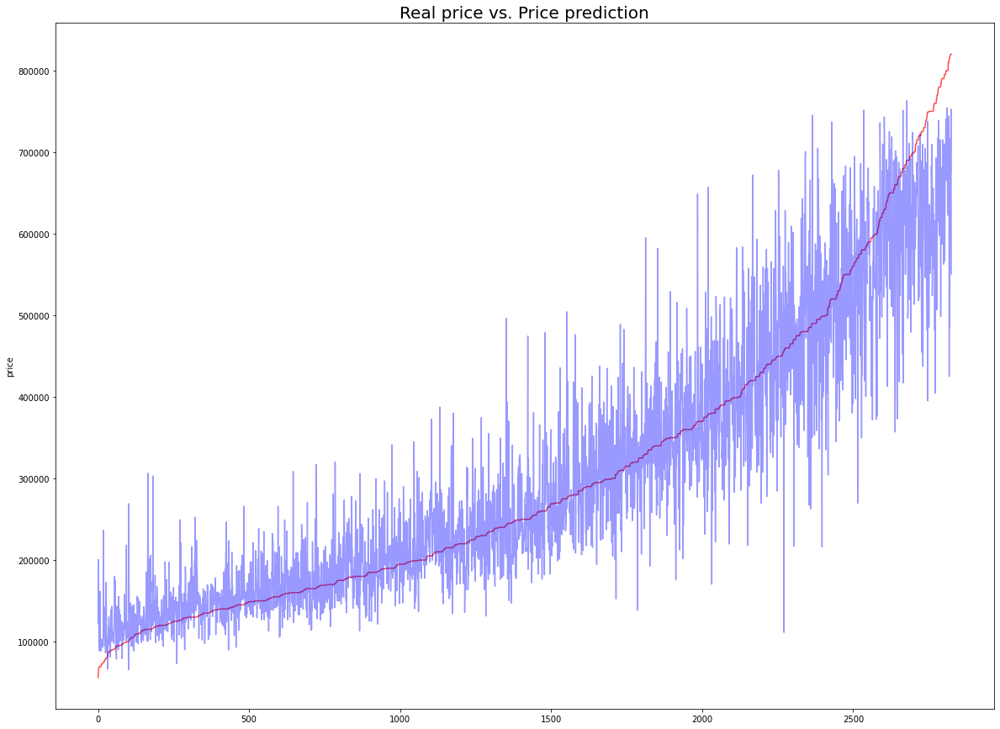

In [ ]:
plot_error(y_test,GBR_yhat)

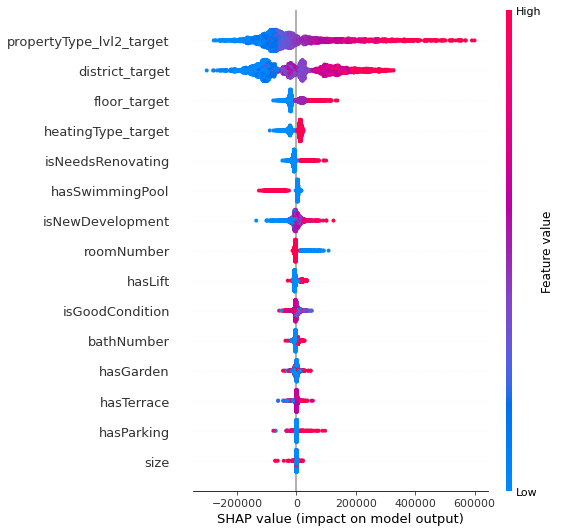

In [ ]:
explainer = shap.Explainer(GBR_model)
shap_test = explainer(X_test)

#shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_test)

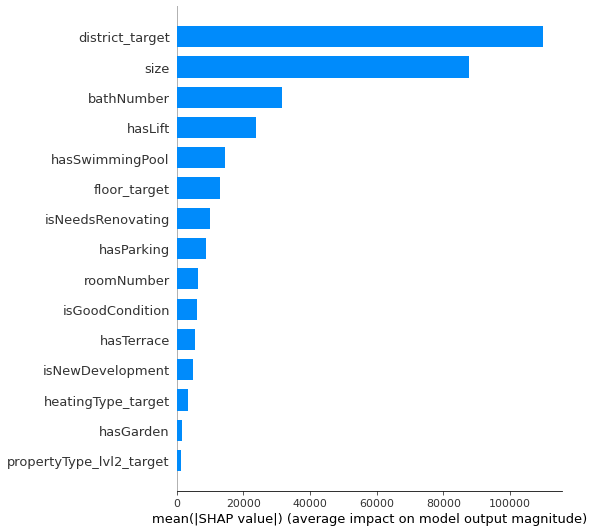

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1,:], X.iloc[1,:])

### **Random Forest Regressor**

In [ ]:
# Interesante para entenderlo: https://towardsdatascience.com/random-forest-regression-5f605132d19d

In [ ]:
RFR_model = RandomForestRegressor()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'criterion': ['squared_error'],
              'min_samples_split': [2,5], 
              'min_samples_leaf': [1,4,6],
              'max_depth': [10, 15,20,30,40],
              'max_features': ['sqrt','log2'],
              'n_estimators': [350,500,600,800]}

grid_search_cv(X_train, y_train, RFR_model, parameters, cv)

In [ ]:
#param = RFR_grid.best_params_

RFR_model = RandomForestRegressor(criterion = 'squared_error', max_depth = 15, max_features = 'sqrt', n_estimators = 500, min_samples_leaf = 1, min_samples_split = 2)
RFR_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=500)

In [ ]:
cross_validate_models(X,y,RFR_model)

In [ ]:
#Prediction
RFR_yhat = RFR_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,RFR_yhat,'Random Forest Regressor',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,0.8556,4.578648e+09,67665.7077,46502.0093,None
1,CatBoost Regression,0.8543,4.618561e+09,67959.9939,47000.8862,None
2,Gradient Boosting Regressor,0.8526,4.674228e+09,68368.3294,47177.9383,None
3,Random Forest Regressor,0.8398,5.078828e+09,71265.8935,48877.3270,None


In [ ]:
test_model_predictions(df_model,RFR_model)

,index,real_price,predicted_price,difference
0,6431,1275000,1097855,177145


Text(0.5, 1.0, 'Random Forest Regression - Matching predictions with actual price values')

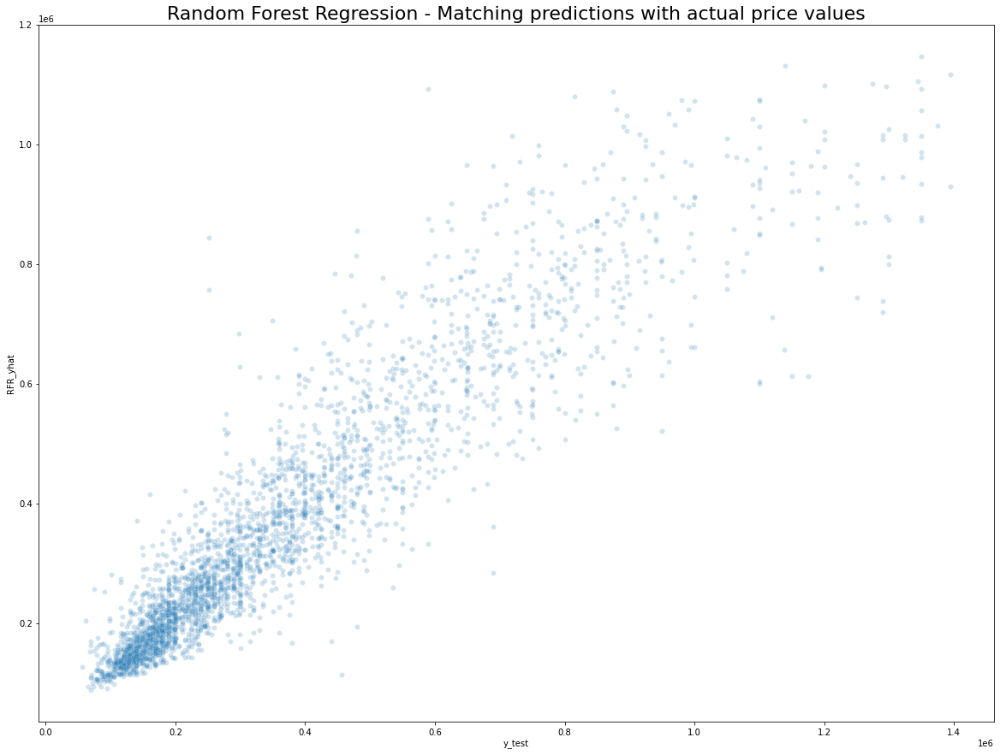

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=RFR_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='RFR_yhat')
ax.set_title('Random Forest Regression - Matching predictions with actual price values',fontsize=22)

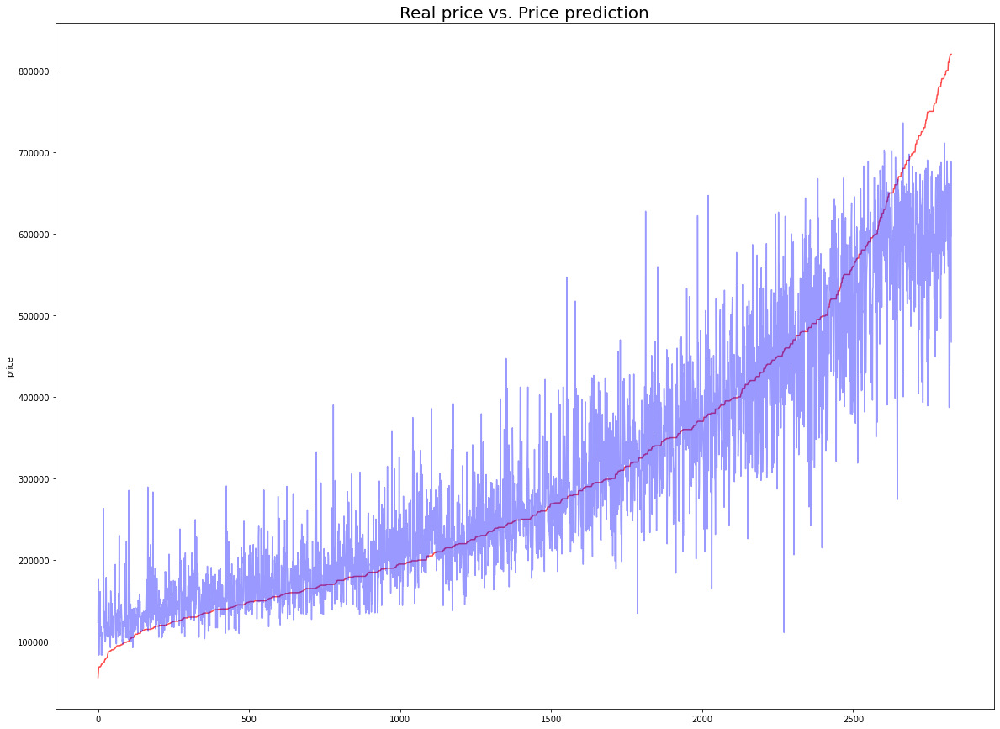

In [ ]:
plot_error(y_test,RFR_yhat)

### **LGBM Regressor**

In [ ]:
#https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMRegressor.html

In [ ]:
LGBM_model = LGBMRegressor()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'boosting_type': ['gbdt','dart','goss','rf'],
              'max_depth': [1,3,5,10],
              'learning_rate': [0.05, 0.1, 0.3],
              'n_estimators': [100,300,600],
              'objective': ['regression']}

grid_search_cv(X_train, y_train, LGBM_model, parameters, cv)

In [ ]:
LGBM_model = LGBMRegressor(boosting_type = 'gbdt', max_depth = 15, n_estimators = 400, learning_rate = 0.04, objective = 'regression')
LGBM_model.fit(X_train, y_train)

LGBMRegressor(learning_rate=0.04, max_depth=15, n_estimators=400,
              objective='regression')

In [ ]:
cross_validate_models(X,y,LGBM_model)

In [ ]:
#Prediction
LGBM_yhat = LGBM_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,LGBM_yhat,'LGBM Regressor',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,0.8556,4.578648e+09,67665.7077,46502.0093,None
1,CatBoost Regression,0.8543,4.618561e+09,67959.9939,47000.8862,None
2,Gradient Boosting Regressor,0.8526,4.674228e+09,68368.3294,47177.9383,None
3,Random Forest Regressor,0.8398,5.078828e+09,71265.8935,48877.3270,None
4,LGBM Regressor,0.8529,4.663753e+09,68291.6791,47108.0777,None


In [ ]:
test_model_predictions(df_model,LGBM_model)

,index,real_price,predicted_price,difference
0,1708,362900,352049,10851


Text(0.5, 1.0, 'LGBM Regressor - Matching predictions with actual price values')

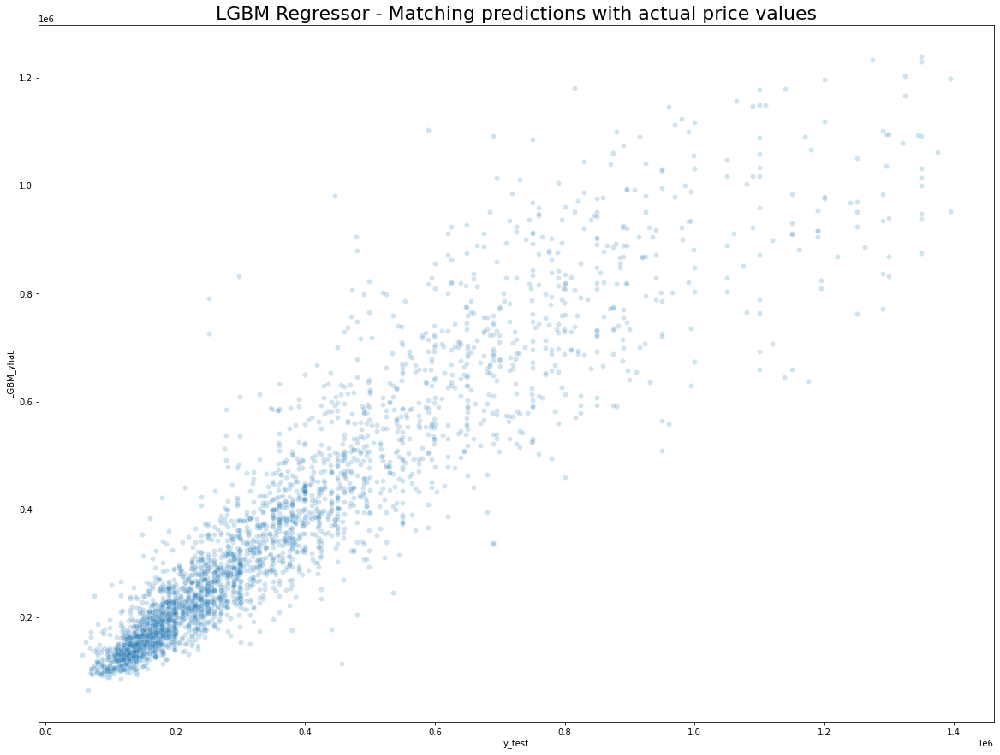

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=LGBM_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='LGBM_yhat')
ax.set_title('LGBM Regressor - Matching predictions with actual price values',fontsize=22)

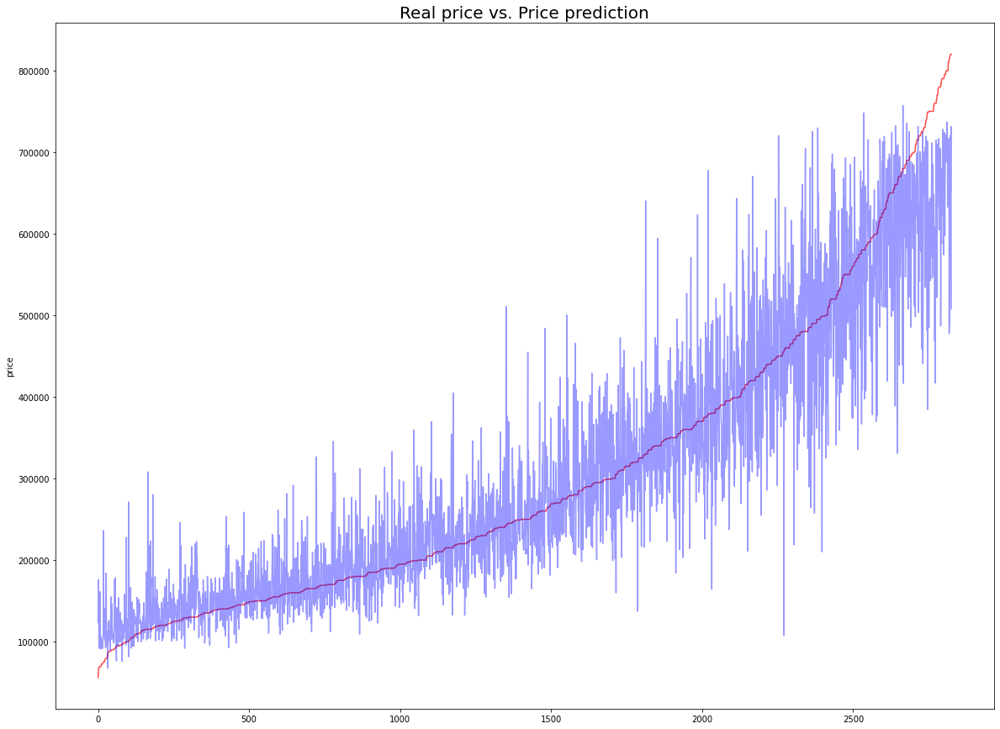

In [ ]:
plot_error(y_test,LGBM_yhat)

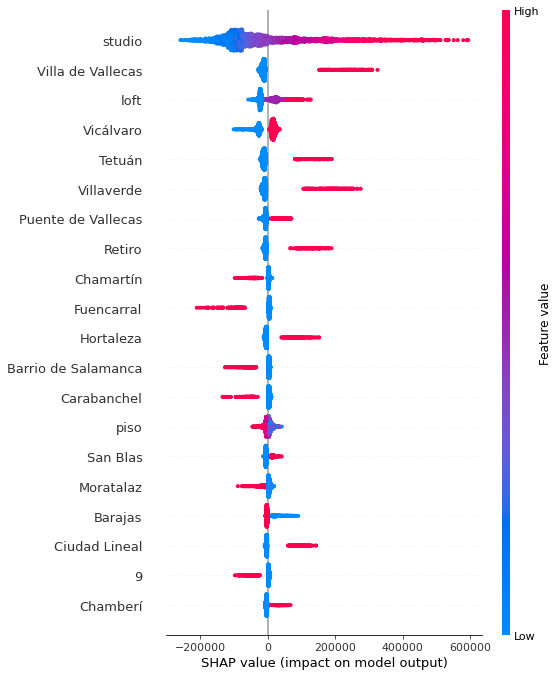

In [ ]:
explainer = shap.Explainer(LGBM_model)
shap_test = explainer(X_test)

#shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_test)

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

In [ ]:
shap.initjs()
print(explainer.expected_value)
shap.force_plot(explainer.expected_value, shap_values[1,:], X.iloc[1,:])

### **Support Vector Machine (SVR)**

In [ ]:
SVR_model = SVR()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'kernel': ['linear']}

grid_search_cv(X_train, y_train, SVR_model, parameters, cv)

Fitting 8 folds for each of 1 candidates, totalling 8 fits
-9628359309.478035
{'kernel': 'linear'}


In [ ]:
#param = SVR_grid.best_params_

SVR_model = SVR(kernel = 'linear')
SVR_model.fit(X_train, y_train) # con Target Encoding tarda mucho.

In [ ]:
cross_validate_models(X,y,SVR_model)

In [ ]:
#Prediction
SVR_yhat = SVR_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,SVR_yhat,'Support Vector Machine')]).reset_index(drop=True)
model_evaluations_df


REGRESSION EVALUATION METRICS
R2 Score: 0.5407
Mean squared error (MSE): 29867142754.4774
Root Mean squared error (RMSE): 172821.1294
Mean absolute error (MAE): 124397.8138


In [ ]:
test_model_predictions(df_model,SVR_model)

,model,r2,mse,rmse,mae,hyperparameters
0,XGBoost Regression,8.875000e-01,1.075243e+10,1.036939e+05,6.681872e+04,None
1,Gradient Boosting Regressor,8.872000e-01,1.078094e+10,1.038313e+05,6.697643e+04,None
2,Random Forest Regressor,8.448000e-01,1.483460e+10,1.217974e+05,8.327465e+04,None
3,Stochastic Gradient Descent Regressor,-6.828157e+10,6.527336e+21,8.079193e+10,5.462847e+10,None
4,Support Vector Machine,5.191000e-01,4.596779e+10,2.144010e+05,1.425326e+05,None


Text(0.5, 1.0, 'Support Vector Machine - Matching predictions with actual price values')

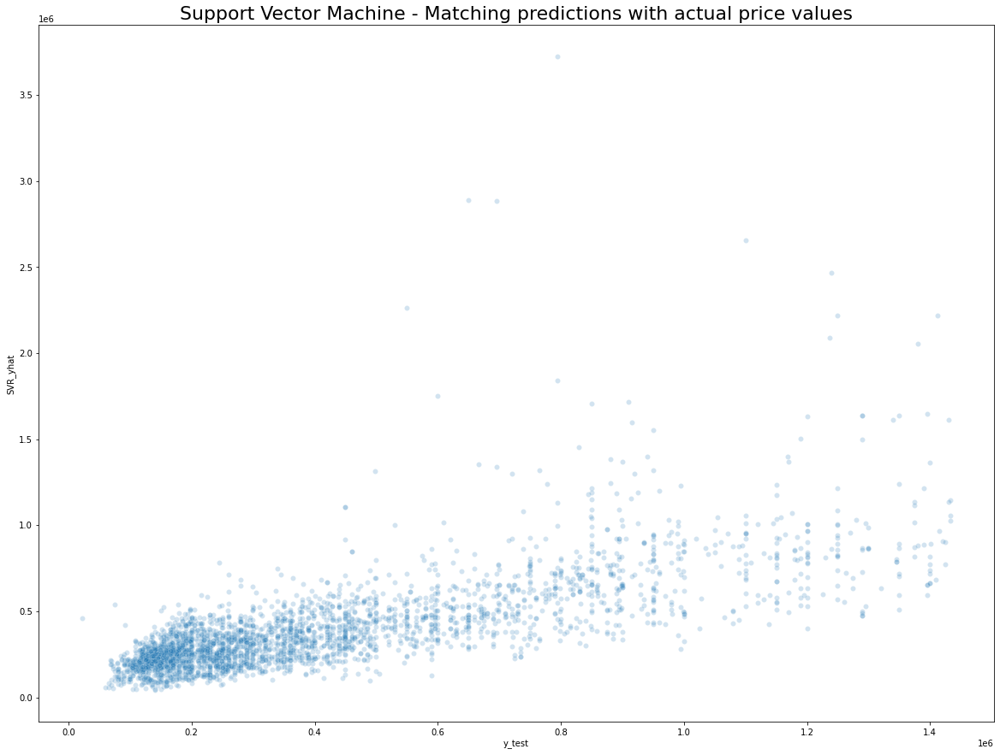

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=SVR_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='SVR_yhat')
ax.set_title('Support Vector Machine - Matching predictions with actual price values',fontsize=22)

In [ ]:
plot_error(y_test,SVR_yhat)

### **Decision Tree Regression**

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html

In [ ]:
DTR_model = DecisionTreeRegressor()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'criterion': ['squared_error'],
              'splitter': ['best','random'],
              'max_depth': [5,8,12,15]}

grid_search_cv(X_train, y_train, DTR_model, parameters, cv)plot_error(y_test,LGBM_yhat)

Fitting 8 folds for each of 8 candidates, totalling 64 fits
-20438958392.192757
{'criterion': 'squared_error', 'max_depth': 12, 'splitter': 'best'}


In [ ]:
DTR_model = DecisionTreeRegressor(criterion = 'squared_error', max_depth = 12, splitter = 'best')
DTR_model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=12)

In [ ]:
cross_validate_models(X,y,DTR_model)

In [ ]:
#Prediction
DTR_yhat = DTR_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,DTR_yhat,'Decision Tree Regression')]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Decision Tree Regression,0.7737,7.175461e+09,84708.0919,55483.0356,None


In [ ]:
test_model_predictions(df_model,DTR_model)

,index,real_price,predicted_price,difference
0,14720,178000,215692,-37692


Text(0.5, 1.0, 'Decision Tree Regression - Matching predictions with actual price values')

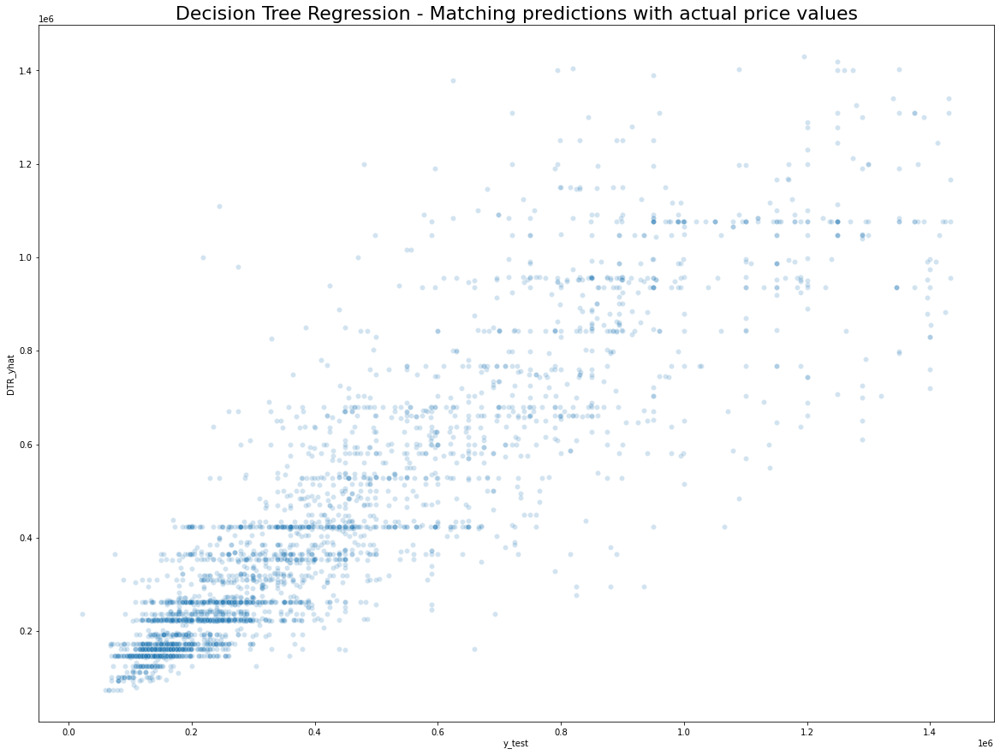

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=DTR_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='DTR_yhat')
ax.set_title('Decision Tree Regression - Matching predictions with actual price values',fontsize=22)

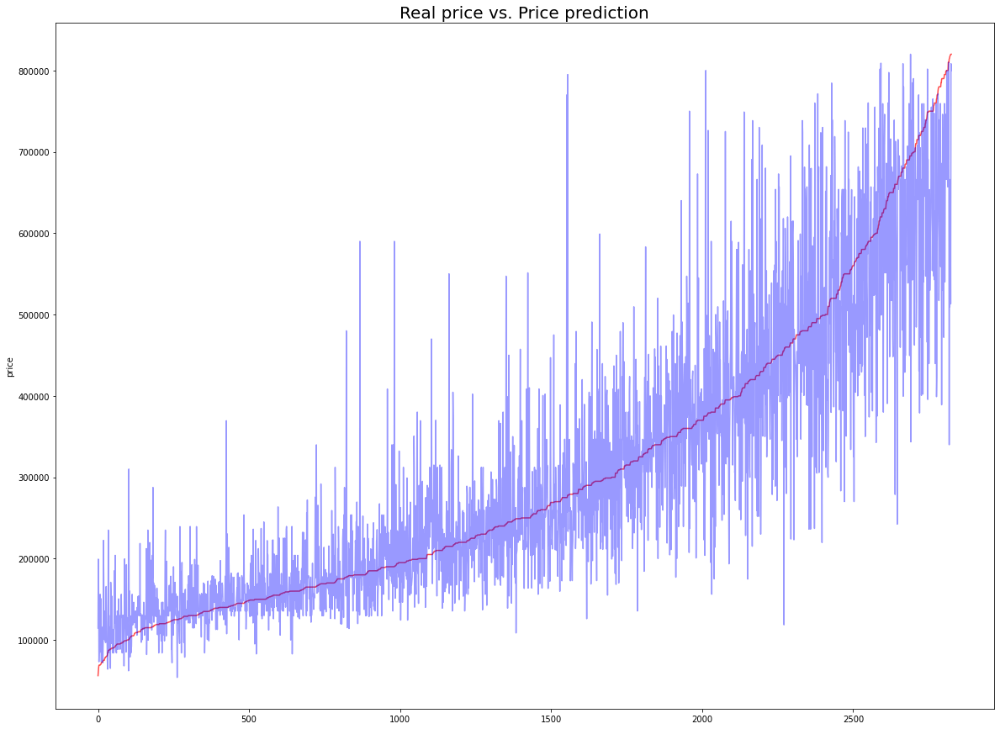

In [ ]:
plot_error(y_test,DTR_yhat)

### **AdaBoost Regressor**

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html

In [ ]:
ADA_model = AdaBoostRegressor(base_estimator = DTR_model)
parameters = {'loss': ['square','linear','exponential'],
              'learning_rate': [.03, 0.05, .07, 1], 
              'n_estimators': [350,500,600,700,800]}

grid_search_cv(X_train, y_train, ADA_model, parameters, cv)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
-1.712808388655605e+21
{'fit_intercept': True, 'learning_rate': 'adaptive', 'loss': 'squared_error', 'penalty': 'elasticnet'}


In [ ]:
#param = ADA_grid.best_params_

ADA_model = AdaBoostRegressor(base_estimator = DTR_model,learning_rate = 0.05, n_estimators = 600, loss = 'square')
ADA_model.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=12),
                  learning_rate=0.05, loss='square', n_estimators=600)

In [ ]:
cross_validate_models(X,y,ADA_model)

In [ ]:
#Prediction
ADA_yhat = ADA_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,ADA_yhat,'AdaBoost Regressor',None)]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Decision Tree Regression,0.7737,7.175461e+09,84708.0919,55483.0356,None
1,AdaBoost Regressor,0.8431,4.974815e+09,70532.3669,47067.3533,None


In [ ]:
test_model_predictions(df_model,ADA_model)

,index,real_price,predicted_price,difference
0,11846,241500,235500,6000


Text(0.5, 1.0, 'Matching predictions with actual price values')

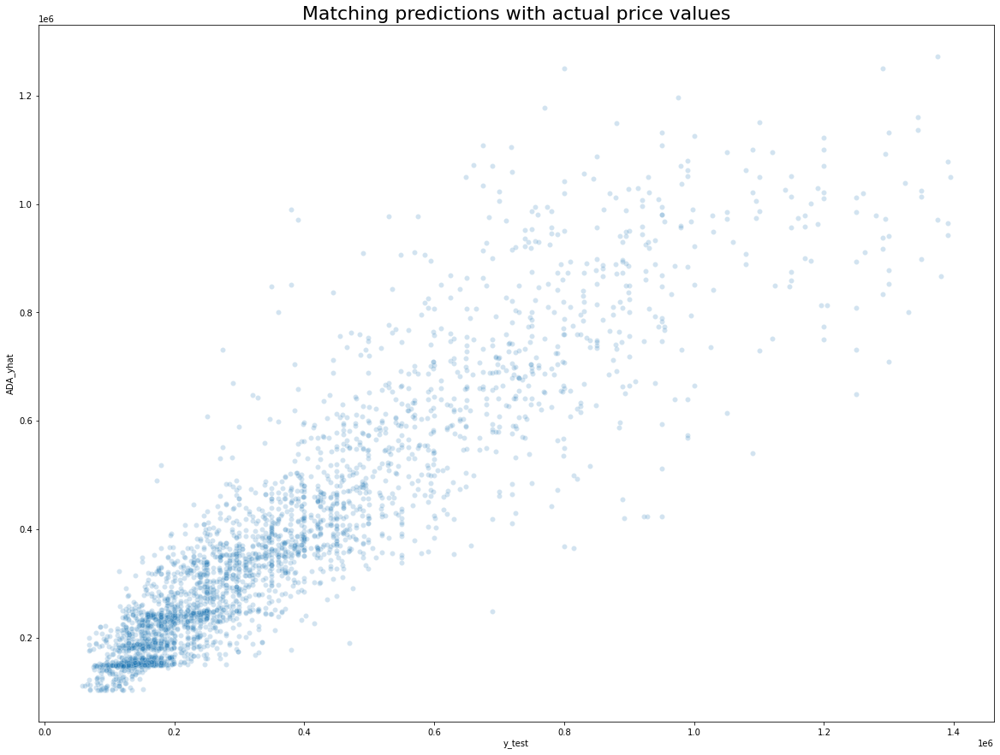

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=ADA_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='ADA_yhat')
ax.set_title('Matching predictions with actual price values',fontsize=22)

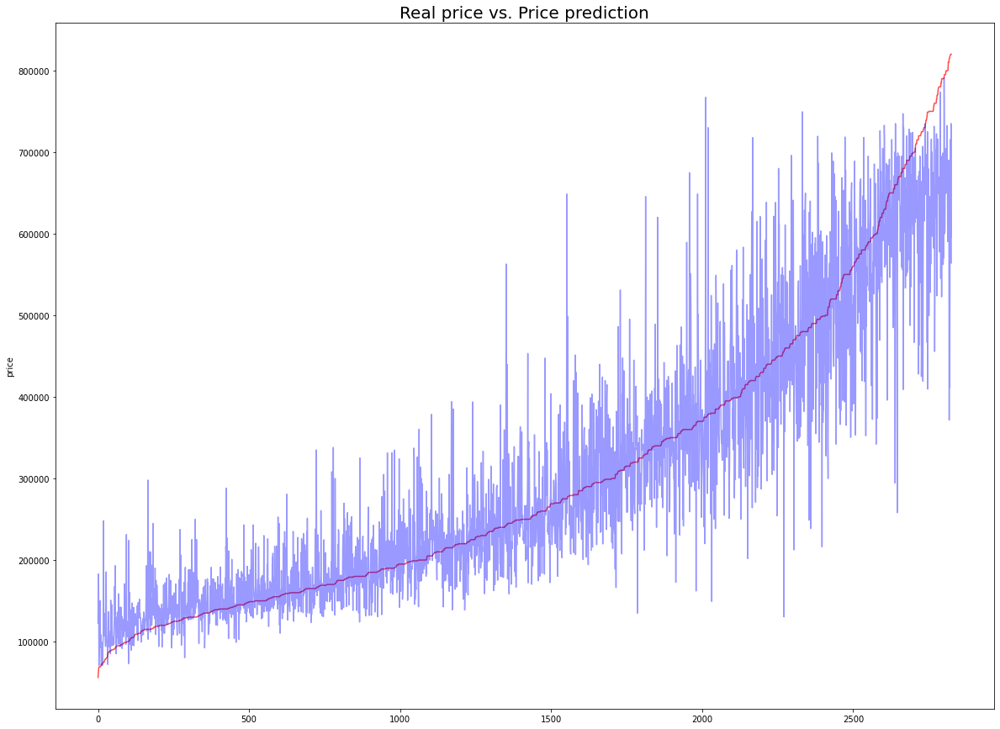

In [ ]:
plot_error(y_test,ADA_yhat)

### **Ridge Regression**

In [ ]:
Ridge_model = Ridge()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)

parameters = {'alpha': [1.0,4.0,8.0,12.0],
              'fit_intercept': [True,False]}

grid_search_cv(X_train, y_train, Ridge_model, parameters, cv)

Fitting 8 folds for each of 8 candidates, totalling 64 fits
-7635261009.970655
{'alpha': 4.0, 'fit_intercept': True}


In [ ]:
Ridge_model = Ridge(alpha = 4.0, fit_intercept = True)
Ridge_model.fit(X_train, y_train)

Ridge(alpha=4.0)

In [ ]:
cross_validate_models(X,y,Ridge_model)

In [ ]:
#Prediction
Ridge_yhat = Ridge_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,Ridge_yhat,'Ridge Regression')]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Decision Tree Regression,0.7737,7.175461e+09,84708.0919,55483.0356,None
1,AdaBoost Regressor,0.8431,4.974815e+09,70532.3669,47067.3533,None
2,Ridge Regression,0.7656,7.430554e+09,86200.6597,63338.4353,None


In [ ]:
test_model_predictions(df_model,Ridge_model)

,index,real_price,predicted_price,difference
0,4182,185000,315796,-130796


Text(0.5, 1.0, 'Ridge Regression - Matching predictions with actual price values')

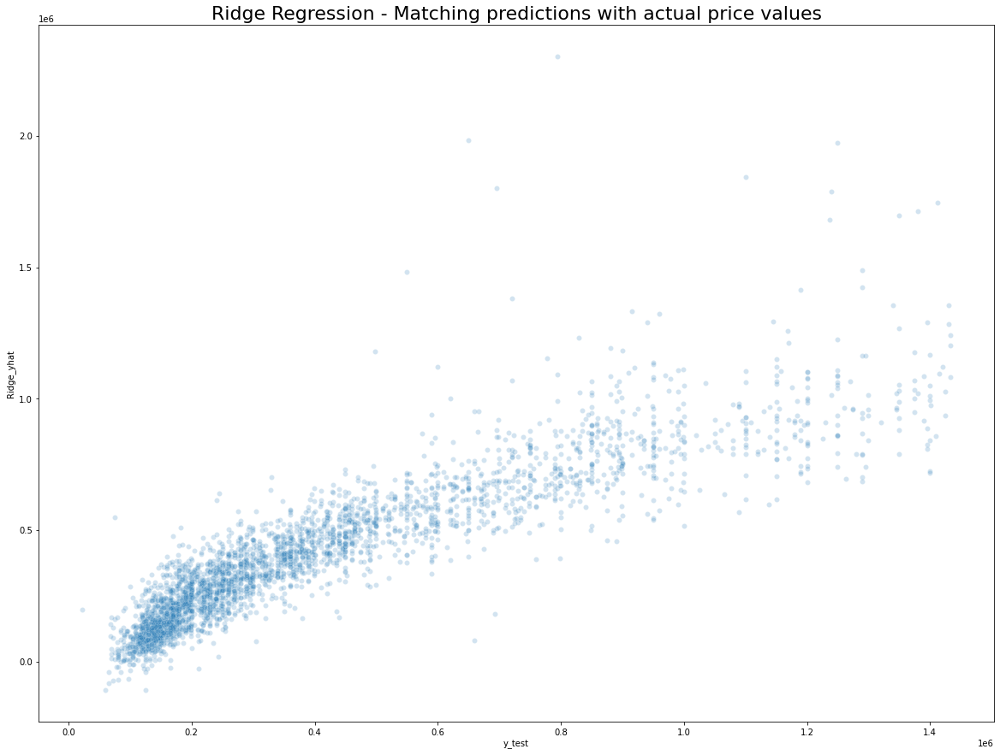

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=Ridge_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='Ridge_yhat')
ax.set_title('Ridge Regression - Matching predictions with actual price values',fontsize=22)

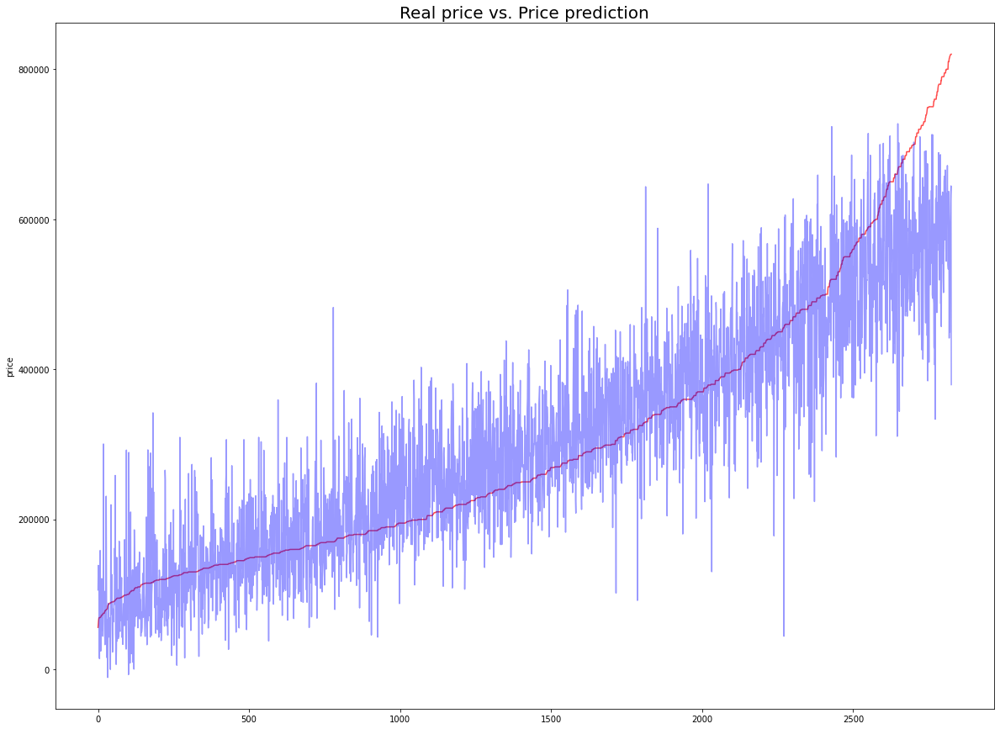

In [ ]:
plot_error(y_test,Ridge_yhat)

### **Lasso Regression**

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html

In [ ]:
Lasso_model = Lasso()
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)

parameters = {'alpha': [1.0,4.0,8.0,12.0],
              'fit_intercept': [True,False]}

grid_search_cv(X_train, y_train, Lasso_model, parameters, cv)

Fitting 8 folds for each of 8 candidates, totalling 64 fits
-7635784036.972674
{'alpha': 12.0, 'fit_intercept': True}


In [ ]:
Lasso_model = Lasso(alpha = 12.0, fit_intercept = True)
Lasso_model.fit(X_train, y_train)

Lasso(alpha=12.0)

In [ ]:
cross_validate_models(X,y,Lasso_model)

In [ ]:
#Prediction
Lasso_yhat = Lasso_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,Lasso_yhat,'Lasso Regression')]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Decision Tree Regression,0.7737,7.175461e+09,84708.0919,55483.0356,None
1,AdaBoost Regressor,0.8431,4.974815e+09,70532.3669,47067.3533,None
2,Ridge Regression,0.7656,7.430554e+09,86200.6597,63338.4353,None
3,Lasso Regression,0.7656,7.430211e+09,86198.6711,63337.5544,None


In [ ]:
test_model_predictions(df_model,Lasso_model)

,index,real_price,predicted_price,difference
0,15102,157800,78557,79243


Text(0.5, 1.0, 'Lasso Regression - Matching predictions with actual price values')

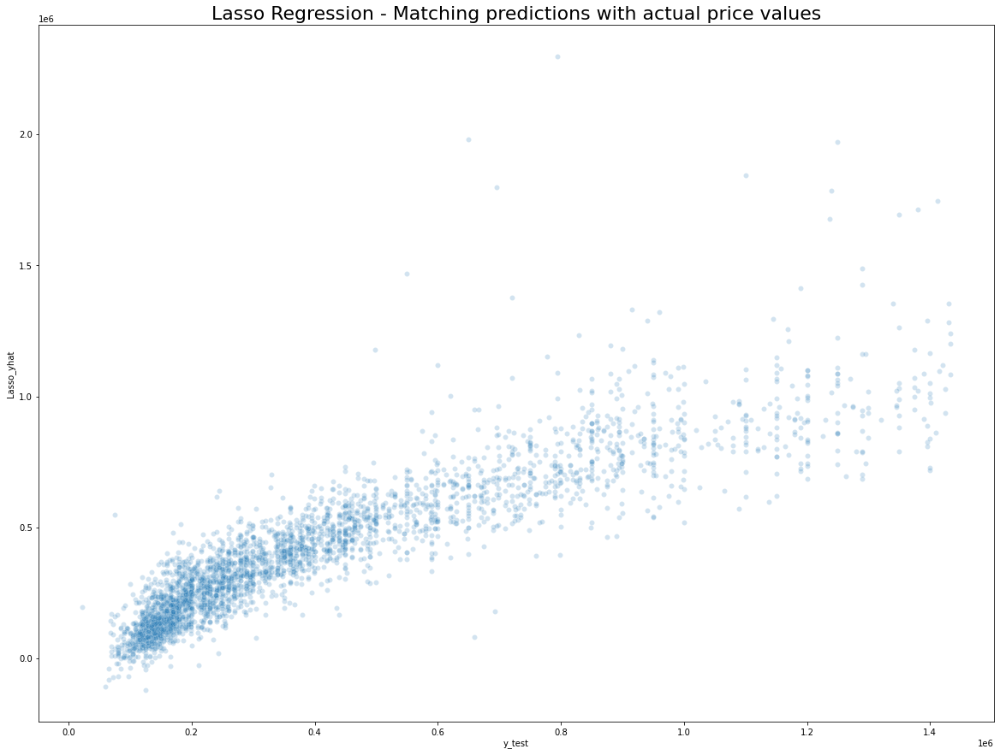

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=Lasso_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='Lasso_yhat')
ax.set_title('Lasso Regression - Matching predictions with actual price values',fontsize=22)

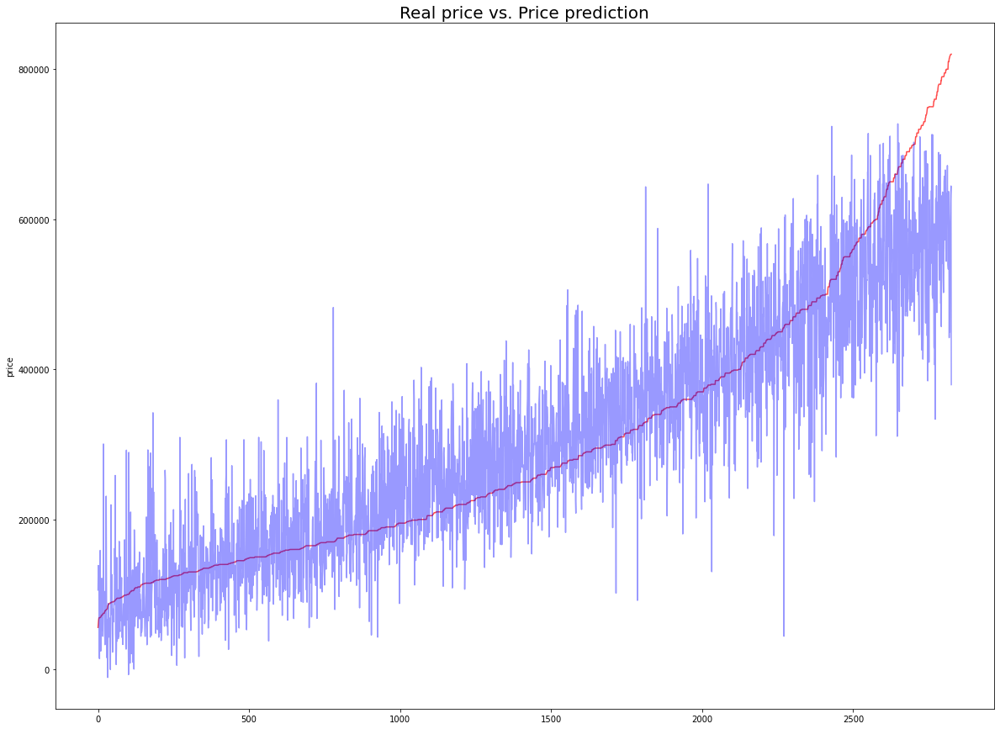

In [ ]:
plot_error(y_test,Lasso_yhat)

### **Neural Network Regression**

In [ ]:
# https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

def neural_regression(optimizer='rmsprop',loss='mean_squared_error',metrics=['mean_squared_error']):
  ANN_model = Sequential()
  ANN_model.add(Dense(units=100, input_dim=len(X_train.columns), kernel_initializer='normal', activation='relu'))
  ANN_model.add(Dense(units=100, kernel_initializer='normal', activation='relu'))
  ANN_model.add(Dense(units=100, kernel_initializer='normal', activation='relu'))
  ANN_model.add(Dense(units=100, kernel_initializer='normal', activation='relu'))
  ANN_model.add(Dense(units=100, kernel_initializer='normal', activation='relu'))
  ANN_model.add(Dense(1, kernel_initializer='normal'))
  ANN_model.compile(loss=loss, optimizer=optimizer, metrics = metrics)
  return ANN_model

In [ ]:
KRegressor = KerasRegressor(neural_regression, verbose=0)
cv = RepeatedKFold(n_splits=4, n_repeats=2, random_state=32)
parameters = {'batch_size': [10,20,30],
              'epochs': [250,300,500],
              'optimizer':['SGD', 'RMSprop', 'Adam'],
              #'optimizer':['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam'],
              'loss':['mean_squared_error'],
              'metrics':['mean_squared_error']}

grid_search_cv(X_train, y_train, KRegressor, parameters, cv)

Fitting 8 folds for each of 27 candidates, totalling 216 fits


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:703: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


In [ ]:
ANN_model = KerasRegressor(neural_regression, batch_size = 40, epochs = 240, optimizer = 'SGD', loss='mean_squared_error', metrics = ['mean_squared_error'], verbose=0)
#ANN_model = KerasRegressor(neural_regression, batch_size = 30, epochs = 300, optimizer = 'Adam', loss='mean_squared_error', metrics = ['mean_squared_error'], verbose=0)

ANN_model.fit(X_train, y_train)

KerasRegressor(
	model=<function neural_regression at 0x7f8f891d9200>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=SGD
	loss=mean_squared_error
	metrics=['mean_squared_error']
	batch_size=40
	validation_batch_size=None
	verbose=0
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=240
)

In [ ]:
#Prediction
ANN_yhat = ANN_model.predict(X_test)
#Evaluation
model_evaluations_df = pd.concat([model_evaluations_df,model_evaluation(y_test,ANN_yhat,'Neural Network Regression')]).reset_index(drop=True)
model_evaluations_df

,model,r2,mse,rmse,mae,hyperparameters
0,Decision Tree Regression,0.7737,7.175461e+09,84708.0919,55483.0356,None
1,AdaBoost Regressor,0.8431,4.974815e+09,70532.3669,47067.3533,None
2,Ridge Regression,0.7656,7.430554e+09,86200.6597,63338.4353,None
3,Lasso Regression,0.7656,7.430211e+09,86198.6711,63337.5544,None
4,Neural Network Regression,0.4809,1.645733e+10,128286.1349,88951.5169,None


In [ ]:
test_model_predictions(df_model,ANN_model)

,index,real_price,predicted_price,difference
0,11296,149000,187408,-38408


Text(0.5, 1.0, 'Neural Network Regression - Keras Regressor - Matching predictions with actual price values')

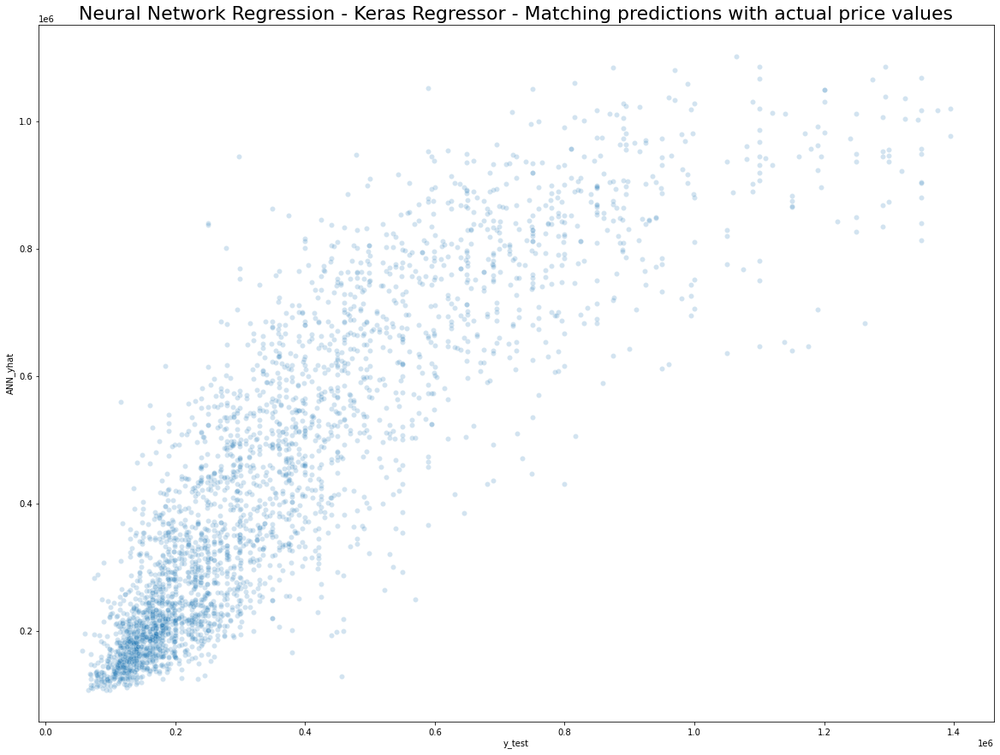

In [ ]:
fig, ax = plt.subplots(1,1,figsize = (20,15))
sns.scatterplot(x=y_test,y=ANN_yhat, alpha=.2, ax=ax)
ax.set(xlabel='y_test', ylabel='ANN_yhat')
ax.set_title('Neural Network Regression - Keras Regressor - Matching predictions with actual price values',fontsize=22)

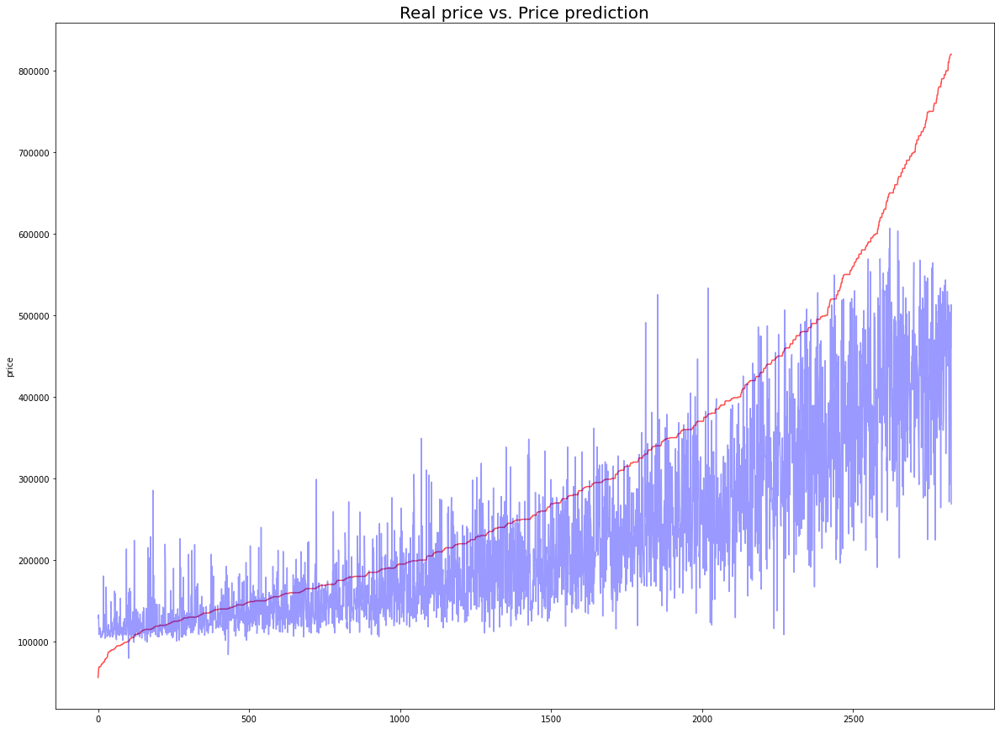

In [ ]:
plot_error(y_test,ANN_yhat)

## **Streamlit from Colab with ngrok**

In [ ]:
# Para que funcione hay que pagar (he probado xD)
# https://towardsdev.com/create-a-runtime-dashboard-from-colab-via-streamlit-pyngrok-3c5588cfcfc5

In [ ]:
!pip install pyngrok
!pip install streamlit

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 745 kB 4.8 MB/s 
  Created wheel for pyngrok: filename=pyngrok-5.1.0-py3-none-any.whl size=19007 sha256=99b1013e97905c7b81c26ced9cd728b078e94d9cfa108440b7453fb9f1899e8a
  Stored in directory: /root/.cache/pip/wheels/bf/e6/af/ccf6598ecefecd44104069371795cb9b3afbcd16987f6ccfb3
Successfully built pyngrok
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.2 MB 3.0 MB/s 
     |████████████████████████████████| 4.7 MB 32.8 MB/s 
     |████████████████████████████████| 237 kB 51.5 MB/s 
     |████████████████████████████████| 182 kB 35.4 MB/s 
     |████████████████████████████████| 78 kB 6.6 MB/s 
     |████████████████████████████████| 164 kB 53.4 MB/s 
     |████████████████████████████████| 63 kB 1.6 MB/s 
     |████████████████████████████████| 51 kB 6.7 MB/s 
  

In [ ]:
from pyngrok import ngrok
import pickle

In [ ]:
df_model.columns

Index(['price', 'size', 'hasParking', 'roomNumber', 'bathNumber',
       'hasSwimmingPool', 'hasTerrace', 'hasGarden', 'hasLift',
       'isGoodCondition', 'isNeedsRenovating', 'isNewDevelopment',
       'heatingType_target', 'floor_target', 'district_target',
       'propertyType_lvl2_target'],
      dtype='object')

In [ ]:
# Guardado de dataframe en archivo pickle
with open('test_dataframe.pkl','wb') as tdf:
  pickle.dump(df_model, tdf)

# Guardado de modelos en archivos pickle
model_names_ls = ['LR_model','XGB_model','LGBM_model','ADA_model','GBR_model','RFR_model','CB_model','SVR_model','DTR_model','Ridge_model','Lasso_model']
model_ls = [LR_model,XGB_model,LGBM_model,ADA_model,GBR_model,RFR_model,CB_model,SVR_model,DTR_model,Ridge_model,Lasso_model]

def pickle_dump(model_name, model):
  with open('%s.pkl' % model_name,'wb') as pk:
    pickle.dump(model, pk)
  
  return print(f'{model_name} saved as pickle file.')

[pickle_dump(name,model) for (name,model) in zip(model_names_ls,model_ls)]

#with open('gradientboosting.pkl', 'wb') as gb:
#  pickle.dump(GBR_model, gb)

NameError: ignored

In [ ]:
%%writefile app.py

import streamlit as st
import pandas as pd
import pickle

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

model_names_ls = ['LR_model','XGB_model','LGBM_model','ADA_model','GBR_model','RFR_model','CB_model','SVR_model','DTR_model','Ridge_model','Lasso_model']


def pickle_load(model_name):
  with open('%s.pkl' % model_name,'rb') as pk:
    model = pickle.load(pk)
  
  return model

model_dict = {model:pickle_load(model) for model in load_model_ls}

with open('test_dataframe.pkl','rb') as tdf:
  st_test_df = pd.DataFrame(pickle.load(tdf))

def main():
  def user_input_parameters():
    st_list_neighbourhood = ['Arganzuela', 'Barajas', 'Barrio de Salamanca', 'Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal', 'Fuencarral', 'Hortaleza', 'Latina', 'Moncloa', 'Moratalaz', 'Puente de Vallecas', 'Retiro', 'San Blas', 'Tetuán', 'Usera', 'Vicálvaro', 'Villa de Vallecas', 'Villaverde']
    st_list_heating = ['Bomba de frío/calor', 'Electricidad', 'Eléctrica', 'Gas', 'Gas natural', 'Gas propano/butano', 'Gasoil', 'No dispone de calefacción', 'Solar', 'no info - heating']
    st_list_floor = ['-1', '0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '26', '3', '4', '40', '5', '6', '7', '8', '9', 'doesnotapply', 'entre', 'noinfo', 'semi-sótano']
    st_list_type = ['chalet', 'duplex', 'loft', 'piso', 'studio']

    st_neighbourhood = st.sidebar.selectbox('Neighbourhood',st_list_neighbourhood)
    st_type = st.sidebar.selectbox('Type',st_list_type)
    st_floor = st.sidebar.selectbox('Floor',st_list_floor)
    st_size = st.sidebar.slider('Size (m2)',50,500,150)
    st_rooms = st.sidebar.slider('Room number',1,10,3)
    st_bathrooms = st.sidebar.slider('Bath number',1,10,3)
    st_hasparking = st.sidebar.selectbox('Parking',[True,False])
    st_hasswimmingpool = st.sidebar.selectbox('Swimmingpool',[True,False])
    st_hasterrace = st.sidebar.selectbox('Terrace',[True,False])
    st_hasgarden = st.sidebar.selectbox('Garden',[True,False])
    st_haslift = st.sidebar.selectbox('Lift',[True,False])
    st_heating = st.sidebar.selectbox('Heating',st_list_heating)
    st_isgoodcondition = st.sidebar.selectbox('Good condition',[True,False])
    st_isneedsrenovating = st.sidebar.selectbox('Needs renovating',[True,False])
    st_isnewdevelopment = st.sidebar.selectbox('New development',[True,False])
    
    st_data = {'neighbourhood': st_neighbourhood,
               'type':st_type,
               'floor':st_floor,
               'size':st_size,
               'hasParking':int(st_hasparking),
               'roomNumber':st_rooms, 
               'bathNumber': st_bathrooms, 
               'hasSwimmingPool':int(st_hasswimmingpool),
               'hasTerrace':int(st_hasterrace),
               'hasGarden':int(st_hasgarden),
               'hasLift':int(st_haslift),
               'heating':st_heating,
               'isGoodCondition':int(st_isgoodcondition),
               'isNeedsRenovating':int(st_isneedsrenovating),
               'isNewDevelopment':int(st_isnewdevelopment)
               }
    #st.write(st_data)
    st_features = pd.DataFrame(st_data, index=[0]).reset_index(drop=True)
    return st_features

  def st_onehotencoding(st_df):
    # Debe recorrer los valores de la fila y si coincide con los nombres de las columnas del df onehoteado poner 1.0, si no 0.0
    #test_df_columns_ohe = ['Bomba de frío/calor', 'Electricidad', 'Eléctrica', 'Gas', 'Gas natural', 'Gas propano/butano', 'Gasoil', 'No dispone de calefacción', 'Solar', 'no info - heating', '-1', '0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '26', '3', '4', '40', '5', '6', '7', '8', '9', 'doesnotapply', 'entre', 'noinfo', 'semi-sótano', 'Arganzuela', 'Barajas', 'Barrio de Salamanca', 'Carabanchel', 'Centro', 'Chamartín', 'Chamberí', 'Ciudad Lineal', 'Fuencarral', 'Hortaleza', 'Latina', 'Moncloa', 'Moratalaz', 'Puente de Vallecas', 'Retiro', 'San Blas', 'Tetuán', 'Usera', 'Vicálvaro', 'Villa de Vallecas', 'Villaverde', 'chalet', 'duplex', 'loft', 'piso', 'studio']
    dict_ohe = {'Bomba de frío/calor': 0.0, 'Electricidad': 0.0, 'Eléctrica': 0.0, 'Gas': 0.0, 'Gas natural': 0.0, 'Gas propano/butano': 0.0, 'Gasoil': 0.0, 'No dispone de calefacción': 0.0, 'Solar': 0.0, 'no info - heating': 0.0, '-1': 0.0, '0': 0.0, '1': 0.0, '10': 0.0, '11': 0.0, '12': 0.0, '13': 0.0, '14': 0.0, '15': 0.0, '16': 0.0, '17': 0.0, '18': 0.0, '19': 0.0, '2': 0.0, '20': 0.0, '21': 0.0, '26': 0.0, '3': 0.0, '4': 0.0, '40': 0.0, '5': 0.0, '6': 0.0, '7': 0.0, '8': 0.0, '9': 0.0, 'doesnotapply': 0.0, 'entre': 0.0, 'noinfo': 0.0, 'semi-sótano': 0.0, 'Arganzuela': 0.0, 'Barajas': 0.0, 'Barrio de Salamanca': 0.0, 'Carabanchel': 0.0, 'Centro': 0.0, 'Chamartín': 0.0, 'Chamberí': 0.0, 'Ciudad Lineal': 0.0, 'Fuencarral': 0.0, 'Hortaleza': 0.0, 'Latina': 0.0, 'Moncloa': 0.0, 'Moratalaz': 0.0, 'Puente de Vallecas': 0.0, 'Retiro': 0.0, 'San Blas': 0.0, 'Tetuán': 0.0, 'Usera': 0.0, 'Vicálvaro': 0.0, 'Villa de Vallecas': 0.0, 'Villaverde': 0.0, 'chalet': 0.0, 'duplex': 0.0, 'loft': 0.0, 'piso': 0.0, 'studio': 0.0}
    
    st_features_ohe = pd.DataFrame(dict_ohe,index=[0])
    #st.write(st_features_ohe)

    #st.write(st_df)
    for field in ['neighbourhood','type','floor','heating']:
      for column in list(dict_ohe.keys()):
        if st_df[st_df.index == 0][field].values[0] == column:
          st_features_ohe[column] = [round(1.0,1)]
          break
    
    #st.write(st_features_ohe)
    st_df = st_df.drop(['neighbourhood','type','floor','heating'],axis=1).reset_index(drop=True)
    st_features_ohe = pd.concat([st_df,st_features_ohe],axis=1).reset_index(drop=True)


    return st_features_ohe

  st_df_ohe = pd.DataFrame()

  #SIDEBAR
  st.sidebar.header('User input parameters')
  st_df = user_input_parameters()
  st_df_ohe = st_onehotencoding(st_df)
  st_option = ['Linear Regression','XGB Regression','CatBoost Regression','AdaBoost Regression','LGBM Regression','Gradient Boosting Regression','Random Forest Regression','Decission Tree Regression','Support Vector Machine','SGD Regression','Ridge Regression','Lasso Regression']
  st_model = st.sidebar.selectbox('Elige el modelo', st_option)

  #BODY
  st.title('Real Estate Predictions')
  st.subheader('Based on Idealista and Fotocasa datasets.')
  st.write('These are the parameters selected by the user:')
  st.subheader(st_model)
  st.write(st_df)

  if st.button('RUN'):
    if st_model == 'Linear Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["LR_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'XGB Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["XGB_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Gradient Boosting Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["GBR_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Random Forest Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["RFR_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Decission Tree Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["DTR_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Support Vector Machine':
      st.success(f'El precio de la vivienda será de: {model_dict["SVR_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'CatBoost Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["CB_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'AdaBoost Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["ADA_model"].predict(st_df_ohe)[0].round(0)} €')
      elif st_model == 'LGBM Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["LGBM_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Ridge Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["Ridge_model"].predict(st_df_ohe)[0].round(0)} €')
    elif st_model == 'Lasso Regression':
      st.success(f'El precio de la vivienda será de: {model_dict["Lasso_model"].predict(st_df_ohe)[0].round(0)} €')

if __name__ == '__main__':
  main()

Overwriting app.py


In [ ]:
ngrok.set_auth_token('2GwlmMh6cE7BEEXmS5AE3ee0nNV_5tEDhxkuk4RKbTAYddDbc')

In [ ]:
# Para que funcione debe dejarse el proceso en ejecución
public_url = ngrok.connect(port='80')
print(public_url)
!streamlit run --server.port 80 app.py >/dev/null
ngrok.kill()
print("Visualización terminada.")

NgrokTunnel: "http://a346af6e13d5.ngrok.io" -> "http://localhost:80"
Visualización terminada.


In [ ]:
# Para ver si el proceso está en marcha
!pgrep streamlit

In [ ]:
# Para ver las transmisiones activas en NGROK
tunnels = ngrok.get_tunnels()
tunnels

[]

In [ ]:
# Para eliminar todos los procesos, no se pueden ejecutar dos a la vez en la versión gratuita
ngrok.kill()

In [ ]:
!kill 13581

In [ ]:
!pwd

/content


In [ ]:
#Previsualización de la prueba:

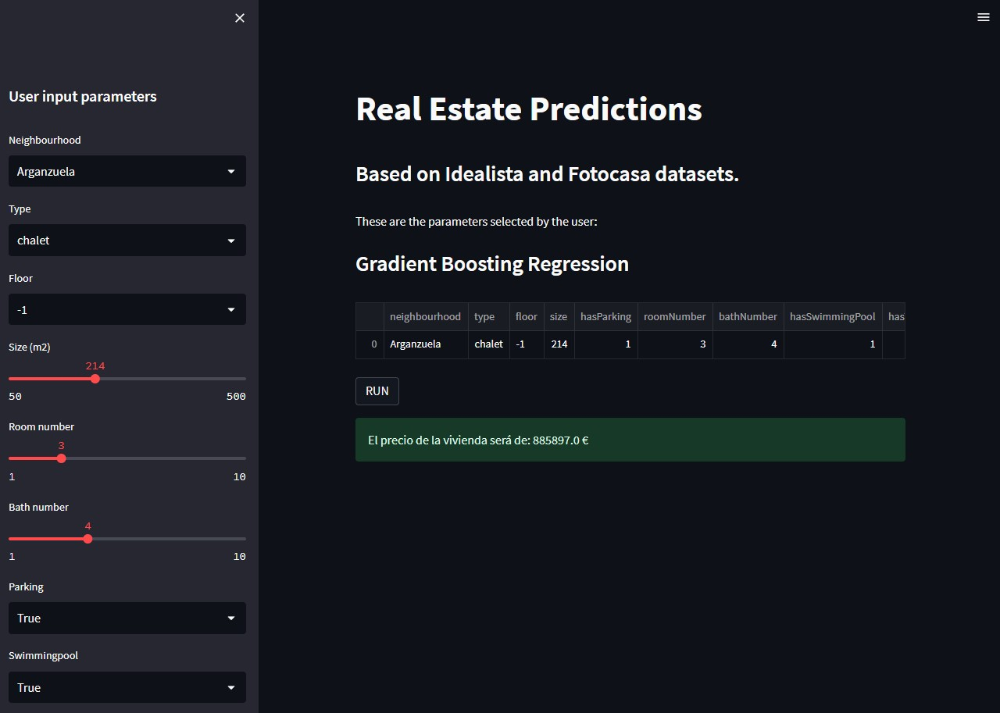

# **GUARDADO**

#### **IQR, percentile, std methods**

In [ ]:
def are_outliers(feature, level=1, continuous=False, log=False):
  def iqr_outliers(feature):
    q1 = np.percentile(feature,25,interpolation='midpoint')
    q3 = np.percentile(feature,75,interpolation='midpoint')

    iqr = q3-q1
    upper = q3+1.5*iqr
    lower = q1-1.5*iqr

    return [upper,lower]

  def percentile_outliers(feature,level):
    upper = np.percentile(feature, 100 - level) 
    lower = np.percentile(feature, level) 
    
    return [upper,lower]

  def std_outliers(feature): 
    std = np.std(feature) 
    upper = np.mean(feature) + 3 * std 
    lower = np.mean(feature) - 3 * std 
      
    return [upper,lower]

  if log is True:
    feature = np.log(feature + 1)

  pct_range = percentile_outliers(feature, level)
  iqr_range = iqr_outliers(feature)
  std_range = std_outliers(feature)

  if continuous is False:
    low_limit = np.min(feature)
    high_limit = np.max([pct_range[1],
                        iqr_range[1],
                        std_range[1]])
  elif continuous is True:
    low_limit = np.min([pct_range[0],
                        iqr_range[0],
                        std_range[0]])
    high_limit = np.max([pct_range[1],
                        iqr_range[1],
                        std_range[1]])
  outlier = feature.between(low_limit, high_limit)
  return outlier

In [ ]:
price_outliers = are_outliers(df['price'], log = False)
df[price_outliers == True]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
72,98066433,piso,estudio en venta en calle laguna del marquesad...,77100,68,1,0,1,0,0,...,1,0,0,no info - heating,1,Villaverde,idealista,studio,1133.82,4
142,97774609,piso,"piso en venta en calle de cuevas, 11",69999,26,0,1,1,0,0,...,1,0,0,no info - heating,semi-sótano,Tetuán,idealista,piso,2692.27,3
154,98446279,piso,"piso en venta en calle enrique velasco, 24",82500,27,0,1,1,0,0,...,1,0,0,Bomba de frío/calor,3,Puente de Vallecas,idealista,piso,3055.56,4
212,95859583,piso,piso en venta en san cristóbal,80000,59,0,3,1,0,0,...,1,0,0,no info - heating,noinfo,Villaverde,idealista,piso,1355.93,5
272,98144852,piso,dúplex en venta en calle guindos,69900,20,0,1,1,0,0,...,1,0,0,Eléctrica,0,Tetuán,idealista,duplex,3495.00,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24307,165209318,piso,"Piso en venta en Calle de Godella, 50",79000,63,0,2,1,0,1,...,1,0,1,no info - heating,9,Villaverde,fotocasa,piso,1253.97,6
24312,164659737,piso,Planta baja en venta en Sanz Raso,75000,65,0,1,1,0,0,...,1,0,1,no info - heating,0,Puente de Vallecas,fotocasa,piso,1153.85,4
24423,163799803,piso,Piso en venta,69000,39,0,2,1,0,0,...,1,0,1,no info - heating,7,Villaverde,fotocasa,piso,1769.23,5
24483,163782869,piso,Planta baja en venta en Rocafort,70000,60,0,3,1,0,0,...,1,0,1,no info - heating,3,Villaverde,fotocasa,piso,1166.67,6


In [ ]:
size_outliers = are_outliers(df['size'],log = True)
df[size_outliers == True]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
79,97669605,piso,"piso en venta en calle carolinas, 24",120000,24,0,1,1,0,0,...,0,1,0,no info - heating,0,Tetuán,idealista,piso,5000.00,3
142,97774609,piso,"piso en venta en calle de cuevas, 11",69999,26,0,1,1,0,0,...,1,0,0,no info - heating,semi-sótano,Tetuán,idealista,piso,2692.27,3
154,98446279,piso,"piso en venta en calle enrique velasco, 24",82500,27,0,1,1,0,0,...,1,0,0,Bomba de frío/calor,3,Puente de Vallecas,idealista,piso,3055.56,4
272,98144852,piso,dúplex en venta en calle guindos,69900,20,0,1,1,0,0,...,1,0,0,Eléctrica,0,Tetuán,idealista,duplex,3495.00,4
488,96384714,piso,estudio en venta en avenida de la ciudad de ba...,126500,26,0,0,1,0,0,...,1,0,0,No dispone de calefacción,2,Retiro,idealista,studio,4865.38,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23938,165283206,piso,Piso en venta en Garcia Paredes,99000,24,0,1,1,0,1,...,1,0,1,no info - heating,0,Chamberí,fotocasa,piso,4125.00,5
23967,165325553,piso,Piso en venta en Andorra,149900,30,0,1,1,0,1,...,1,0,1,Electricidad,3,Hortaleza,fotocasa,piso,4996.67,6
24263,163863875,piso,Apartamento en venta,99000,30,0,1,1,0,0,...,1,0,1,no info - heating,0,Arganzuela,fotocasa,piso,3300.00,4
24351,165457133,piso,Planta baja en venta en C/ Noviembre,115000,27,0,1,1,0,0,...,1,0,1,no info - heating,0,San Blas,fotocasa,piso,4259.26,4


In [ ]:
roomNumber_outliers = are_outliers(df['roomNumber'])
df[roomNumber_outliers == True]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
37,98289003,piso,estudio en venta en calle de torrelaguna,228000,39,1,0,1,1,0,...,1,0,0,Bomba de frío/calor,1,Ciudad Lineal,idealista,studio,5846.15,7
70,98095952,piso,estudio en venta en calle nuestra señora de gr...,170000,78,0,0,2,0,0,...,1,0,0,Eléctrica,0,Carabanchel,idealista,studio,2179.49,4
72,98066433,piso,estudio en venta en calle laguna del marquesad...,77100,68,1,0,1,0,0,...,1,0,0,no info - heating,1,Villaverde,idealista,studio,1133.82,4
99,92465020,piso,estudio en venta en calle sor angela de la cru...,298000,47,0,0,1,0,0,...,1,0,0,Bomba de frío/calor,3,Tetuán,idealista,studio,6340.43,4
131,85460115,piso,estudio en venta en sierra contraviesa,92000,55,0,0,1,0,1,...,1,0,0,Eléctrica,1,Puente de Vallecas,idealista,studio,1672.73,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24076,165110029,piso,Estudio en venta en Butron,220000,60,1,0,1,1,1,...,1,0,1,no info - heating,0,San Blas,fotocasa,studio,3666.67,7
24132,165213433,piso,Loft en venta,125000,36,0,0,1,0,0,...,1,0,1,no info - heating,0,San Blas,fotocasa,loft,3472.22,3
24222,165233951,piso,Piso en venta en Santuario,119500,55,0,0,1,0,0,...,1,0,1,no info - heating,9,Usera,fotocasa,piso,2172.73,3
24225,165233409,piso,Piso en venta en Cacereños,104600,72,0,0,1,0,0,...,1,0,1,no info - heating,0,Villaverde,fotocasa,piso,1452.78,3


In [ ]:
bathNumber_outliers = are_outliers(df['bathNumber'])
df[bathNumber_outliers == True]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
1,94343260,piso,piso en venta en palomeras bajas,99000,56,0,3,1,0,0,...,1,0,0,no info - heating,noinfo,Puente de Vallecas,idealista,piso,1767.86,5
3,97132927,piso,"piso en venta en calle benarrabá, 3",136000,55,0,2,1,0,0,...,1,0,0,Eléctrica,3,Puente de Vallecas,idealista,piso,2472.73,5
4,97611862,piso,"piso en venta en calle de la povedilla, 4",574300,94,0,4,1,0,0,...,1,0,0,no info - heating,4,Barrio de Salamanca,idealista,piso,6109.57,7
6,98288913,piso,piso en venta en arcos,119000,52,0,3,1,0,0,...,1,0,0,No dispone de calefacción,noinfo,San Blas,idealista,piso,2288.46,6
9,98231784,piso,piso en venta en calle de monseñor oscar romero,170000,80,0,2,1,0,0,...,1,0,0,Gas natural,1,Carabanchel,idealista,piso,2125.00,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24483,163782869,piso,Planta baja en venta en Rocafort,70000,60,0,3,1,0,0,...,1,0,1,no info - heating,3,Villaverde,fotocasa,piso,1166.67,6
24485,165346834,piso,Piso en venta,75000,62,0,3,1,0,0,...,1,0,1,no info - heating,0,Usera,fotocasa,piso,1209.68,6
24489,164603116,piso,Piso en venta en Calle de Manuel Noya,243000,91,0,3,1,0,1,...,1,0,1,no info - heating,11,Usera,fotocasa,piso,2670.33,8
24490,158195837,piso,Ático en venta en Calle de Eloy Gonzalo,550000,120,1,2,1,0,0,...,1,0,1,Electricidad,8,Chamberí,fotocasa,piso,4583.33,8


In [ ]:
df_clean = df[(price_outliers == False) & (size_outliers == False) & (roomNumber_outliers == False) & (bathNumber_outliers == True)]
df_clean.shape

(8360, 22)

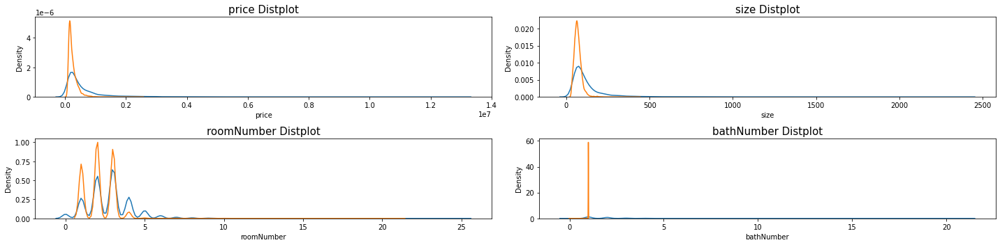

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size','roomNumber','bathNumber']].columns)[p]
  ax.set_title(f"{column} Distplot",fontsize=15) 
  sns.kdeplot(x=df[column], ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size','roomNumber','bathNumber']].columns)[p]
  ax.set_title(f"{column} Distplot",fontsize=15) 
  sns.kdeplot(x=df_clean[column], ax=ax);
  plt.tight_layout()

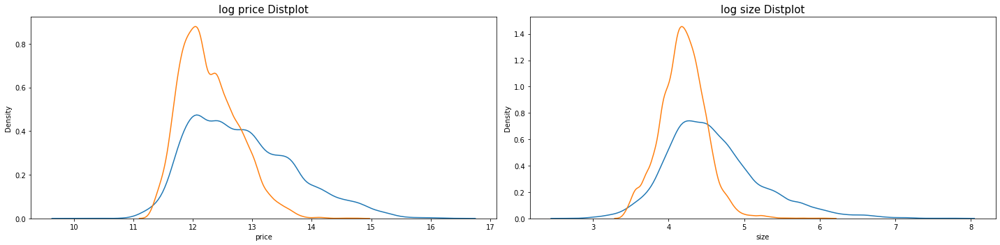

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(20,5))

for p, ax in enumerate(axes.flat):
  column = list(df[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df[column]), ax=ax);
  plt.tight_layout()

for p, ax in enumerate(axes.flat):
  column = list(df_clean[['price','size']].columns)[p]
  #print(p,df.drop(['id','price','price_m2','temp_score','dataset','title'],axis=1).columns[p])
  ax.set_title(f"log {column} Distplot",fontsize=15) 
  sns.kdeplot(x=np.log(df_clean[column]), ax=ax);
  plt.tight_layout()

#### **DBSCAN Clustering method**

In [ ]:
from sklearn.cluster import DBSCAN
def remove_outliers_DBSCAN(df,eps,min_samples):
    outlier_detection = DBSCAN(eps = eps, min_samples = min_samples)
    clusters = outlier_detection.fit_predict(df.values.reshape(-1,1))
    data = pd.DataFrame()
    data['cluster'] = clusters
    return data['cluster']

#PRICE
clusters=remove_outliers_DBSCAN((df['price']),0.5,5)
clusters.value_counts().sort_values(ascending=False)

df_cluster=pd.DataFrame(clusters)
ind_outlier_prices=df_cluster.index[df_cluster['cluster']==-1]
print(len(ind_outlier_prices))

'''
# visualize outputs
colors = df.index.isin(ind_outlier_prices)
plt.scatter(df["price"],df["price"], c = colors)
'''

#SIZE
clusters=remove_outliers_DBSCAN((df['size']),0.5,5)
clusters.value_counts().sort_values(ascending=False)

df_cluster=pd.DataFrame(clusters)
ind_outlier_sizes=df_cluster.index[df_cluster['cluster']==-1]
print(len(ind_outlier_sizes))

#ROOMNUMBER
clusters=remove_outliers_DBSCAN((df['roomNumber']),0.5,5)
clusters.value_counts().sort_values(ascending=False)

df_cluster=pd.DataFrame(clusters)
ind_outlier_roomnumber=df_cluster.index[df_cluster['cluster']==-1]
print(len(ind_outlier_roomnumber))

#BATHNUMBER
clusters=remove_outliers_DBSCAN((df['bathNumber']),0.5,5)
clusters.value_counts().sort_values(ascending=False)

df_cluster=pd.DataFrame(clusters)
ind_outlier_bathnumber=df_cluster.index[df_cluster['cluster']==-1]
print(len(ind_outlier_bathnumber))

#https://towardsdatascience.com/practical-implementation-of-outlier-detection-in-python-90680453b3ce
#https://medium.com/@dilip.voleti/dbscan-algorithm-for-fraud-detection-outlier-detection-in-a-data-set-60a10ad06ea8

2739
559
11
7


In [ ]:
df[df.index.isin(ind_outlier_sizes)]

,id,propertyType,title,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,...,isGoodCondition,isNeedsRenovating,isNewDevelopment,heatingType,floor,district,dataset,propertyType_lvl2,price_m2,temp_score
4,97611862,piso,"piso en venta en calle de la povedilla, 4",574300,94,0,4,1,0,0,...,1,0,0,no info - heating,4,Barrio de Salamanca,idealista,piso,6109.57,7
69,98480539,piso,piso en venta en los ángeles,109500,61,0,2,1,0,0,...,1,0,0,no info - heating,noinfo,Villaverde,idealista,piso,1795.08,4
94,97481569,piso,"piso en venta en santa brígida, 15",201500,37,0,1,1,0,0,...,0,1,0,no info - heating,0,Centro,idealista,piso,5445.95,3
123,98304860,piso,piso en venta en calle de la imagen,155000,75,0,3,1,0,1,...,1,0,0,no info - heating,3,Puente de Vallecas,idealista,piso,2066.67,7
262,98256302,piso,"piso en venta en calle del general pardiñas, 108",630000,90,1,3,1,0,0,...,1,0,0,Gasoil,5,Barrio de Salamanca,idealista,piso,7000.00,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18349,163902567,piso,Piso en venta en Calle del General Cabrera,309000,88,0,4,2,0,0,...,1,0,1,Electricidad,3,Tetuán,fotocasa,piso,3511.36,9
18396,164410247,piso,Piso en venta en Calle del Jaspe,175000,97,0,3,2,0,1,...,1,0,1,Gas natural,7,Usera,fotocasa,piso,1804.12,9
18647,165165367,piso,Piso en venta en Calle del Comandante Benítez,245000,87,0,3,2,0,0,...,1,0,1,Gas natural,7,Arganzuela,fotocasa,piso,2816.09,9
18705,165124654,piso,Piso en venta,88800,32,0,1,1,0,0,...,0,1,1,no info - heating,3,Carabanchel,fotocasa,piso,2775.00,4


In [ ]:
df_clean = df[(df.index.isin(ind_outlier_prices) == False) & (df.index.isin(ind_outlier_sizes) == False) & (df.index.isin(ind_outlier_roomnumber) == False) & (df.index.isin(ind_outlier_bathnumber) == False)]
df_clean.shape

(16315, 22)

In [ ]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
price,16315.0,579315.385167,757834.414791,11900.00,185000.00,328000.0,650000.00,13000000.0
size,16315.0,124.118603,124.614973,15.00,64.00,90.0,135.00,2400.0
hasParking,16315.0,0.302911,0.459531,0.00,0.00,0.0,1.00,1.0
roomNumber,16315.0,2.740975,1.425511,0.00,2.00,3.0,3.00,25.0
bathNumber,16315.0,1.835244,1.192852,0.00,1.00,2.0,2.00,17.0
hasSwimmingPool,16315.0,0.173583,0.378762,0.00,0.00,0.0,0.00,1.0
hasTerrace,16315.0,0.387680,0.487236,0.00,0.00,0.0,1.00,1.0
hasGarden,16315.0,0.181796,0.385688,0.00,0.00,0.0,0.00,1.0
hasLift,16315.0,0.674042,0.468746,0.00,0.00,1.0,1.00,1.0
isGoodCondition,16315.0,0.818756,0.385232,0.00,1.00,1.0,1.00,1.0


Now we need to encode the qualitative columns (propertyType and district)

With propertyType we can use the one hot encoding

In [ ]:
df = pd.merge(df,pd.get_dummies(df['propertyType']),left_index=True,right_index=True)

District can be encoded as the median of its properties' prices per m2

In [ ]:
# Idealista often suffer from fraudolent announces so it's better to aggregate 
# the price_m2_per_area using the median as it is more robust than the mean
price_m2_per_area = df[['district','price_m2']].groupby(['district']).median().reset_index()
price_m2_per_area = {key:value for key,value in price_m2_per_area.values}

df['district_price'] = df['district'].map(price_m2_per_area).astype(float).round(2)

In [ ]:
df.sort_values('price_m2',ascending=True)

,id,propertyType,price,size,hasParking,roomNumber,bathNumber,hasSwimmingPool,hasTerrace,hasGarden,...,isNewDevelopment,heatingType,floor,district,dataset,casa rural,chalet,piso,price_m2,district_price
9329,98106127,piso,75000,138.0,1,4,2,0,0,0,...,0,no info,11,Fuencarral,idealista,0,0,1,543.48,4315.04
6664,97299195,piso,440000,651.0,0,0,1,0,0,0,...,0,no info,bajo,Usera,idealista,0,0,1,675.88,2688.10
7836,97308798,piso,85000,117.0,0,3,1,0,0,0,...,0,no info,bajo,Puente de Vallecas,idealista,0,0,1,726.50,2481.48
5614,34729747,piso,160000,220.0,0,0,1,0,0,0,...,0,no info,bajo,Latina,idealista,0,0,1,727.27,2214.29
7559,96322586,chalet,61000,82.0,0,2,1,0,0,0,...,0,Gas natural,does not apply,Puente de Vallecas,idealista,0,1,0,743.90,2481.48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5471,97021860,piso,9500000,500.0,1,4,5,0,0,0,...,0,no info,3,Barrio de Salamanca,idealista,0,0,1,19000.00,7468.88
19,98429794,piso,7900000,407.0,0,5,4,0,1,0,...,0,no info,6,Barrio de Salamanca,idealista,0,0,1,19410.32,7468.88
8461,96528184,chalet,4000000,200.0,0,5,5,1,0,1,...,0,no info,does not apply,Moncloa,idealista,0,1,0,20000.00,4418.60
2819,98301087,piso,3200000,151.0,1,2,3,1,0,0,...,0,no info,3,Barrio de Salamanca,idealista,0,0,1,21192.05,7468.88


In [ ]:
fig, ax = plt.subplots(figsize=(30,10))
ax.set_title('Distribution of price_m2 per ')